### Problem:
We minimise

$$\frac{||\nabla u||_\infty}{||u||_2} = \dfrac{\sup_\Omega{|\nabla u|_2}}{(\int_\Omega |u|^2 \text{d}V)^{1/2}}$$

using the weighted loss function 

$$\frac{\max_\Omega{|\nabla u|_2}}{\big(\int_{\Omega} |u|^2 \text{d}V\big)^{1/2}} + 100 \bigg|\int_\Omega |u|^2 \text{d}V - 1\bigg|^2 + 30 \int_{\partial\Omega} |u|^2 \text{d}V$$

In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim, autograd
from matplotlib import pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.cbook as cbook
import matplotlib.patches as patches
from ipywidgets import IntProgress
from IPython.display import display
import time

--------------------------------------------------------------------------------------------------------------------------------

# Architectures

## Shallow NN, Tanh Activation

In [2]:
class srnn_Tanh(nn.Module):
    """
    srnn -- Shallow Ritz Neural Network

    Implements a network with single hidden layer

    Parameters:
        in_N  -- input dimension
        out_N -- output dimension
        m     -- width of layers that form blocks
        depth -- number of blocks to be stacked
        phi   -- the activation function
    """

    def __init__(self, in_N, m, out_N, depth=0):
        super(srnn_Tanh, self).__init__()
        
        # set parameters
        self.in_N = in_N
        self.m = m
        self.out_N = out_N
        self.depth = depth
        
        self.input = nn.Linear(in_N, m)
        self.hidden = nn.Linear(m, m)
        self.output = nn.Linear(m, out_N)
        self.tanh = nn.Tanh()

    def forward(self, x):
        x = self.tanh(self.input(x))
        x = self.tanh(self.hidden(x))
        x = self.output(x)
        return x

## Shallow NN, ReLU Activation

In [3]:
class srnn_ReLU(nn.Module):
    """
    srnn -- Shallow Ritz Neural Network

    Implements a network with single hidden layer

    Parameters:
        in_N  -- input dimension
        out_N -- output dimension
        m     -- width of layers that form blocks
        depth -- number of blocks to be stacked
        phi   -- the activation function
    """

    def __init__(self, in_N, m, out_N, depth=0):
        super(srnn_ReLU, self).__init__()
        
        # set parameters
        self.in_N = in_N
        self.m = m
        self.out_N = out_N
        self.depth = depth
        
        self.input = nn.Linear(in_N, m)
        self.hidden = nn.Linear(m, m)
        self.output = nn.Linear(m, out_N)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.input(x))
        x = self.relu(self.hidden(x))
        x = self.output(x)
        return x

## Feedforward NN, tanh Activation

In [4]:
class drfnn_Tanh(nn.Module):
    """
    drfnn2 -- Deep Ritz Feedforward Neural Network

    Implements a network with single hidden layer

    Parameters:
        in_N  -- input dimension
        out_N -- output dimension
        m     -- width of layers that form blocks
        depth -- number of blocks to be stacked
        phi   -- the activation function
    """

    def __init__(self, in_N, m, out_N, depth=8):
        super(drfnn_Tanh, self).__init__()
        
        # set parameters
        self.in_N = in_N
        self.m = m
        self.out_N = out_N
        self.depth = depth
        
        # list for holding all the layers
        self.stack = nn.ModuleList()

        # add first layer to list
        self.stack.append(nn.Linear(in_N, m))

        # add middle layers to list
        for i in range(depth):
            self.stack.append(nn.Linear(m, m))

        self.output = nn.Linear(m, out_N)
        self.phi = nn.Tanh()

    def forward(self, x):        
        for i in range(len(self.stack)):
            x = self.phi(self.stack[i](x))
        x = self.output(x)
        return x

## Feedforward NN, ReLU Activation

In [5]:
class drfnn_ReLU(nn.Module):
    """
    drnn -- Deep Ritz Feedforward Neural Network

    Implements a network with single hidden layer

    Parameters:
        in_N  -- input dimension
        out_N -- output dimension
        m     -- width of layers that form blocks
        depth -- number of blocks to be stacked
        phi   -- the activation function
    """

    def __init__(self, in_N, m, out_N, depth=8):
        super(drfnn_ReLU, self).__init__()
        
        # set parameters
        self.in_N = in_N
        self.m = m
        self.out_N = out_N
        self.depth = depth
        
        # list for holding all the layers
        self.stack = nn.ModuleList()

        # add first layer to list
        self.stack.append(nn.Linear(in_N, m))

        # add middle layers to list
        for i in range(depth):
            self.stack.append(nn.Linear(m, m))

        self.output = nn.Linear(m, out_N)
        self.relu = nn.ReLU()

    def forward(self, x):        
        for i in range(len(self.stack)):
            x = self.relu(self.stack[i](x))
        x = self.output(x)
        return x

## Residual NN, ReLU Activation

## Original Residual NN, Tanh Activation

In [6]:
class Block(nn.Module):
    """
    IMplementation of the block used in the Deep Ritz
    Paper

    Parameters:
    in_N  -- dimension of the input
    width -- number of nodes in the interior middle layer
    out_N -- dimension of the output
    phi   -- activation function used
    """

    def __init__(self, in_N, width, out_N):
        super(Block, self).__init__()
        # create the necessary linear layers
        self.L1 = nn.Linear(in_N, width)
        self.L2 = nn.Linear(width, out_N)
        # choose appropriate activation function
        self.phi = nn.Tanh()

    def forward(self, x):
        return self.phi(self.L2(self.phi(self.L1(x)))) + x

In [7]:
class drrnn_Tanh(nn.Module):
    """
    drrnn -- Deep Ritz Residual Neural Network

    Implements a network with the architecture used in the
    deep ritz method paper

    Parameters:
        in_N  -- input dimension
        out_N -- output dimension
        m     -- width of layers that form blocks
        depth -- number of blocks to be stacked
        phi   -- the activation function
    """

    def __init__(self, in_N, m, out_N, depth=4):
        super(drrnn_Tanh, self).__init__()
        # set parameters
        self.in_N = in_N
        self.m = m
        self.out_N = out_N
        self.depth = depth
        self.phi = nn.Tanh()
        # list for holding all the blocks
        self.stack = nn.ModuleList()

        # add first layer to list
        self.stack.append(nn.Linear(in_N, m))

        # add middle blocks to list
        for i in range(depth):
            self.stack.append(Block(m, m, m))

        # add output linear layer
        self.stack.append(nn.Linear(m, out_N))

    def forward(self, x):
        # first layer
        for i in range(len(self.stack)):
            x = self.stack[i](x)
        return x

## Original Residual NN, ReLU Activation

In [8]:
class BlockReLU(nn.Module):
    """
    IMplementation of the block used in the Deep Ritz
    Paper

    Parameters:
    in_N  -- dimension of the input
    width -- number of nodes in the interior middle layer
    out_N -- dimension of the output
    phi   -- activation function used
    """

    def __init__(self, in_N, width, out_N):
        super(BlockReLU, self).__init__()
        # create the necessary linear layers
        self.L1 = nn.Linear(in_N, width)
        self.L2 = nn.Linear(width, out_N)
        # choose appropriate activation function
        self.phi = nn.ReLU()

    def forward(self, x):
        return self.phi(self.L2(self.phi(self.L1(x)))) + x

In [9]:
class drrnn_ReLU(nn.Module):
    """
    drrnn -- Deep Ritz Residual Neural Network

    Implements a network with the architecture used in the
    deep ritz method paper

    Parameters:
        in_N  -- input dimension
        out_N -- output dimension
        m     -- width of layers that form blocks
        depth -- number of blocks to be stacked
        phi   -- the activation function
    """

    def __init__(self, in_N, m, out_N, depth=4):
        super(drrnn_ReLU, self).__init__()
        # set parameters
        self.in_N = in_N
        self.m = m
        self.out_N = out_N
        self.depth = depth
        #self.phi = nn.Tanh()
        # list for holding all the blocks
        self.stack = nn.ModuleList()

        # add first layer to list
        self.stack.append(nn.Linear(in_N, m))

        # add middle blocks to list
        for i in range(depth):
            self.stack.append(BlockReLU(m, m, m))

        # add output linear layer
        self.stack.append(nn.Linear(m, out_N))

    def forward(self, x):
        # first layer
        for i in range(len(self.stack)):
            x = self.stack[i](x)
        return x

--------------------------------------------------------------------------------------------------------------------------------

# Sampling in $\mathbb{R}^2$

In [10]:
# SQUARE CENTRED AT ORIGIN, SIDE LENGTH 2: \Omega = (-1,1)^2
def get_interior_points_sq(N=128,d=2):
    """
    randomly sample N points from interior of [-1,1]^2
    """
    return torch.rand(N,d) * 2 - 1

def get_boundary_points_sq(N=32):
    """
    randomly sample N points from boundary of [-1,1]^2
    """
    index1 = torch.rand(N,1) * 2 - 1
    xb2 = torch.cat((index1, torch.ones_like(index1)), dim=1)
    xb3 = torch.cat((index1, torch.full_like(index1, -1)), dim=1)
    xb4 = torch.cat((torch.ones_like(index1), index1), dim=1)
    xb5 = torch.cat((torch.full_like(index1, -1), index1), dim=1)
    xb = torch.cat((xb2, xb3, xb4, xb5), dim=0)

    return xb

In [11]:
# CIRCLE CENTRED AT ORIGIN
def get_interior_points_circle(N=128):
    """
    randomly sample N points from interior of {x^2 + y^2 < 1}
    """
    r = torch.rand(N)
    theta = torch.rand(N)*2*torch.pi
    x = r*torch.cos(theta)
    y = r*torch.sin(theta)
    return torch.cat((x.reshape((-1,1)),y.reshape((-1,1))), dim=1)

def get_boundary_points_circle(N=128):    
    """
    randomly sample N points from boundary of {x^2 + y^2 < 1}
    """
    theta = torch.rand(N)*2*torch.pi
    x = torch.cos(theta)
    y = torch.sin(theta)
    return torch.cat((x.reshape((-1,1)),y.reshape((-1,1))), dim=1)

In [12]:
# SAUSAGE DOMAIN: \Omega = (-1,1)^2 U {r < 2cos(\theta)} U {r < 2cos(\theta + \pi)}
def get_interior_points_sausage(N=160, length=1):
    """
    randomly sample N points from interior of (-1,1)^2 U {r < 2cos(\theta)} U {r < 2cos(\theta + \pi)}
    
    total points = N               = 160
    circle points = N * pi/(4+pi)  ~ 70
    square points = N * 4/(4+pi)   ~ 90
    """
    N_circle = round(N*np.pi/(4 + np.pi))
    r = torch.rand(N_circle)
    theta = torch.rand(N_circle)*2*torch.pi
    
    x = r*torch.cos(theta)
    y = r*torch.sin(theta)
    
    xr_circle = torch.cat((x.reshape((-1,1)),y.reshape((-1,1))), dim=1)
    mask1 = (x <= 0)  # left semicircle
    mask2 = (x > 0)   # right semicircle
    xr_left = xr_circle[mask1, :] - torch.tensor((length,0))    
    xr_right = xr_circle[mask2, :] + torch.tensor((length,0))
    
    N_square = round(N*4/(4 + np.pi))
    xr_square = torch.rand(N_square, 2)*2 - 1
    xr_square = xr_square*torch.tensor((length,1))
    
    xr = torch.cat((xr_left, xr_square, xr_right), dim=0)
    return xr

def get_boundary_points_sausage(N=160, length=1):
    """
    randomly sample N points from boundary of (-1,1)^2 U {r < 2cos(\theta)} U {r < 2cos(\theta + \pi)}
    
    total points = N               = 160
    circle points = N * 2*pi/(4+2*pi)  ~ 98
    square points = N * 4/(4+2*pi)   ~ 62 
    """
    N_circle = round(N*2*np.pi/(4 + 2*np.pi))
    N_square = round(N*4/(4 + 2*np.pi))
    
    # Right circ.
    theta = (torch.rand(N_circle//2)-0.5)*torch.pi
    x1 = torch.cos(theta) + length
    y1 = torch.sin(theta)
    xb1 = torch.cat((x1.reshape((-1,1)),y1.reshape((-1,1))), dim=1)
    
    # Left circ.
    theta = (torch.rand(N_circle//2)+0.5)*torch.pi
    x2 = torch.cos(theta) - length
    y2 = torch.sin(theta)
    xb2 = torch.cat((x2.reshape((-1,1)),y2.reshape((-1,1))), dim=1)
    
    # Top straight
    index = (torch.rand(N_square//2,1)*2 - 1)*length
    xb3 = torch.cat((index, torch.ones_like(index)), dim=1)
    
    # Bottom straight
    xb4 = torch.cat((index, torch.full_like(index, -1)), dim=1)
    
    return torch.cat((xb1,xb2,xb3,xb4), dim=0)

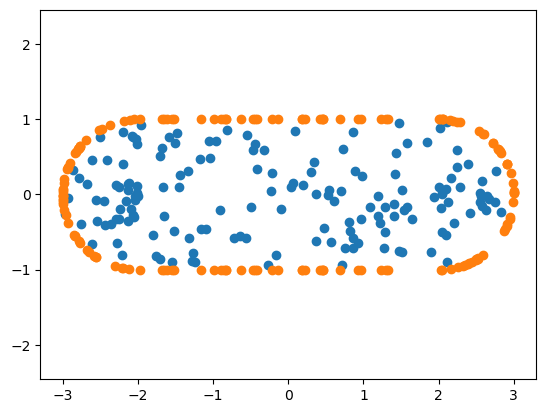

In [13]:
X = get_interior_points_sausage(length = 2)
Y = get_boundary_points_sausage(length = 2)
plt.scatter(X[:,0],X[:,1])
plt.scatter(Y[:,0],Y[:,1])
plt.axis('equal')
plt.show()

In [14]:
def get_interior_points_sausage_reg(N=21):
    """
    randomly sample N points from interior of (-1,1)^2 \ [-1,0]x[0,1]
    """
    
    x = torch.linspace(-1, 1, N)
    y = torch.linspace(-1, 1, N)
    Y, X = torch.meshgrid(y, x)
    sq1 = torch.cat((X.flatten()[:, None], Y.flatten()[:, None]), dim=1)
    Y, X = torch.meshgrid(x, y)
    sq2 = torch.cat((X.flatten()[:, None], Y.flatten()[:, None]), dim=1) - torch.tensor((0,1))
    Y, X = torch.meshgrid(x, x)
    sq3 = torch.cat((X.flatten()[:, None], Y.flatten()[:, None]), dim=1) - torch.tensor((1,1))
    
    
    mask = (sq1[:,0]**2 + sq1[:,1]**2 <= 1)  # left semicircle
    circle = sq1[mask]
    
    mask1 = (circle[:,0] < 0)  # left semicircle
    mask2 = (circle[:,0] > 0)   # right semicircle
    left = circle[mask1] - torch.tensor((1,0))    
    right = circle[mask2] + torch.tensor((1,0))
    
                    
    #return torch.cat((sq1, sq2, sq3), dim=0)
    return torch.cat((left, sq1, right), dim=0)

/opt/conda/lib/python3.9/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


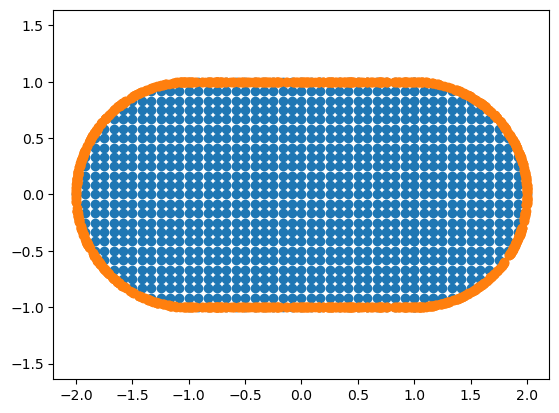

In [15]:
X = get_interior_points_sausage_reg(N=25)
Y = get_boundary_points_sausage(N=1000)
plt.scatter(X[:,0],X[:,1])
plt.scatter(Y[:,0],Y[:,1])
plt.axis('equal')
plt.show()

In [16]:
# SWITCHBOARD FOR DOMAINS
def get_points(domain='sausage', length=1):
    """
    Switchboard for domains
    """
    if domain == 'circle':
        xr = get_interior_points_circle()
        xb = get_boundary_points_circle()
        
    elif domain == 'sq':
        xr = get_interior_points_sq()
        xb = get_boundary_points_sq()
        
    else:
        xr = get_interior_points_sausage(length = length)
        xb = get_boundary_points_sausage(length = length)
        
    return xr, xb

--------------------------------------------------------------------------------------------------------------------------------

# Initialisation and Training

In [17]:
def weights_init(m):  # Initialise weights
    if isinstance(m, (nn.Conv2d, nn.Linear)):
        nn.init.xavier_normal_(m.weight)      # Initialisation technique using normal dist. introduced by Xavier Glorot
        nn.init.constant_(m.bias, 0.0)        # Initialise bias vectors as zero

--------------------------------------------------------------------------------------------------------------------------------

In [30]:
def main_inf(domain = 'sausage', arch = 'drrnn_Tanh', epochs = 5000, m = 10, length=1, sol2=0, pretrain=0):    
    """
    main -- Training Module

    Trains a chosen model with random sampling in domain and boundary.

    Parameters:
        domain -- domain of the problem
        arch   -- architecture to be used
        m      -- width of layers
    """
    
    save_loss = torch.zeros((epochs//100, 1))     # saving loss values as the model is trained

    in_N = 2      # Input Dimensions
    out_N = 1     # Output Dimensions

    device = torch.device('cpu')
    
    if arch == 'srnn_ReLU':
        model = srnn_ReLU(in_N, m, out_N).to(device)
        
    elif arch == 'srnn_Tanh':
        model = srnn_Tanh(in_N, m, out_N).to(device)
        
    elif arch == 'drfnn_ReLU':
        model = drfnn_ReLU(in_N, m, out_N).to(device)
        
    elif arch == 'drfnn_Tanh':
        model = drfnn_Tanh(in_N, m, out_N).to(device)
        
    elif arch == 'drrnn_ReLU':
        model = drrnn_ReLU(in_N, m, out_N).to(device)
        
    else:
        arch = 'drrnn_Tanh'
        model = drrnn_Tanh(in_N, m, out_N).to(device)
        
    
    # Initialise weights
    if sol2 == 1:
        model.load_state_dict(torch.load('pretraining_eigenproblem_inf_sausage_drrnn_Tanh_second_eigenvalue.mdl'))
    elif pretrain == 1:
        model.load_state_dict(torch.load('pretrained_models/'+domain+'_'+arch+'.mdl'))        
    elif pretrain == 3:
        model.load_state_dict(torch.load('fishing/best_'+domain+'_'+arch+'5000_4.mdl'))        
    else:
        model.apply(weights_init)  
    criteon = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=3e-3)

    # PLOT EXAMPLE DATA
    print(domain, length)
    X, Y = get_points(domain, length)
    plt.scatter(X[:,0],X[:,1])
    plt.scatter(Y[:,0],Y[:,1])
    plt.axis('equal')
    plt.show()
    print(arch)
    
    best_loss, best_epoch = 100000, 0          # Tracking best iteration
    
    f = IntProgress(min=0, max=epochs//100) # instantiate the bar
    display(f) # display the bar    
    print(model)     
    
    area = 4*length + torch.pi
    perimeter = 4*length + 2*torch.pi
    
    for epoch in range(epochs+1):

        # Generate the data set
        xr, xb = get_points(domain)

        xr = xr.to(device)
        xb = xb.to(device)

        xr.requires_grad_()
        output_r = model(xr)
        output_b = model(xb)
        
        # Compute the gradient term \nabla v
        grads = autograd.grad(outputs=output_r, inputs=xr,
                              grad_outputs=torch.ones_like(output_r),
                              create_graph=True, retain_graph=True, only_inputs=True)[0]

        '''PENALTY METHOD'''
        #||u||_2 = [int_\Omega |u(x)|^2 dx] ^ (1/2)
        
        #||\nabla u||_\infty = max_\Omega |\nabla u(x)|  = max_\Omega sum(\nabla u(x)_i ^2)^(1/2)  
        
        # We minimise ||\nabla u||_p^p / ||u||_p^p
        top = torch.max(torch.pow(torch.sum(torch.pow(grads, 2),dim=1), 1/2))
                    #= area * torch.mean(torch.pow(torch.sum(torch.pow(grads, 2),dim=1), p/2))
        bottom = torch.pow(area * torch.mean(torch.pow(torch.abs(output_r), 2)), 1/2)
        
        loss_r = top/bottom
        
        # Include reularising term (||u||_p^p - 1)^2 in loss function
        reg_term = torch.pow(np.sqrt(4/3+np.pi/6)-bottom, 2)
        
        # Boundary loss
        loss_b = perimeter * torch.mean(torch.pow(output_b,2))
        
        # Combined weighted loss
        loss = loss_r + 30 * loss_b + 10 * reg_term      # area of region and length of boundary already factored

        ''' 
        # Include penalty term (||u||_p^p - 1)^2 in loss function
        # Integrand of the above variational problem (averaged)
        integrad = torch.max(torch.sum(torch.pow(grads, 2),dim=1))
        reg_term = torch.mean(torch.pow(torch.abs(output_r), 2))
        
        loss_r = torch.abs(integrad) + 100*torch.pow(reg_term - 1, 2)
        
        # Boundary loss
        loss_b = torch.mean(torch.pow(output_b,2))
        
        # Combined weighted loss
        loss = (4+torch.pi) * loss_r + (4+2*torch.pi) * 30 * loss_b
        #     area of region,   length of boundary
        '''
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        if np.isnan(loss.item()):
            x = 'hey, its '+str(loss.item())
            return x

        if epoch % 100 == 0:
            print('epoch:', epoch, 'loss:', loss.item(), 'loss_r:',
                  loss_r.item(), 'loss_b:', 30 * loss_b.item(), 'reg_term:', 10 * reg_term.item())
            save_loss[epoch//100 - 1] = loss.item()
            #print('reg_term:', reg_term.item())
            f.value += 1 # signal to increment the progress bar
            time.sleep(.1)
            
            # Find minimum absolute loss in final 20% of training process
            if epoch > int(4 * epochs / 5):
                #if torch.abs(loss) < best_loss:      # Absolute value of loss
                if (loss.item() < best_loss):         # Most negative value of loss
                    best_loss = loss.item()
                    best_epoch = epoch
                    if pretrain == 2:
                        torch.save(model.state_dict(), 'pretrained_models/'+domain+'_'+arch+'.mdl')   
                    torch.save(model.state_dict(), 'saved_models/best_'+domain+'_'+arch+str(epochs)+'.mdl')
    print('best epoch:', best_epoch, 'best loss:', best_loss)
    
    # PLOT FIGURE
    model.load_state_dict(torch.load('saved_models/best_'+domain+'_'+arch+str(epochs)+'.mdl'))
    print('load from ckpt!')
    
    num_points=1001
    x1 = torch.linspace(-1, 1, num_points)
    x2 = torch.linspace(-2, 2, num_points)
    Y, X = torch.meshgrid(x1, x2)

    # CHOOSE DOMAIN
    # Sausage
    mask1 = (np.sqrt((X-1)**2 + Y**2) <= 1)
    mask2 = (np.sqrt((X+1)**2 + Y**2) <= 1)
    mask3 = (torch.max(torch.abs(X), torch.abs(Y)) <= 1)
    mask = mask1 + mask2 + mask3
    extent1=[-2, 2, -1, 1]

    # EVALUATE MODEL IN [-2,2]x[-1,1]
    Z = torch.cat((X.flatten()[:, None], Y.flatten()[:, None]), dim=1)
    Z = Z.to(device)
    with torch.no_grad():
        pred = model(Z)

    # CROP/MASK TO DOMAIN USING NaN
    pred_full = np.empty((num_points, num_points))
    pred_full.fill(np.nan)
    np.putmask(pred_full, mask, pred.cpu().numpy())

    # PLOT
    plt.figure()
    ax = plt.subplot(1, 1, 1)
    h = plt.imshow(pred_full, interpolation='nearest', cmap='jet', 
                   extent = extent1, origin='lower', aspect='equal', 
                   vmin=np.nanmin(pred_full), vmax=np.nanmax(pred_full))
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(h, cax=cax)
    plt.savefig('network_solutions/'+domain+'_'+arch+str(epochs)+'_pred.png')
    plt.show()
    
    # Loss profile
    plt.plot(save_loss)
    plt.ylabel('Loss')
    plt.yscale('log')
    plt.xlabel('Iterations (100s)')
    plt.title("Training Loss Profile")
    plt.savefig('convergence_plots/'+domain+'_'+arch+str(epochs)+'_combined.png')
    plt.show()

### SRNN_ReLU

sausage 1


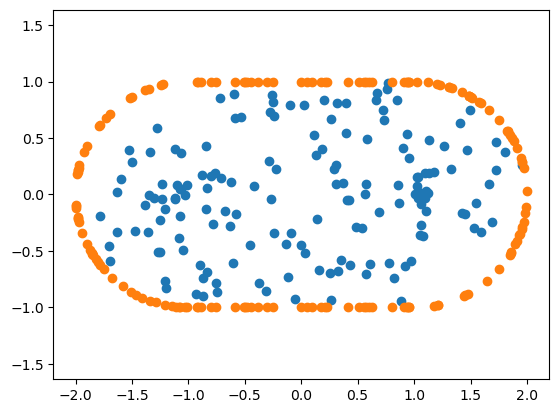

srnn_ReLU


IntProgress(value=0, max=50)

srnn_ReLU(
  (input): Linear(in_features=2, out_features=10, bias=True)
  (hidden): Linear(in_features=10, out_features=10, bias=True)
  (output): Linear(in_features=10, out_features=1, bias=True)
  (relu): ReLU()
)
epoch: 0 loss: 21.95781135559082 loss_r: 4.15526008605957 loss_b: 3.751724660396576 reg_term: 14.050827026367188
epoch: 100 loss: 1.5520310401916504 loss_r: 1.0372645854949951 loss_b: 0.17548135947436094 reg_term: 0.339285172522068
epoch: 200 loss: 1.1596235036849976 loss_r: 1.0522723197937012 loss_b: 0.03997840569354594 reg_term: 0.06737283896654844
epoch: 300 loss: 0.9819778203964233 loss_r: 0.9343699216842651 loss_b: 0.03417317639105022 reg_term: 0.01343471696600318
epoch: 400 loss: 0.9649063348770142 loss_r: 0.9406770467758179 loss_b: 0.02422855992335826 reg_term: 6.972165067509195e-07
epoch: 500 loss: 0.9610433578491211 loss_r: 0.9096468091011047 loss_b: 0.03354494576342404 reg_term: 0.017851563170552254
epoch: 600 loss: 0.9369494915008545 loss_r: 0.9075139164924622 lo

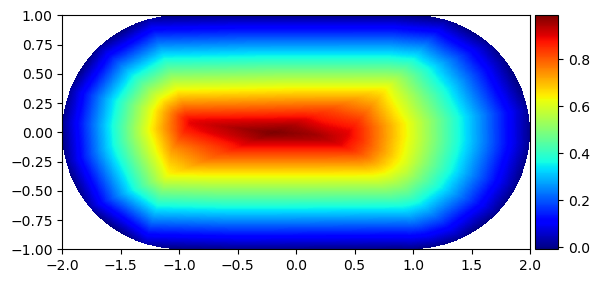

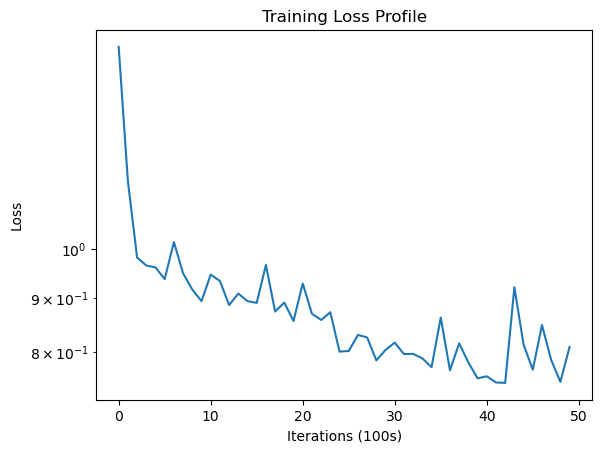

In [21]:
main_inf(arch='srnn_ReLU', pretrain=2)

sausage 1


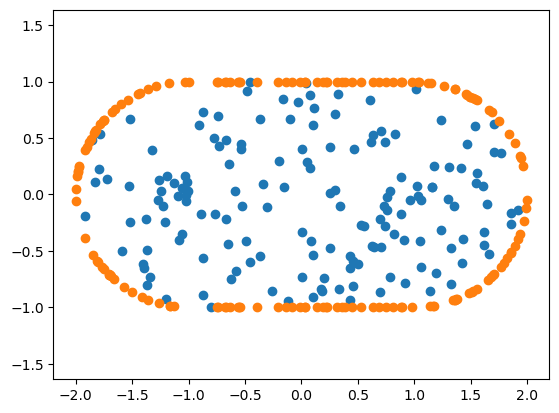

srnn_ReLU


IntProgress(value=0, max=250)

srnn_ReLU(
  (input): Linear(in_features=2, out_features=10, bias=True)
  (hidden): Linear(in_features=10, out_features=10, bias=True)
  (output): Linear(in_features=10, out_features=1, bias=True)
  (relu): ReLU()
)
epoch: 0 loss: 0.7810514569282532 loss_r: 0.6954757571220398 loss_b: 0.018135738791897893 reg_term: 0.06743998266756535
epoch: 100 loss: 0.7475672960281372 loss_r: 0.7258710265159607 loss_b: 0.012885405449196696 reg_term: 0.008810872095637023
epoch: 200 loss: 0.8510528206825256 loss_r: 0.7776064872741699 loss_b: 0.013432788255158812 reg_term: 0.06001352332532406
epoch: 300 loss: 0.7491033673286438 loss_r: 0.7298835515975952 loss_b: 0.01909842132590711 reg_term: 0.00012143314961576834
epoch: 400 loss: 0.8022995591163635 loss_r: 0.7587345838546753 loss_b: 0.011460416426416487 reg_term: 0.032104565761983395
epoch: 500 loss: 0.7504770755767822 loss_r: 0.727151095867157 loss_b: 0.02170205523725599 reg_term: 0.0016239003161899745
epoch: 600 loss: 0.8219028115272522 loss_r: 0.7598

epoch: 6500 loss: 0.6631192564964294 loss_r: 0.6491210460662842 loss_b: 0.012327789736445993 reg_term: 0.0016704403969924897
epoch: 6600 loss: 0.6710047125816345 loss_r: 0.6362229585647583 loss_b: 0.01763393171131611 reg_term: 0.017147855833172798
epoch: 6700 loss: 0.7979612946510315 loss_r: 0.7047441005706787 loss_b: 0.056539069628342986 reg_term: 0.036678153555840254
epoch: 6800 loss: 0.6609207987785339 loss_r: 0.6335989832878113 loss_b: 0.010813571861945093 reg_term: 0.016508245607838035
epoch: 6900 loss: 0.8076013326644897 loss_r: 0.6989112496376038 loss_b: 0.041918648639693856 reg_term: 0.06677144207060337
epoch: 7000 loss: 0.6946216225624084 loss_r: 0.6652660965919495 loss_b: 0.0293417286593467 reg_term: 1.3790526054435759e-05
epoch: 7100 loss: 0.713634192943573 loss_r: 0.6774119138717651 loss_b: 0.029181313002482057 reg_term: 0.0070409540785476565
epoch: 7200 loss: 0.7073334455490112 loss_r: 0.6708853840827942 loss_b: 0.035777357406914234 reg_term: 0.0006707473221467808
epoch: 7

epoch: 13200 loss: 0.721903383731842 loss_r: 0.675683319568634 loss_b: 0.02224623633082956 reg_term: 0.02397382166236639
epoch: 13300 loss: 0.7156251668930054 loss_r: 0.6218773722648621 loss_b: 0.06729603046551347 reg_term: 0.026451784651726484
epoch: 13400 loss: 0.7282153964042664 loss_r: 0.6863927245140076 loss_b: 0.00867858063429594 reg_term: 0.03314412431791425
epoch: 13500 loss: 0.6675244569778442 loss_r: 0.6415686011314392 loss_b: 0.01185474480735138 reg_term: 0.014101078268140554
epoch: 13600 loss: 0.6662646532058716 loss_r: 0.6527432799339294 loss_b: 0.013372374814935029 reg_term: 0.0001489865462644957
epoch: 13700 loss: 0.6781500577926636 loss_r: 0.6381477117538452 loss_b: 0.021672414732165635 reg_term: 0.018329889280721545
epoch: 13800 loss: 0.7974497079849243 loss_r: 0.7031678557395935 loss_b: 0.011647598294075578 reg_term: 0.08263428695499897
epoch: 13900 loss: 0.77414470911026 loss_r: 0.6826729774475098 loss_b: 0.044157884549349546 reg_term: 0.047313859686255455
epoch: 140

epoch: 19800 loss: 0.6778000593185425 loss_r: 0.6605138778686523 loss_b: 0.0134716322645545 reg_term: 0.0038146041333675385
epoch: 19900 loss: 0.6728718280792236 loss_r: 0.6605845093727112 loss_b: 0.007697489345446229 reg_term: 0.004589850432239473
epoch: 20000 loss: 0.7252346277236938 loss_r: 0.6116376519203186 loss_b: 0.02061840263195336 reg_term: 0.09297860786318779
epoch: 20100 loss: 0.6633754372596741 loss_r: 0.6564279794692993 loss_b: 0.0050871341954916716 reg_term: 0.001860345946624875
epoch: 20200 loss: 0.677031934261322 loss_r: 0.6248738169670105 loss_b: 0.013546128175221384 reg_term: 0.03861200297251344
epoch: 20300 loss: 0.6599813103675842 loss_r: 0.6517098546028137 loss_b: 0.00715296293492429 reg_term: 0.00111846937215887
epoch: 20400 loss: 0.7255868315696716 loss_r: 0.6151773929595947 loss_b: 0.04912609001621604 reg_term: 0.06128332577645779
epoch: 20500 loss: 0.7001509070396423 loss_r: 0.6750683188438416 loss_b: 0.009354392532259226 reg_term: 0.015728191938251257
epoch: 2

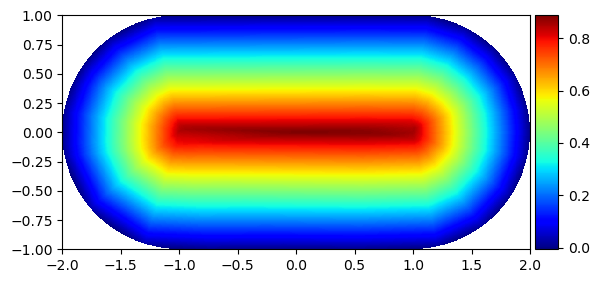

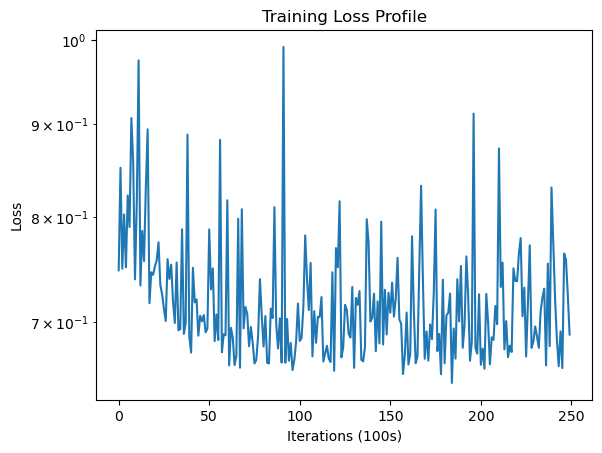

In [22]:
main_inf(arch='srnn_ReLU', epochs = 25000, pretrain=1)

### SRNN_Tanh

sausage 1


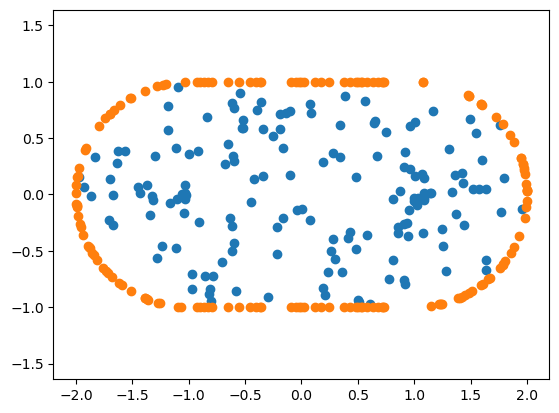

srnn_Tanh


IntProgress(value=0, max=50)

srnn_Tanh(
  (input): Linear(in_features=2, out_features=10, bias=True)
  (hidden): Linear(in_features=10, out_features=10, bias=True)
  (output): Linear(in_features=10, out_features=1, bias=True)
  (tanh): Tanh()
)
epoch: 0 loss: 36.987823486328125 loss_r: 0.941529393196106 loss_b: 29.15842831134796 reg_term: 6.887865662574768
epoch: 100 loss: 11.824999809265137 loss_r: 0.4843197464942932 loss_b: 2.5375384837388992 reg_term: 8.803141713142395
epoch: 200 loss: 2.6140570640563965 loss_r: 0.9299161434173584 loss_b: 0.48657529056072235 reg_term: 1.197565570473671
epoch: 300 loss: 1.046948790550232 loss_r: 0.9739269018173218 loss_b: 0.06841050228103995 reg_term: 0.004611379699781537
epoch: 400 loss: 1.0566157102584839 loss_r: 1.0051038265228271 loss_b: 0.047230515629053116 reg_term: 0.004281387664377689
epoch: 500 loss: 1.0601656436920166 loss_r: 0.9885209798812866 loss_b: 0.071640454698354 reg_term: 4.151562507104245e-06
epoch: 600 loss: 0.9992060661315918 loss_r: 0.9696419835090637 loss_

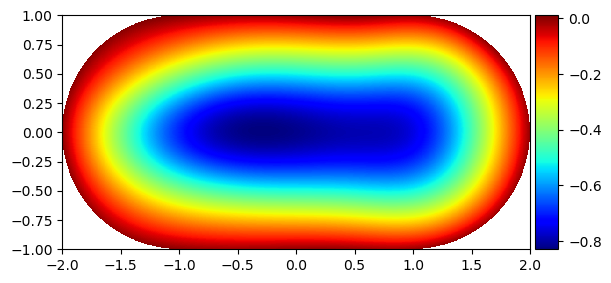

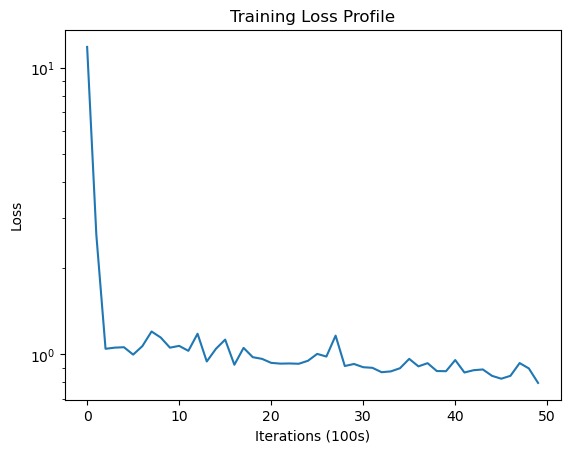

In [19]:
main_inf(arch='srnn_Tanh', pretrain=2)

sausage 1


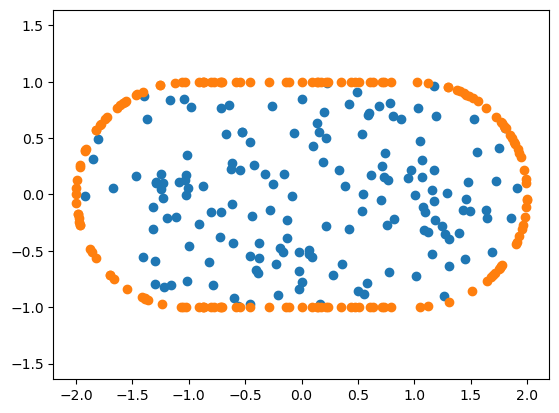

srnn_Tanh


IntProgress(value=0, max=250)

srnn_Tanh(
  (input): Linear(in_features=2, out_features=10, bias=True)
  (hidden): Linear(in_features=10, out_features=10, bias=True)
  (output): Linear(in_features=10, out_features=1, bias=True)
  (tanh): Tanh()
)
epoch: 0 loss: 0.8253414630889893 loss_r: 0.7951408624649048 loss_b: 0.01856596616562456 reg_term: 0.011634642723947763
epoch: 100 loss: 0.8219442367553711 loss_r: 0.7980559468269348 loss_b: 0.019591275486163795 reg_term: 0.00429704028647393
epoch: 200 loss: 0.8265398740768433 loss_r: 0.7693279981613159 loss_b: 0.05555880954489112 reg_term: 0.0016530755965504795
epoch: 300 loss: 0.8344289064407349 loss_r: 0.8013250231742859 loss_b: 0.014485252322629094 reg_term: 0.018618665635585785
epoch: 400 loss: 0.783909261226654 loss_r: 0.7752177119255066 loss_b: 0.008322239737026393 reg_term: 0.00036929101042915136
epoch: 500 loss: 0.7946933507919312 loss_r: 0.7813721299171448 loss_b: 0.011383802338968962 reg_term: 0.0019374176918063313
epoch: 600 loss: 0.8650957942008972 loss_r: 0.72

epoch: 6500 loss: 0.7137899398803711 loss_r: 0.6947214603424072 loss_b: 0.018740203231573105 reg_term: 0.0003282917896285653
epoch: 6600 loss: 0.7298840284347534 loss_r: 0.6849347352981567 loss_b: 0.029410278657451272 reg_term: 0.01553899492137134
epoch: 6700 loss: 0.7368673086166382 loss_r: 0.6985717415809631 loss_b: 0.03822826431132853 reg_term: 6.730660970788449e-05
epoch: 6800 loss: 0.7206238508224487 loss_r: 0.7029444575309753 loss_b: 0.014844383695162833 reg_term: 0.002835046616382897
epoch: 6900 loss: 0.8307769298553467 loss_r: 0.7479429244995117 loss_b: 0.024593761190772057 reg_term: 0.05824022460728884
epoch: 7000 loss: 0.733315110206604 loss_r: 0.7103613615036011 loss_b: 0.022806257475167513 reg_term: 0.00014743535757588688
epoch: 7100 loss: 0.7517939209938049 loss_r: 0.713496208190918 loss_b: 0.03443514578975737 reg_term: 0.0038625768502242863
epoch: 7200 loss: 0.7178044319152832 loss_r: 0.6895782351493835 loss_b: 0.01921463815961033 reg_term: 0.009011573856696486
epoch: 730

epoch: 13200 loss: 0.7493725419044495 loss_r: 0.715126633644104 loss_b: 0.03205064800567925 reg_term: 0.002195222768932581
epoch: 13300 loss: 0.7095728516578674 loss_r: 0.6943874955177307 loss_b: 0.010750496294349432 reg_term: 0.004434880393091589
epoch: 13400 loss: 0.8090158700942993 loss_r: 0.7282261848449707 loss_b: 0.016775898984633386 reg_term: 0.06401380058377981
epoch: 13500 loss: 0.7104073166847229 loss_r: 0.6641157865524292 loss_b: 0.011572318326216191 reg_term: 0.03471920732408762
epoch: 13600 loss: 0.7501430511474609 loss_r: 0.7047582268714905 loss_b: 0.03916677203960717 reg_term: 0.006218081107363105
epoch: 13700 loss: 0.7388542294502258 loss_r: 0.7140393257141113 loss_b: 0.01777015859261155 reg_term: 0.007044750382192433
epoch: 13800 loss: 0.7301980257034302 loss_r: 0.7013252973556519 loss_b: 0.023733722046017647 reg_term: 0.005138978594914079
epoch: 13900 loss: 0.7203852534294128 loss_r: 0.673433244228363 loss_b: 0.01034718006849289 reg_term: 0.03660483984276652
epoch: 14

epoch: 19800 loss: 0.7933313250541687 loss_r: 0.7357690334320068 loss_b: 0.011499511892907321 reg_term: 0.04606274887919426
epoch: 19900 loss: 0.7231385707855225 loss_r: 0.7075840830802917 loss_b: 0.013148396392352879 reg_term: 0.0024061072326730937
epoch: 20000 loss: 0.7915918231010437 loss_r: 0.7342498302459717 loss_b: 0.012514983827713877 reg_term: 0.044826967641711235
epoch: 20100 loss: 0.6954991817474365 loss_r: 0.6742536425590515 loss_b: 0.005951432831352577 reg_term: 0.015294107142835855
epoch: 20200 loss: 0.7042504549026489 loss_r: 0.6847206950187683 loss_b: 0.008676673751324415 reg_term: 0.010853125713765621
epoch: 20300 loss: 0.7188647389411926 loss_r: 0.6971652507781982 loss_b: 0.015160124748945236 reg_term: 0.0065393641125410795
epoch: 20400 loss: 0.8645966053009033 loss_r: 0.7531456351280212 loss_b: 0.03630027989856899 reg_term: 0.07515064440667629
epoch: 20500 loss: 0.7737130522727966 loss_r: 0.7236452698707581 loss_b: 0.026655220426619053 reg_term: 0.023412604350596666
e

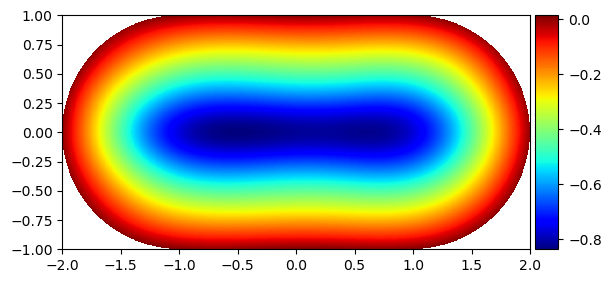

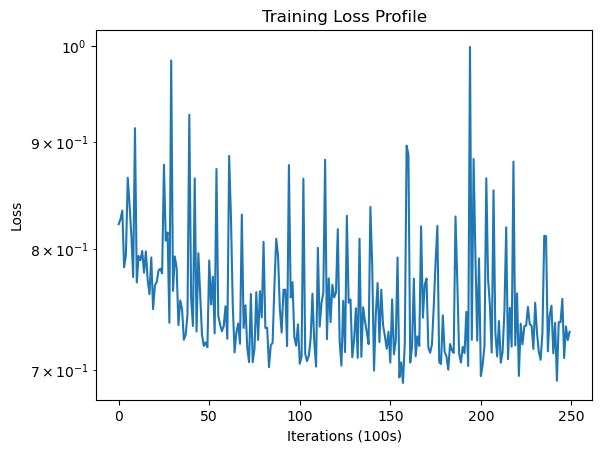

In [20]:
main_inf(arch='srnn_Tanh', epochs=25000, pretrain=1)

### DRRNN_ReLU

sausage 1


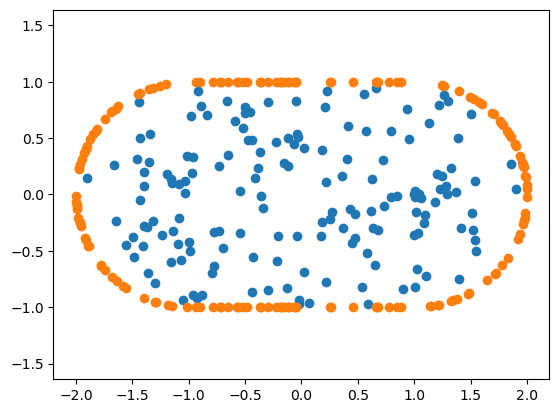

drrnn_ReLU


IntProgress(value=0, max=50)

drrnn_ReLU(
  (stack): ModuleList(
    (0): Linear(in_features=2, out_features=10, bias=True)
    (1): BlockReLU(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): ReLU()
    )
    (2): BlockReLU(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): ReLU()
    )
    (3): BlockReLU(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): ReLU()
    )
    (4): BlockReLU(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): ReLU()
    )
    (5): Linear(in_features=10, out_features=1, bias=True)
  )
)
epoch: 0 loss: 1395.2177734375 loss_r: 0.4825587868690491 loss_b: 1331.7689895629883 reg_term: 62.96614170074463
epoch: 100 loss: 6.615448474884033 loss_

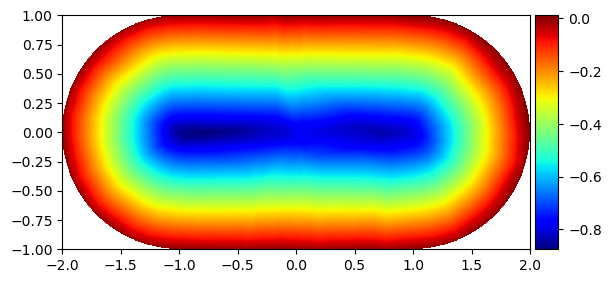

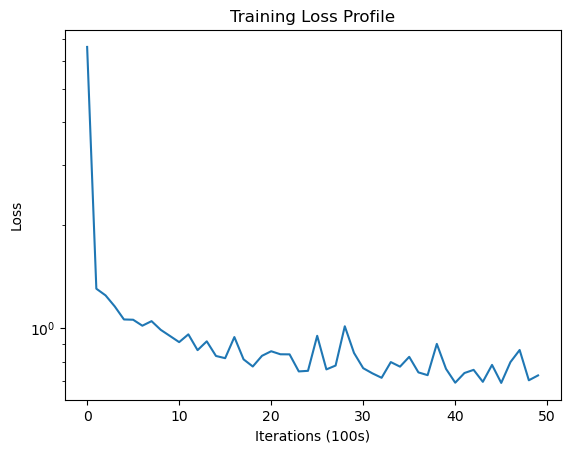

In [26]:
main_inf(arch='drrnn_ReLU', pretrain=2)

sausage 1


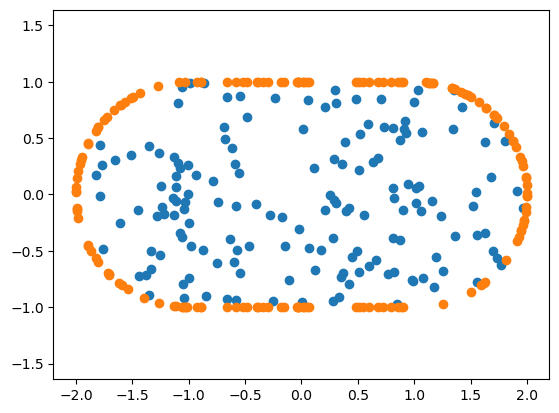

drrnn_ReLU


IntProgress(value=0, max=250)

drrnn_ReLU(
  (stack): ModuleList(
    (0): Linear(in_features=2, out_features=10, bias=True)
    (1): BlockReLU(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): ReLU()
    )
    (2): BlockReLU(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): ReLU()
    )
    (3): BlockReLU(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): ReLU()
    )
    (4): BlockReLU(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): ReLU()
    )
    (5): Linear(in_features=10, out_features=1, bias=True)
  )
)
epoch: 0 loss: 0.7633194327354431 loss_r: 0.7087512612342834 loss_b: 0.015696973423473537 reg_term: 0.03887125523760915
epoch: 100 loss: 0.71319967508316

epoch: 6000 loss: 0.7972090244293213 loss_r: 0.6190139055252075 loss_b: 0.07694523548707366 reg_term: 0.10124990716576576
epoch: 6100 loss: 0.6748022437095642 loss_r: 0.6562510132789612 loss_b: 0.01747431932017207 reg_term: 0.00107693049358204
epoch: 6200 loss: 0.7141275405883789 loss_r: 0.6771487593650818 loss_b: 0.017533773207105696 reg_term: 0.01944498624652624
epoch: 6300 loss: 1.0136630535125732 loss_r: 0.7546929717063904 loss_b: 0.04659104626625776 reg_term: 0.21237898617982864
epoch: 6400 loss: 0.7809911370277405 loss_r: 0.688998818397522 loss_b: 0.031838163267821074 reg_term: 0.06015416234731674
epoch: 6500 loss: 0.7037749886512756 loss_r: 0.6389076709747314 loss_b: 0.062053618021309376 reg_term: 0.0028136902255937457
epoch: 6600 loss: 0.6944707632064819 loss_r: 0.6703841090202332 loss_b: 0.013614573399536312 reg_term: 0.01047205412760377
epoch: 6700 loss: 0.6714757680892944 loss_r: 0.6603631973266602 loss_b: 0.010497127950657159 reg_term: 0.0006154097354738042
epoch: 6800 loss

epoch: 12700 loss: 0.67177814245224 loss_r: 0.6378009915351868 loss_b: 0.007698702975176275 reg_term: 0.026278437580913305
epoch: 12800 loss: 0.7495188117027283 loss_r: 0.6851056218147278 loss_b: 0.013928902626503259 reg_term: 0.050484309904277325
epoch: 12900 loss: 0.6827768683433533 loss_r: 0.6385026574134827 loss_b: 0.0066413721651770175 reg_term: 0.03763279877603054
epoch: 13000 loss: 0.6933905482292175 loss_r: 0.6486864686012268 loss_b: 0.04322586231864989 reg_term: 0.0014781784557271749
epoch: 13100 loss: 0.6904935836791992 loss_r: 0.6507242918014526 loss_b: 0.03574229311197996 reg_term: 0.004026979149784893
epoch: 13200 loss: 0.6731816530227661 loss_r: 0.6579189896583557 loss_b: 0.012559247261378914 reg_term: 0.0027034527738578618
epoch: 13300 loss: 0.6534938812255859 loss_r: 0.6421061158180237 loss_b: 0.0050242267025168985 reg_term: 0.006363509455695748
epoch: 13400 loss: 0.6832596659660339 loss_r: 0.6414638161659241 loss_b: 0.04144349251873791 reg_term: 0.0003524065687088296
e

epoch: 19300 loss: 0.681322455406189 loss_r: 0.6755370497703552 loss_b: 0.002947081738966517 reg_term: 0.0028382992604747415
epoch: 19400 loss: 0.6627739667892456 loss_r: 0.6505004167556763 loss_b: 0.012261493247933686 reg_term: 1.2025452633679379e-05
epoch: 19500 loss: 0.659553587436676 loss_r: 0.644856333732605 loss_b: 0.013749095960520208 reg_term: 0.0009481178130954504
epoch: 19600 loss: 0.6855625510215759 loss_r: 0.6811356544494629 loss_b: 0.0024623929493827745 reg_term: 0.001964491530088708
epoch: 19700 loss: 0.6642636656761169 loss_r: 0.6579902768135071 loss_b: 0.003047932405024767 reg_term: 0.0032254704274237156
epoch: 19800 loss: 0.7149772047996521 loss_r: 0.6786445379257202 loss_b: 0.013003381609451026 reg_term: 0.02332927193492651
epoch: 19900 loss: 0.6690154075622559 loss_r: 0.6524889469146729 loss_b: 0.007478396873921156 reg_term: 0.009048040374182165
epoch: 20000 loss: 0.8290680050849915 loss_r: 0.694795548915863 loss_b: 0.008265714277513325 reg_term: 0.12600671499967575


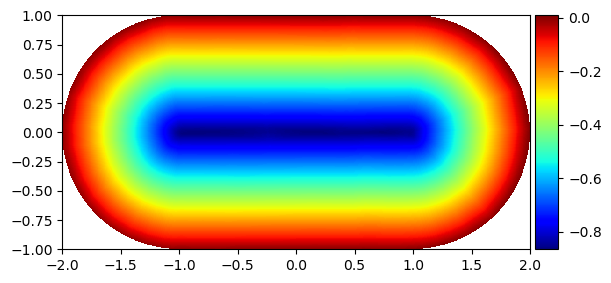

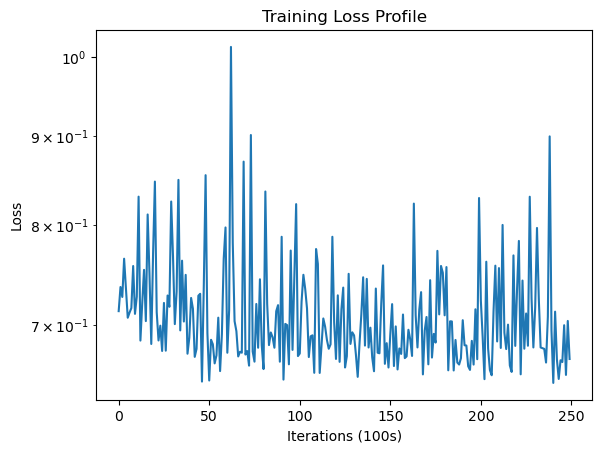

In [27]:
main_inf(arch='drrnn_ReLU', epochs=25000, pretrain=1)

### DRRNN_Tanh

sausage 1


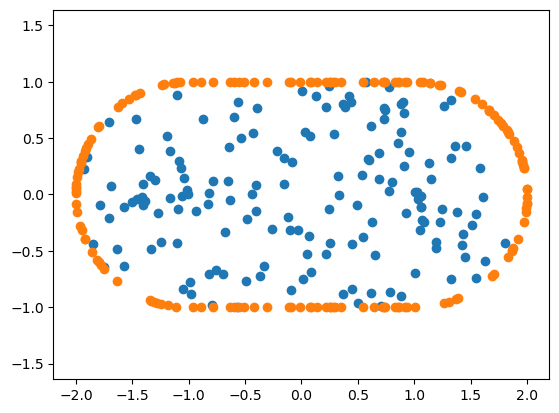

drrnn_Tanh


IntProgress(value=0, max=50)

drrnn_Tanh(
  (phi): Tanh()
  (stack): ModuleList(
    (0): Linear(in_features=2, out_features=10, bias=True)
    (1): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (2): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (3): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (4): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (5): Linear(in_features=10, out_features=1, bias=True)
  )
)
epoch: 0 loss: 888.6157836914062 loss_r: 0.7130255103111267 loss_b: 829.2560577392578 reg_term: 58.64670276641846
epoch: 100 loss: 6.102707862854004 loss

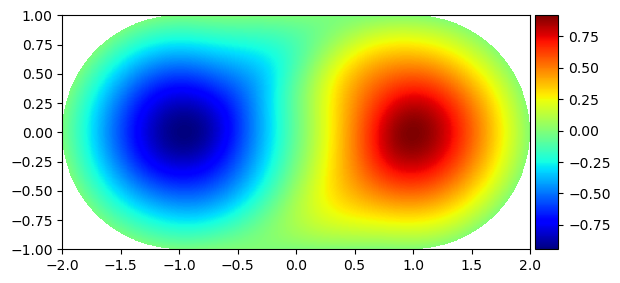

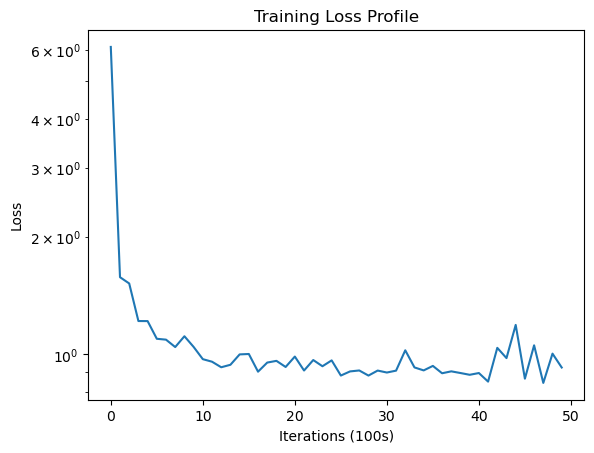

In [36]:
main_inf(arch='drrnn_Tanh', pretrain=2)

sausage 1


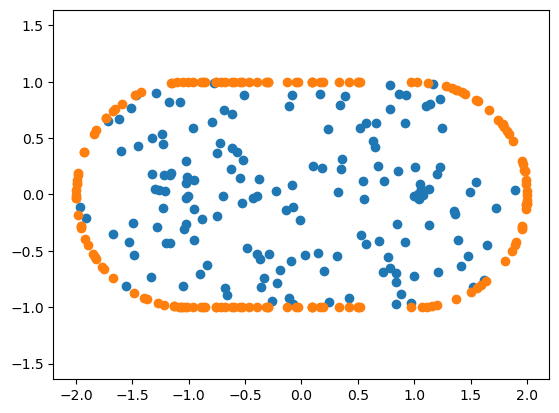

drrnn_Tanh


IntProgress(value=0, max=250)

drrnn_Tanh(
  (phi): Tanh()
  (stack): ModuleList(
    (0): Linear(in_features=2, out_features=10, bias=True)
    (1): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (2): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (3): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (4): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (5): Linear(in_features=10, out_features=1, bias=True)
  )
)
epoch: 0 loss: 0.9126279354095459 loss_r: 0.8617546558380127 loss_b: 0.04583872156217694 reg_term: 0.005034553469158709
epoch: 100 loss: 0.85194438695907

epoch: 6000 loss: 0.846789538860321 loss_r: 0.7833203673362732 loss_b: 0.06294609513133764 reg_term: 0.0005230800888966769
epoch: 6100 loss: 0.8167619109153748 loss_r: 0.786794126033783 loss_b: 0.024027946055866778 reg_term: 0.005939818802289665
epoch: 6200 loss: 0.8344935774803162 loss_r: 0.81768798828125 loss_b: 0.005883554695174098 reg_term: 0.010922040091827512
epoch: 6300 loss: 0.8275330662727356 loss_r: 0.7729493975639343 loss_b: 0.026085712015628815 reg_term: 0.028497949242591858
epoch: 6400 loss: 0.8320496678352356 loss_r: 0.8071829080581665 loss_b: 0.018597780726850033 reg_term: 0.006268956931307912
epoch: 6500 loss: 0.886255145072937 loss_r: 0.8248818516731262 loss_b: 0.06080162012949586 reg_term: 0.0005716463783755898
epoch: 6600 loss: 0.9134252071380615 loss_r: 0.7979304194450378 loss_b: 0.11157546658068895 reg_term: 0.003919293521903455
epoch: 6700 loss: 0.8807883858680725 loss_r: 0.7408731579780579 loss_b: 0.061309472657740116 reg_term: 0.07860574871301651
epoch: 6800 los

epoch: 12700 loss: 0.8270232677459717 loss_r: 0.7808548808097839 loss_b: 0.036577333230525255 reg_term: 0.009591025882400572
epoch: 12800 loss: 0.9824915528297424 loss_r: 0.8407950401306152 loss_b: 0.06314318859949708 reg_term: 0.07855333387851715
epoch: 12900 loss: 0.8090489506721497 loss_r: 0.787133514881134 loss_b: 0.020295638241805136 reg_term: 0.0016198013327084482
epoch: 13000 loss: 0.8400062322616577 loss_r: 0.8032752275466919 loss_b: 0.033807914005592465 reg_term: 0.0029230728978291154
epoch: 13100 loss: 0.9054767489433289 loss_r: 0.7663574814796448 loss_b: 0.1024138298816979 reg_term: 0.0367054482921958
epoch: 13200 loss: 0.8937113881111145 loss_r: 0.8190526962280273 loss_b: 0.04037728300318122 reg_term: 0.03428144380450249
epoch: 13300 loss: 0.8128299713134766 loss_r: 0.7899024486541748 loss_b: 0.01518429780844599 reg_term: 0.007743233582004905
epoch: 13400 loss: 0.8344834446907043 loss_r: 0.815860390663147 loss_b: 0.008319646585732698 reg_term: 0.010303463786840439
epoch: 13

epoch: 19300 loss: 0.813497006893158 loss_r: 0.7779668569564819 loss_b: 0.021781898103654385 reg_term: 0.01374823972582817
epoch: 19400 loss: 0.8112123012542725 loss_r: 0.7774606943130493 loss_b: 0.033536263508722186 reg_term: 0.00021537189240916632
epoch: 19500 loss: 0.8437435626983643 loss_r: 0.7638707756996155 loss_b: 0.011923198762815446 reg_term: 0.06794961169362068
epoch: 19600 loss: 0.8121227622032166 loss_r: 0.7818715572357178 loss_b: 0.012891291116829962 reg_term: 0.01735988538712263
epoch: 19700 loss: 0.9766411781311035 loss_r: 0.7116050124168396 loss_b: 0.017586418543942273 reg_term: 0.24744976311922073
epoch: 19800 loss: 0.9924957752227783 loss_r: 0.8595399260520935 loss_b: 0.009953639237210155 reg_term: 0.12300221249461174
epoch: 19900 loss: 0.8081709146499634 loss_r: 0.7974486947059631 loss_b: 0.008254272979684174 reg_term: 0.002467927406542003
epoch: 20000 loss: 0.8325505256652832 loss_r: 0.7938592433929443 loss_b: 0.031854305416345596 reg_term: 0.0068369717337191105
epo

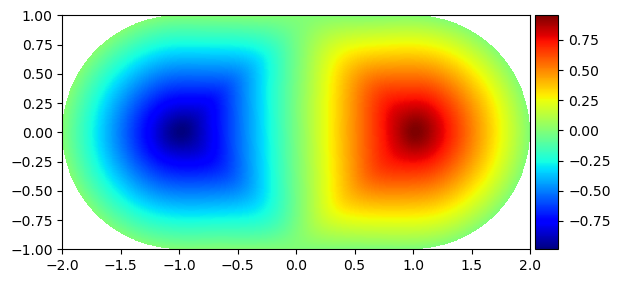

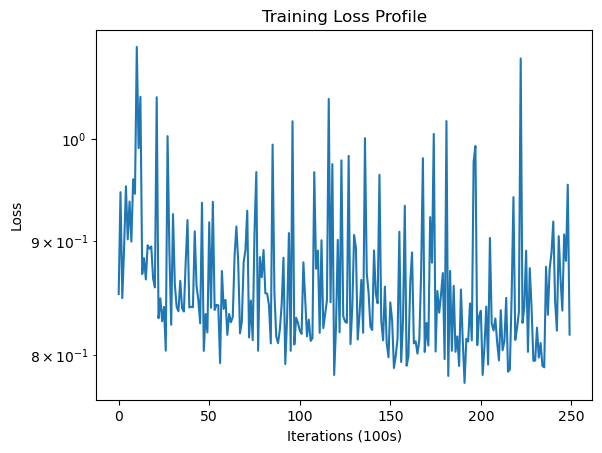

In [37]:
main_inf(arch='drrnn_Tanh', epochs=25000, pretrain=1)

### Second eigenfunction found from fishing:

sausage 1


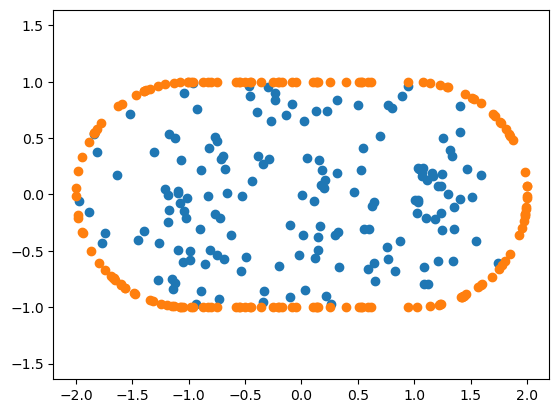

drrnn_Tanh


IntProgress(value=0, max=250)

drrnn_Tanh(
  (phi): Tanh()
  (stack): ModuleList(
    (0): Linear(in_features=2, out_features=10, bias=True)
    (1): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (2): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (3): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (4): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (5): Linear(in_features=10, out_features=1, bias=True)
  )
)
epoch: 0 loss: 0.9645788073539734 loss_r: 0.8628820776939392 loss_b: 0.07151271449401975 reg_term: 0.030184020288288593
epoch: 100 loss: 0.83273434638977

epoch: 6000 loss: 0.8915398120880127 loss_r: 0.841721773147583 loss_b: 0.014991014613769948 reg_term: 0.03482704050838947
epoch: 6100 loss: 0.9765397310256958 loss_r: 0.8623397946357727 loss_b: 0.04543584189377725 reg_term: 0.0687641091644764
epoch: 6200 loss: 0.8477115631103516 loss_r: 0.816867470741272 loss_b: 0.02939947647973895 reg_term: 0.001444658701075241
epoch: 6300 loss: 0.8753828406333923 loss_r: 0.8382816314697266 loss_b: 0.014285209472291172 reg_term: 0.02281599212437868
epoch: 6400 loss: 0.7971242666244507 loss_r: 0.7790807485580444 loss_b: 0.007757178973406553 reg_term: 0.010286327451467514
epoch: 6500 loss: 0.8929999470710754 loss_r: 0.7662665247917175 loss_b: 0.06688820896670222 reg_term: 0.05984519608318806
epoch: 6600 loss: 0.8297015428543091 loss_r: 0.7936561703681946 loss_b: 0.03268433385528624 reg_term: 0.003361061098985374
epoch: 6700 loss: 0.7992638349533081 loss_r: 0.7768803238868713 loss_b: 0.015126338694244623 reg_term: 0.007257179822772741
epoch: 6800 loss: 0

epoch: 12700 loss: 0.9902233481407166 loss_r: 0.8533249497413635 loss_b: 0.05906079662963748 reg_term: 0.0778375705704093
epoch: 12800 loss: 0.8283365964889526 loss_r: 0.8117665648460388 loss_b: 0.01615850196685642 reg_term: 0.0004115234696655534
epoch: 12900 loss: 0.8090805411338806 loss_r: 0.7881773710250854 loss_b: 0.016860556206665933 reg_term: 0.004042639338877052
epoch: 13000 loss: 0.8576830625534058 loss_r: 0.8252819776535034 loss_b: 0.009703041287139058 reg_term: 0.022698049433529377
epoch: 13100 loss: 0.8234679698944092 loss_r: 0.7834587693214417 loss_b: 0.030941034201532602 reg_term: 0.009068204089999199
epoch: 13200 loss: 0.8296219110488892 loss_r: 0.7520619630813599 loss_b: 0.024335780180990696 reg_term: 0.05322416312992573
epoch: 13300 loss: 1.012277603149414 loss_r: 0.8551645874977112 loss_b: 0.014151375798974186 reg_term: 0.14296161942183971
epoch: 13400 loss: 0.9457841515541077 loss_r: 0.8633623719215393 loss_b: 0.01577788672875613 reg_term: 0.06664389744400978
epoch: 1

epoch: 19300 loss: 0.8616940975189209 loss_r: 0.8230800032615662 loss_b: 0.03309005289338529 reg_term: 0.005524052539840341
epoch: 19400 loss: 0.8498712182044983 loss_r: 0.7569242119789124 loss_b: 0.06221786141395569 reg_term: 0.03072913968935609
epoch: 19500 loss: 0.9531094431877136 loss_r: 0.7279108762741089 loss_b: 0.10785527061671019 reg_term: 0.11734332889318466
epoch: 19600 loss: 0.8281822800636292 loss_r: 0.8189995884895325 loss_b: 0.009163878858089447 reg_term: 1.8846187685994664e-05
epoch: 19700 loss: 0.9643455147743225 loss_r: 0.8609240055084229 loss_b: 0.022636513458564878 reg_term: 0.0807849783450365
epoch: 19800 loss: 0.8042119145393372 loss_r: 0.773865818977356 loss_b: 0.02884604560676962 reg_term: 0.0015000862185843289
epoch: 19900 loss: 0.8997724056243896 loss_r: 0.8383166193962097 loss_b: 0.024929411010816693 reg_term: 0.03652641084045172
epoch: 20000 loss: 0.8261018991470337 loss_r: 0.7959781885147095 loss_b: 0.010624773858580738 reg_term: 0.019498957553878427
epoch: 

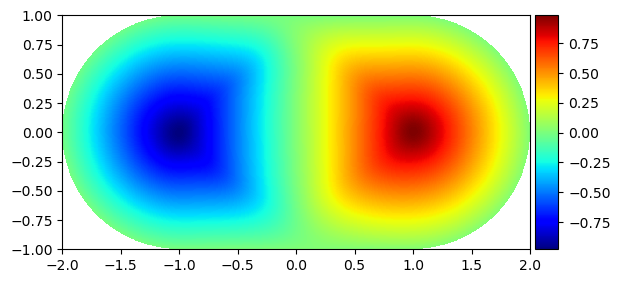

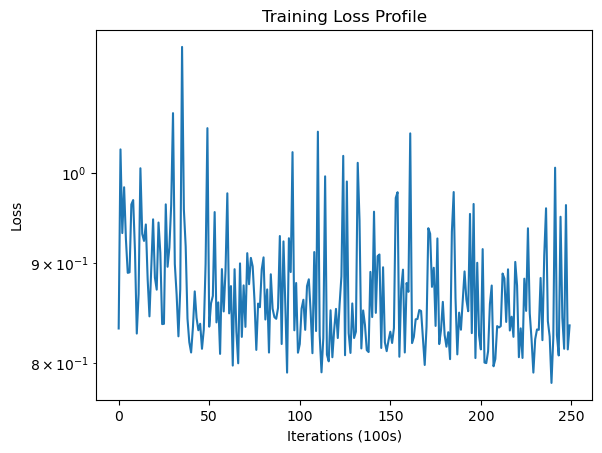

In [24]:
main_inf(arch='drrnn_Tanh', epochs=25000, pretrain=3)

### DRFNN_ReLU

sausage 1


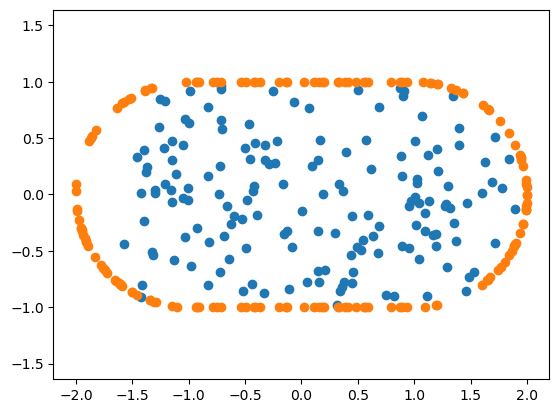

drfnn_ReLU


IntProgress(value=0, max=50)

drfnn_ReLU(
  (stack): ModuleList(
    (0): Linear(in_features=2, out_features=10, bias=True)
    (1): Linear(in_features=10, out_features=10, bias=True)
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): Linear(in_features=10, out_features=10, bias=True)
    (4): Linear(in_features=10, out_features=10, bias=True)
    (5): Linear(in_features=10, out_features=10, bias=True)
    (6): Linear(in_features=10, out_features=10, bias=True)
    (7): Linear(in_features=10, out_features=10, bias=True)
    (8): Linear(in_features=10, out_features=10, bias=True)
  )
  (output): Linear(in_features=10, out_features=1, bias=True)
  (relu): ReLU()
)
best epoch: 4700 best loss: 0.6732169985771179
load from ckpt!


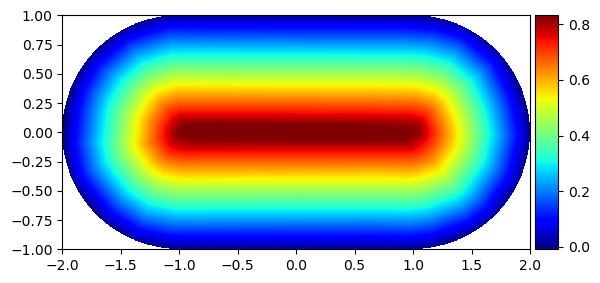

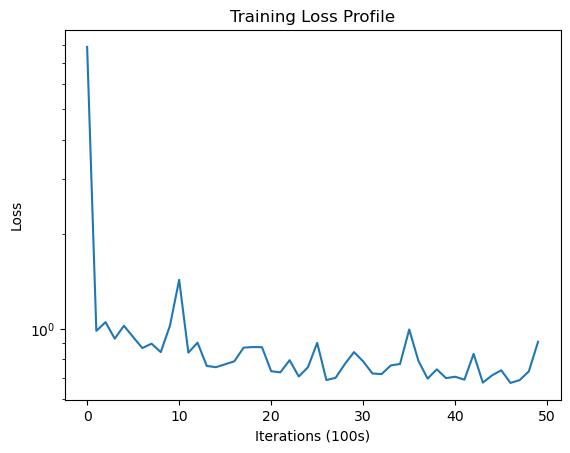

In [28]:
main_inf(arch='drfnn_ReLU', pretrain=2)

sausage 1


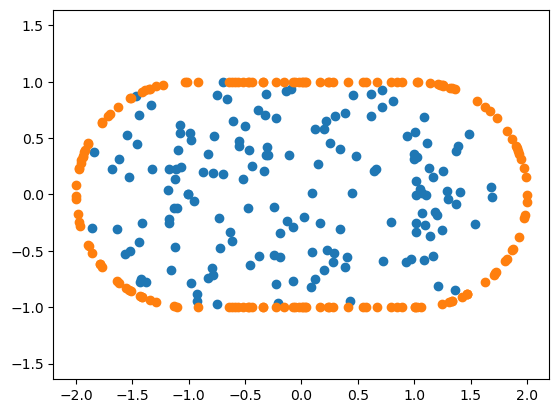

drfnn_ReLU


IntProgress(value=0, max=250)

drfnn_ReLU(
  (stack): ModuleList(
    (0): Linear(in_features=2, out_features=10, bias=True)
    (1): Linear(in_features=10, out_features=10, bias=True)
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): Linear(in_features=10, out_features=10, bias=True)
    (4): Linear(in_features=10, out_features=10, bias=True)
    (5): Linear(in_features=10, out_features=10, bias=True)
    (6): Linear(in_features=10, out_features=10, bias=True)
    (7): Linear(in_features=10, out_features=10, bias=True)
    (8): Linear(in_features=10, out_features=10, bias=True)
  )
  (output): Linear(in_features=10, out_features=1, bias=True)
  (relu): ReLU()
)
epoch: 0 loss: 0.6815994381904602 loss_r: 0.6604843735694885 loss_b: 0.019590557785704732 reg_term: 0.0015245092799887061
epoch: 100 loss: 0.7564481496810913 loss_r: 0.7092311382293701 loss_b: 0.027130318921990693 reg_term: 0.020086676813662052
epoch: 200 loss: 0.6994439959526062 loss_r: 0.6831635236740112 loss_b: 0.016250884509645402 reg_

epoch: 6200 loss: 0.7526646852493286 loss_r: 0.6836450695991516 loss_b: 0.02678843680769205 reg_term: 0.042231171391904354
epoch: 6300 loss: 0.6754328012466431 loss_r: 0.6431562304496765 loss_b: 0.007815830467734486 reg_term: 0.024460728745907545
epoch: 6400 loss: 0.84128737449646 loss_r: 0.7075718641281128 loss_b: 0.038808543467894197 reg_term: 0.09490698575973511
epoch: 6500 loss: 1.1246507167816162 loss_r: 0.7213485836982727 loss_b: 0.009344748104922473 reg_term: 0.39395734667778015
epoch: 6600 loss: 0.6415591239929199 loss_r: 0.6262629628181458 loss_b: 0.011597130505833775 reg_term: 0.0036990325315855443
epoch: 6700 loss: 0.7293272018432617 loss_r: 0.6135665774345398 loss_b: 0.05351949599571526 reg_term: 0.062241158448159695
epoch: 6800 loss: 0.7046685814857483 loss_r: 0.688646674156189 loss_b: 0.015921496669761837 reg_term: 0.00010045206181530375
epoch: 6900 loss: 0.7906040549278259 loss_r: 0.6800190806388855 loss_b: 0.05244226078502834 reg_term: 0.058142743073403835
epoch: 7000 l

epoch: 12900 loss: 0.6966740489006042 loss_r: 0.668121874332428 loss_b: 0.016296515241265297 reg_term: 0.01225565210916102
epoch: 13000 loss: 0.7370937466621399 loss_r: 0.699687659740448 loss_b: 0.005012334004277363 reg_term: 0.0323937670327723
epoch: 13100 loss: 0.7229145765304565 loss_r: 0.7044026255607605 loss_b: 0.017218454740941525 reg_term: 0.001293488166993484
epoch: 13200 loss: 0.7408096194267273 loss_r: 0.6775707006454468 loss_b: 0.010042400099337101 reg_term: 0.053196512162685394
epoch: 13300 loss: 0.6436392068862915 loss_r: 0.6312031149864197 loss_b: 0.008094068616628647 reg_term: 0.004342033062130213
epoch: 13400 loss: 0.7231972217559814 loss_r: 0.6871694326400757 loss_b: 0.035852742148563266 reg_term: 0.00017507914890302345
epoch: 13500 loss: 0.7322215437889099 loss_r: 0.7199103832244873 loss_b: 0.006992070993874222 reg_term: 0.005319103947840631
epoch: 13600 loss: 0.6910635828971863 loss_r: 0.669266402721405 loss_b: 0.0030096447881078348 reg_term: 0.018787558656185865
epo

epoch: 19500 loss: 0.7755524516105652 loss_r: 0.708156168460846 loss_b: 0.00037697827792726457 reg_term: 0.06701929029077291
epoch: 19600 loss: 0.7008978128433228 loss_r: 0.696537435054779 loss_b: 0.003966716467402875 reg_term: 0.0003937036672141403
epoch: 19700 loss: 0.7540236711502075 loss_r: 0.7068122029304504 loss_b: 0.004138992517255247 reg_term: 0.04307244438678026
epoch: 19800 loss: 0.6645082831382751 loss_r: 0.6588121652603149 loss_b: 0.001047412442858331 reg_term: 0.004648675967473537
epoch: 19900 loss: 0.6847122311592102 loss_r: 0.6489814519882202 loss_b: 0.03461553482338786 reg_term: 0.0011152694060001522
epoch: 20000 loss: 0.7463605403900146 loss_r: 0.6059420704841614 loss_b: 0.014948869356885552 reg_term: 0.12546961195766926
epoch: 20100 loss: 0.7109077572822571 loss_r: 0.7051330208778381 loss_b: 0.0047342159086838365 reg_term: 0.0010405021021142602
epoch: 20200 loss: 0.7650342583656311 loss_r: 0.74433434009552 loss_b: 0.004840815381612629 reg_term: 0.01585913705639541
epo

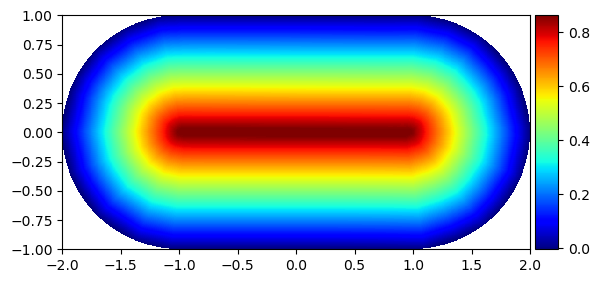

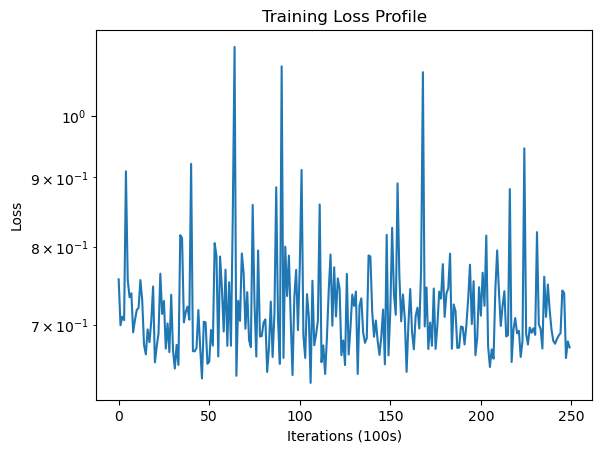

In [34]:
main_inf(arch='drfnn_ReLU', epochs=25000, pretrain=1)

### DRFNN_Tanh

sausage 1


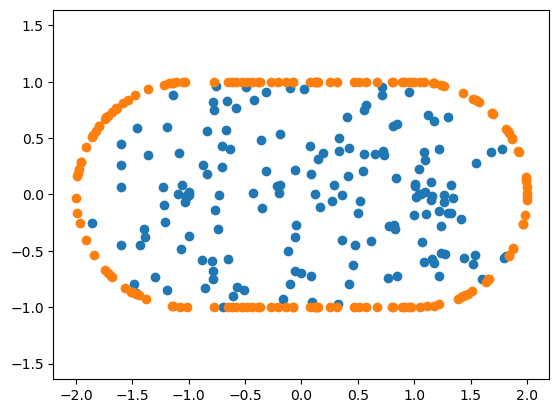

drfnn_Tanh


IntProgress(value=0, max=50)

drfnn_Tanh(
  (stack): ModuleList(
    (0): Linear(in_features=2, out_features=10, bias=True)
    (1): Linear(in_features=10, out_features=10, bias=True)
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): Linear(in_features=10, out_features=10, bias=True)
    (4): Linear(in_features=10, out_features=10, bias=True)
    (5): Linear(in_features=10, out_features=10, bias=True)
    (6): Linear(in_features=10, out_features=10, bias=True)
    (7): Linear(in_features=10, out_features=10, bias=True)
    (8): Linear(in_features=10, out_features=10, bias=True)
  )
  (output): Linear(in_features=10, out_features=1, bias=True)
  (phi): Tanh()
)
epoch: 0 loss: 33.61334228515625 loss_r: 1.0498745441436768 loss_b: 27.33817756175995 reg_term: 5.225292444229126
epoch: 100 loss: 2.011394739151001 loss_r: 1.2451984882354736 loss_b: 0.46420139260590076 reg_term: 0.30199475586414337
epoch: 200 loss: 1.4383766651153564 loss_r: 1.085440754890442 loss_b: 0.32382259145379066 reg_term: 0.029113

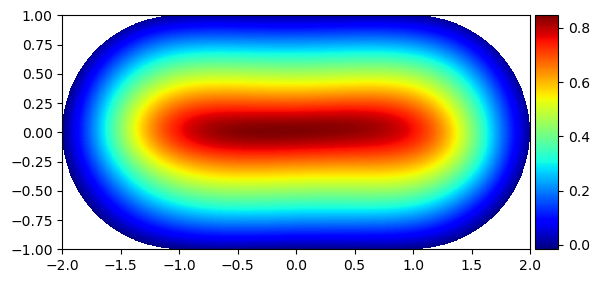

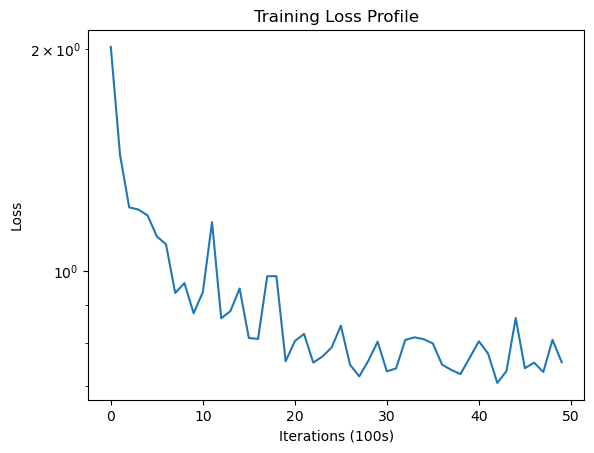

In [23]:
main_inf(arch='drfnn_Tanh', pretrain=2)

sausage 1


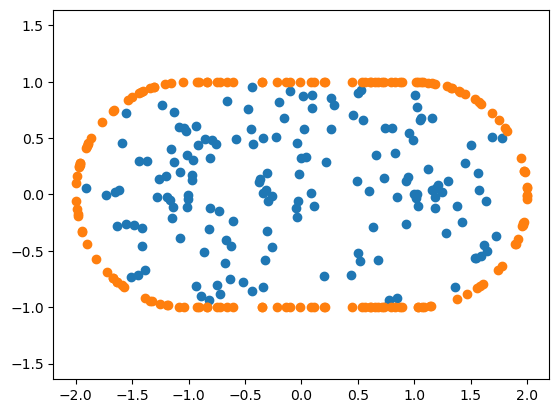

drfnn_Tanh


IntProgress(value=0, max=250)

drfnn_Tanh(
  (stack): ModuleList(
    (0): Linear(in_features=2, out_features=10, bias=True)
    (1): Linear(in_features=10, out_features=10, bias=True)
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): Linear(in_features=10, out_features=10, bias=True)
    (4): Linear(in_features=10, out_features=10, bias=True)
    (5): Linear(in_features=10, out_features=10, bias=True)
    (6): Linear(in_features=10, out_features=10, bias=True)
    (7): Linear(in_features=10, out_features=10, bias=True)
    (8): Linear(in_features=10, out_features=10, bias=True)
  )
  (output): Linear(in_features=10, out_features=1, bias=True)
  (phi): Tanh()
)
epoch: 0 loss: 0.7659731507301331 loss_r: 0.714339017868042 loss_b: 0.024309298605658114 reg_term: 0.027324827387928963
epoch: 100 loss: 0.757308840751648 loss_r: 0.7009652256965637 loss_b: 0.0505906215403229 reg_term: 0.005752987344749272
epoch: 200 loss: 0.7223681807518005 loss_r: 0.7089090347290039 loss_b: 0.013060950441285968 reg_term: 

epoch: 6200 loss: 0.7962957620620728 loss_r: 0.716908872127533 loss_b: 0.017908402369357646 reg_term: 0.061478521674871445
epoch: 6300 loss: 0.728001058101654 loss_r: 0.6543000340461731 loss_b: 0.01799912250135094 reg_term: 0.05570191890001297
epoch: 6400 loss: 0.6844282746315002 loss_r: 0.6776849031448364 loss_b: 0.005357343616196886 reg_term: 0.0013860610488336533
epoch: 6500 loss: 0.6931782960891724 loss_r: 0.6778306365013123 loss_b: 0.013814349076710641 reg_term: 0.001533323957119137
epoch: 6600 loss: 0.7810418605804443 loss_r: 0.7293350696563721 loss_b: 0.026203750167042017 reg_term: 0.025503018405288458
epoch: 6700 loss: 0.6858927011489868 loss_r: 0.6715176701545715 loss_b: 0.014374024467542768 reg_term: 1.040580741573649e-06
epoch: 6800 loss: 0.8114460110664368 loss_r: 0.7110349535942078 loss_b: 0.045163925969973207 reg_term: 0.055247144773602486
epoch: 6900 loss: 0.6880700588226318 loss_r: 0.668872594833374 loss_b: 0.01910339982714504 reg_term: 9.40439713303931e-05
epoch: 7000 

epoch: 12900 loss: 0.7527995705604553 loss_r: 0.6560570001602173 loss_b: 0.032207113690674305 reg_term: 0.06453543435782194
epoch: 13000 loss: 0.7163600325584412 loss_r: 0.7022252082824707 loss_b: 0.014113883371464908 reg_term: 2.094045157718938e-05
epoch: 13100 loss: 0.7032675743103027 loss_r: 0.6830111742019653 loss_b: 0.01560643664561212 reg_term: 0.004649961192626506
epoch: 13200 loss: 0.6989009380340576 loss_r: 0.6519483327865601 loss_b: 0.014220746525097638 reg_term: 0.03273185109719634
epoch: 13300 loss: 0.6974964737892151 loss_r: 0.6575968861579895 loss_b: 0.037934894207865 reg_term: 0.0019646920554805547
epoch: 13400 loss: 0.713468611240387 loss_r: 0.7029836177825928 loss_b: 0.010152137547265738 reg_term: 0.00033282900403719395
epoch: 13500 loss: 0.7765371203422546 loss_r: 0.7149443626403809 loss_b: 0.00669628192554228 reg_term: 0.05489646457135677
epoch: 13600 loss: 0.7837373614311218 loss_r: 0.6666705012321472 loss_b: 0.08257194422185421 reg_term: 0.0344949378632009
epoch: 1

epoch: 19500 loss: 0.8180745840072632 loss_r: 0.7195231914520264 loss_b: 0.07928639883175492 reg_term: 0.01926499418914318
epoch: 19600 loss: 0.713394284248352 loss_r: 0.6794034838676453 loss_b: 0.033981880405917764 reg_term: 8.936481776800065e-06
epoch: 19700 loss: 0.7115746140480042 loss_r: 0.6974256634712219 loss_b: 0.01253408845514059 reg_term: 0.001614859065739438
epoch: 19800 loss: 0.7185295224189758 loss_r: 0.6905304193496704 loss_b: 0.014151366194710135 reg_term: 0.01384769449941814
epoch: 19900 loss: 0.7266411185264587 loss_r: 0.7051543593406677 loss_b: 0.01912585983518511 reg_term: 0.0023609069467056543
epoch: 20000 loss: 0.6915159225463867 loss_r: 0.6613039970397949 loss_b: 0.008783343073446304 reg_term: 0.02142856130376458
epoch: 20100 loss: 0.8217847347259521 loss_r: 0.7372986078262329 loss_b: 0.027491706423461437 reg_term: 0.05699441768229008
epoch: 20200 loss: 0.6681291460990906 loss_r: 0.6604737639427185 loss_b: 0.007254666852531955 reg_term: 0.00040075105061987415
epoc

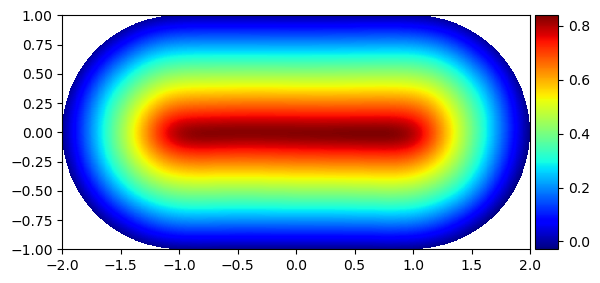

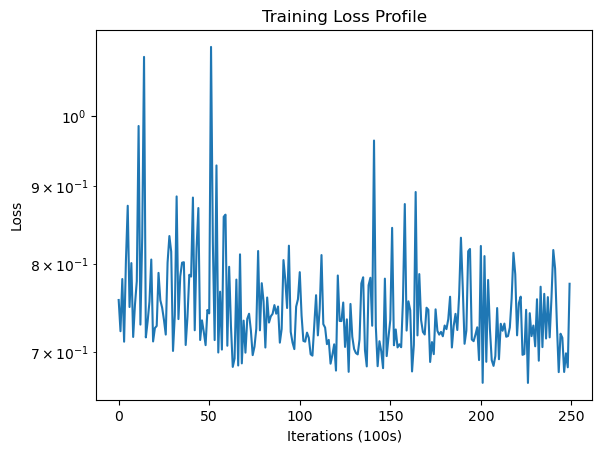

In [24]:
main_inf(arch='drfnn_Tanh', epochs=25000, pretrain=1)

----------------------------------

# FISHING FOR SECOND EIGENFUNCTION

In [19]:
def main_inf_fishing(domain = 'sausage', arch = 'drrnn_Tanh', epochs = 5000, m = 10, length=1, sol2=0, pretrain=0, iters=0):    
    """
    main -- Training Module

    Trains a chosen model with random sampling in domain and boundary.

    Parameters:
        domain -- domain of the problem
        arch   -- architecture to be used
        m      -- width of layers
    """
    
    save_loss = torch.zeros((epochs//100, 1))     # saving loss values as the model is trained

    in_N = 2      # Input Dimensions
    out_N = 1     # Output Dimensions

    device = torch.device('cpu')
    
    if arch == 'srnn_ReLU':
        model = srnn_ReLU(in_N, m, out_N).to(device)
        
    elif arch == 'srnn_Tanh':
        model = srnn_Tanh(in_N, m, out_N).to(device)
        
    elif arch == 'drfnn_ReLU':
        model = drfnn_ReLU(in_N, m, out_N).to(device)
        
    elif arch == 'drfnn_Tanh':
        model = drfnn_Tanh(in_N, m, out_N).to(device)
        
    elif arch == 'drrnn_ReLU':
        model = drrnn_ReLU(in_N, m, out_N).to(device)
        
    else:
        arch = 'drrnn_Tanh'
        model = drrnn_Tanh(in_N, m, out_N).to(device)
        
    
    # Initialise weights
    if sol2 == 1:
        model.load_state_dict(torch.load('pretraining_eigenproblem_inf_sausage_drrnn_Tanh_second_eigenvalue.mdl'))
    elif pretrain == 1:
        model.load_state_dict(torch.load('pretrained_models/'+domain+'_'+arch+'.mdl'))        
    else:
        model.apply(weights_init)  
    criteon = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=3e-3)

    # PLOT EXAMPLE DATA
    #print(domain, length)
    #print(arch)
    
    best_loss, best_epoch = 100000, 0          # Tracking best iteration
    
    f = IntProgress(min=0, max=epochs//100) # instantiate the bar
    display(f) # display the bar    
    #print(model)     
    
    area = 4*length + torch.pi
    perimeter = 4*length + 2*torch.pi
    
    for epoch in range(epochs+1):

        # Generate the data set
        xr, xb = get_points(domain)

        xr = xr.to(device)
        xb = xb.to(device)

        xr.requires_grad_()
        output_r = model(xr)
        output_b = model(xb)
        
        # Compute the gradient term \nabla v
        grads = autograd.grad(outputs=output_r, inputs=xr,
                              grad_outputs=torch.ones_like(output_r),
                              create_graph=True, retain_graph=True, only_inputs=True)[0]

        '''PENALTY METHOD'''
        #||u||_2 = [int_\Omega |u(x)|^2 dx] ^ (1/2)
        
        #||\nabla u||_\infty = max_\Omega |\nabla u(x)|  = max_\Omega sum(\nabla u(x)_i ^2)^(1/2)  
        
        # We minimise ||\nabla u||_p^p / ||u||_p^p
        top = torch.max(torch.pow(torch.sum(torch.pow(grads, 2),dim=1), 1/2))
                    #= area * torch.mean(torch.pow(torch.sum(torch.pow(grads, 2),dim=1), p/2))
        bottom = torch.pow(area * torch.mean(torch.pow(torch.abs(output_r), 2)), 1/2)
        
        loss_r = top/bottom
        
        # Include reularising term (||u||_p^p - 1)^2 in loss function
        reg_term = torch.pow(np.sqrt(4/3+np.pi/6)-bottom, 2)
        
        # Boundary loss
        loss_b = perimeter * torch.mean(torch.pow(output_b,2))
        
        # Combined weighted loss
        loss = loss_r + 30 * loss_b + 10 * reg_term      # area of region and length of boundary already factored

        ''' 
        # Include penalty term (||u||_p^p - 1)^2 in loss function
        # Integrand of the above variational problem (averaged)
        integrad = torch.max(torch.sum(torch.pow(grads, 2),dim=1))
        reg_term = torch.mean(torch.pow(torch.abs(output_r), 2))
        
        loss_r = torch.abs(integrad) + 100*torch.pow(reg_term - 1, 2)
        
        # Boundary loss
        loss_b = torch.mean(torch.pow(output_b,2))
        
        # Combined weighted loss
        loss = (4+torch.pi) * loss_r + (4+2*torch.pi) * 30 * loss_b
        #     area of region,   length of boundary
        '''
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if epoch % 100 == 0:
            #print('epoch:', epoch, 'loss:', loss.item(), 'loss_r:',
            #      loss_r.item(), 'loss_b:', 30 * loss_b.item(), 'reg_term:', 10 * reg_term.item())
            save_loss[epoch//100 - 1] = loss.item()
            #print('reg_term:', reg_term.item())
            f.value += 1 # signal to increment the progress bar
            time.sleep(.1)
            
            # Find minimum absolute loss in final 20% of training process
            if epoch > int(4 * epochs / 5):
                #if torch.abs(loss) < best_loss:      # Absolute value of loss
                if (loss.item() < best_loss):         # Most negative value of loss
                    best_loss = loss.item()
                    best_epoch = epoch
                    #if pretrain == 2:
                    #    torch.save(model.state_dict(), 'fishing/'+domain+'_'+arch+'_'+i+'.mdl')   
                    torch.save(model.state_dict(), 'fishing/best_'+domain+'_'+arch+str(epochs)+'_'+str(iters)+'.mdl')
    print('best epoch:', best_epoch, 'best loss:', best_loss)
    
    # PLOT FIGURE
    model.load_state_dict(torch.load('fishing/best_'+domain+'_'+arch+str(epochs)+'_'+str(iters)+'.mdl'))
    print('load from ckpt!')
    
    num_points=1001
    x1 = torch.linspace(-1, 1, num_points)
    x2 = torch.linspace(-2, 2, num_points)
    Y, X = torch.meshgrid(x1, x2)

    # CHOOSE DOMAIN
    # Sausage
    mask1 = (np.sqrt((X-1)**2 + Y**2) <= 1)
    mask2 = (np.sqrt((X+1)**2 + Y**2) <= 1)
    mask3 = (torch.max(torch.abs(X), torch.abs(Y)) <= 1)
    mask = mask1 + mask2 + mask3
    extent1=[-2, 2, -1, 1]

    # EVALUATE MODEL IN [-2,2]x[-1,1]
    Z = torch.cat((X.flatten()[:, None], Y.flatten()[:, None]), dim=1)
    Z = Z.to(device)
    with torch.no_grad():
        pred = model(Z)

    # CROP/MASK TO DOMAIN USING NaN
    pred_full = np.empty((num_points, num_points))
    pred_full.fill(np.nan)
    np.putmask(pred_full, mask, pred.cpu().numpy())

    # PLOT
    plt.figure()
    ax = plt.subplot(1, 1, 1)
    h = plt.imshow(pred_full, interpolation='nearest', cmap='jet', 
                   extent = extent1, origin='lower', aspect='equal', 
                   vmin=np.nanmin(pred_full), vmax=np.nanmax(pred_full))
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(h, cax=cax)
    #plt.savefig('network_solutions/'+domain+'_'+arch+str(epochs)+'_pred.png')
    plt.show()

0


IntProgress(value=0, max=50)

best epoch: 4300 best loss: 0.7588958144187927
load from ckpt!


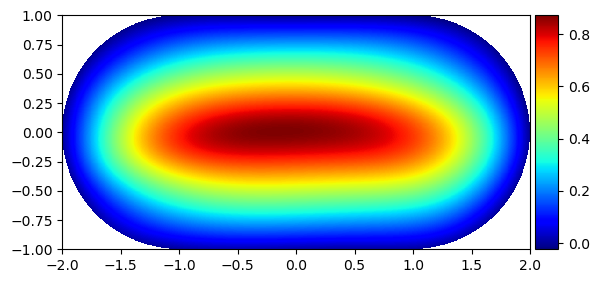

1


IntProgress(value=0, max=50)

best epoch: 4700 best loss: 0.7169783711433411
load from ckpt!


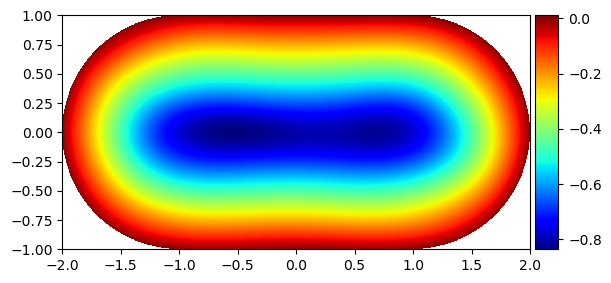

2


IntProgress(value=0, max=50)

best epoch: 5000 best loss: 0.7091843485832214
load from ckpt!


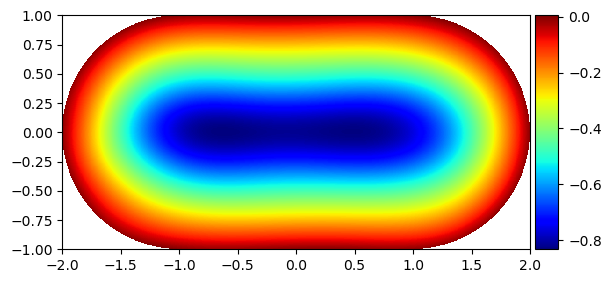

3


IntProgress(value=0, max=50)

best epoch: 4800 best loss: 0.690773069858551
load from ckpt!


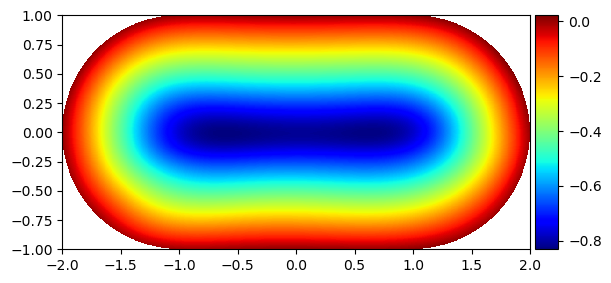

4


IntProgress(value=0, max=50)

best epoch: 4900 best loss: 0.8421904444694519
load from ckpt!


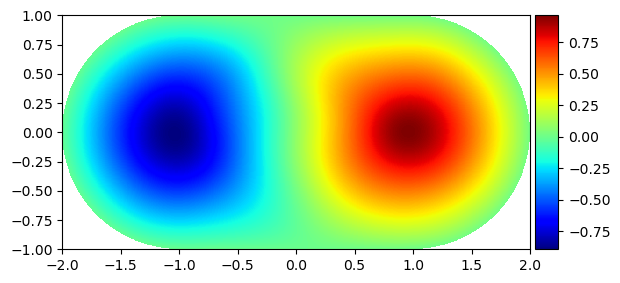

5


IntProgress(value=0, max=50)

best epoch: 4300 best loss: 0.7140527367591858
load from ckpt!


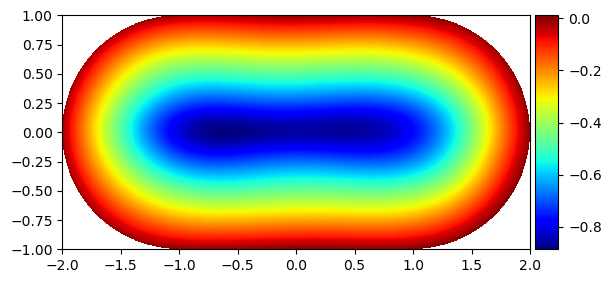

6


IntProgress(value=0, max=50)

KeyboardInterrupt: 

In [22]:
for i in range(200):
    print(i)
    main_inf_fishing(epochs=5000, iters=i)

0


IntProgress(value=0, max=50)

best epoch: 4300 best loss: 0.7588958144187927
load from ckpt!


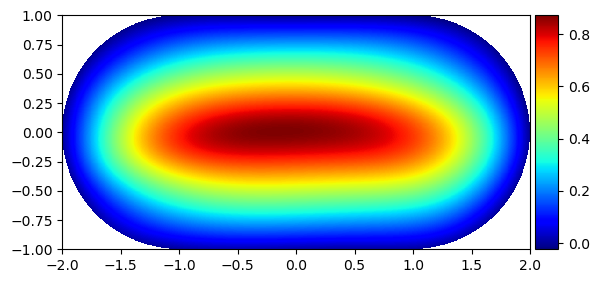

1


IntProgress(value=0, max=50)

best epoch: 4700 best loss: 0.7169783711433411
load from ckpt!


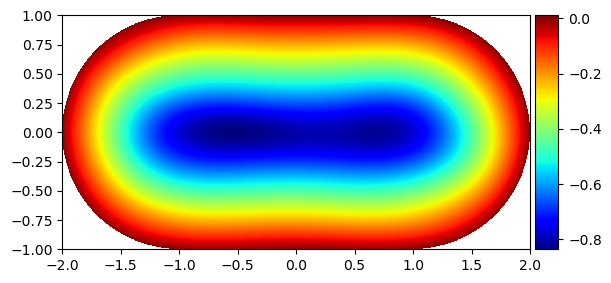

2


IntProgress(value=0, max=50)

best epoch: 5000 best loss: 0.7091843485832214
load from ckpt!


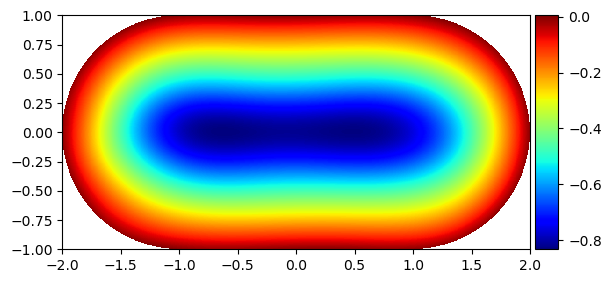

3


IntProgress(value=0, max=50)

best epoch: 4800 best loss: 0.690773069858551
load from ckpt!


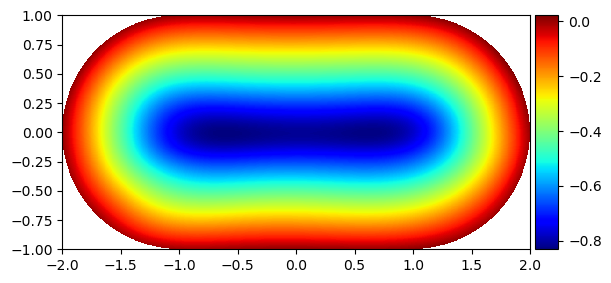

4


IntProgress(value=0, max=50)

best epoch: 4900 best loss: 0.8421904444694519
load from ckpt!


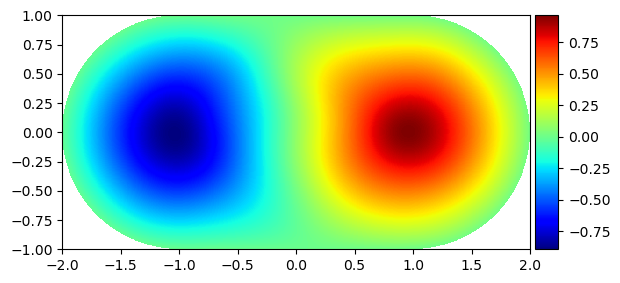

5


IntProgress(value=0, max=50)

best epoch: 4300 best loss: 0.7140527367591858
load from ckpt!


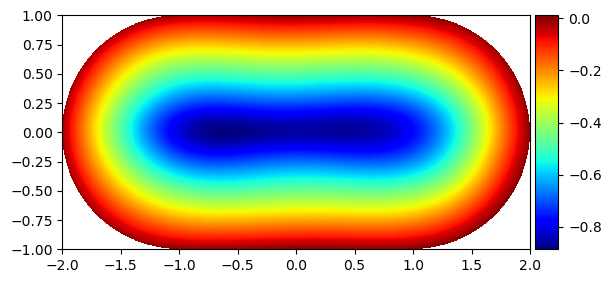

6


IntProgress(value=0, max=50)

KeyboardInterrupt: 

In [22]:
for i in range(200):
    print(i)
    main_inf_fishing(arch='drfnn_Tanh', epochs=5000, iters=i)

0


IntProgress(value=0, max=40)

best epoch: 3500 best loss: 0.6747682690620422
load from ckpt!


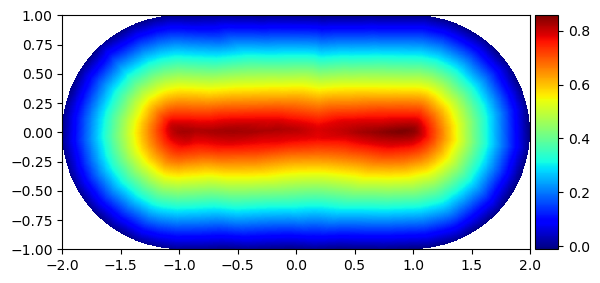

1


IntProgress(value=0, max=40)

best epoch: 4000 best loss: 0.6919744610786438
load from ckpt!


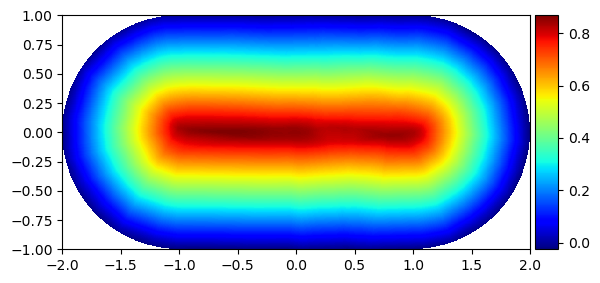

2


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.7263793349266052
load from ckpt!


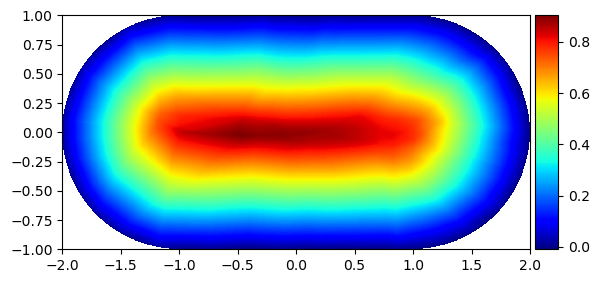

3


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.6909013390541077
load from ckpt!


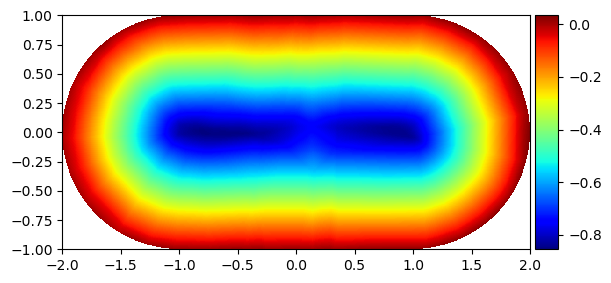

4


IntProgress(value=0, max=40)

best epoch: 3300 best loss: 0.6642407774925232
load from ckpt!


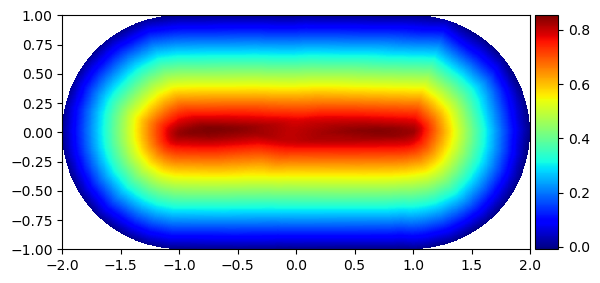

5


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.7176380157470703
load from ckpt!


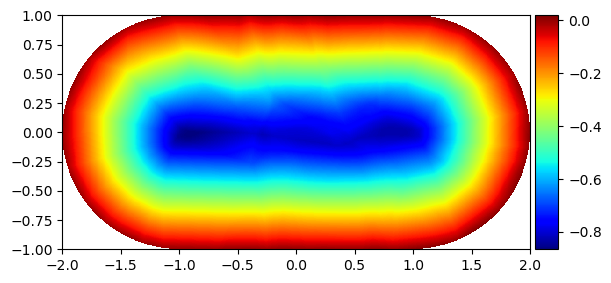

6


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.6634983420372009
load from ckpt!


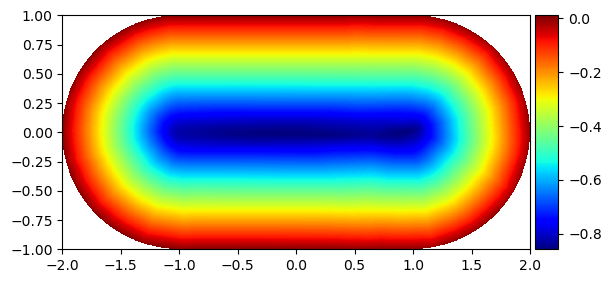

7


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.7034714818000793
load from ckpt!


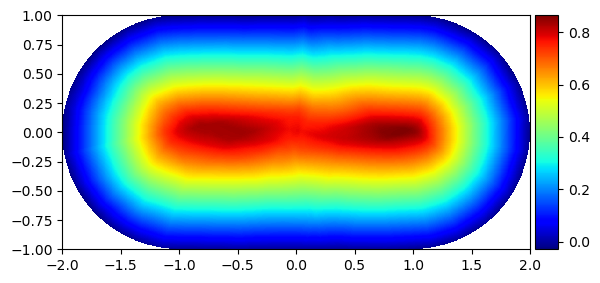

8


IntProgress(value=0, max=40)

best epoch: 3300 best loss: 0.6886343955993652
load from ckpt!


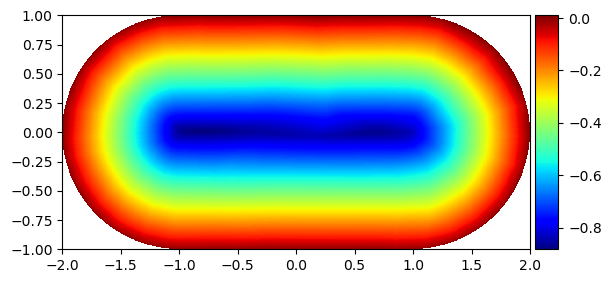

9


IntProgress(value=0, max=40)

best epoch: 4000 best loss: 0.731974184513092
load from ckpt!


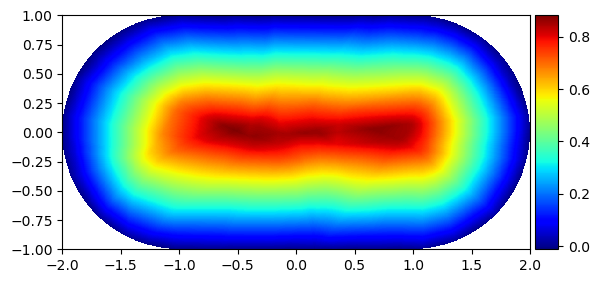

10


IntProgress(value=0, max=40)

best epoch: 3400 best loss: 0.6659365296363831
load from ckpt!


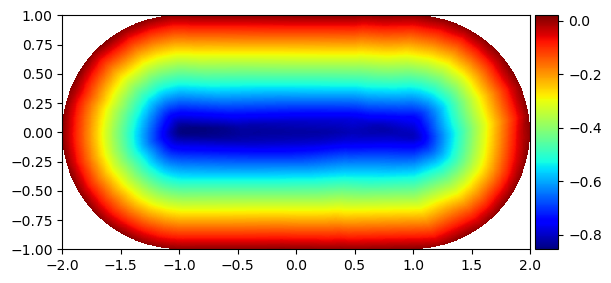

11


IntProgress(value=0, max=40)

best epoch: 4000 best loss: 0.6911360025405884
load from ckpt!


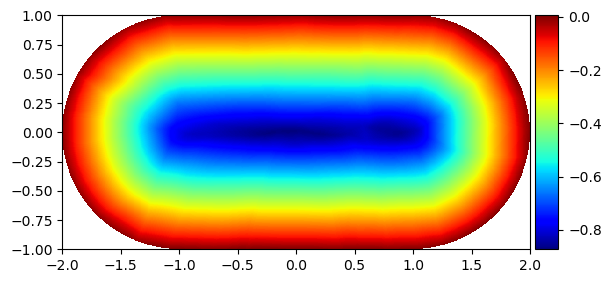

12


IntProgress(value=0, max=40)

best epoch: 3600 best loss: 0.6891852021217346
load from ckpt!


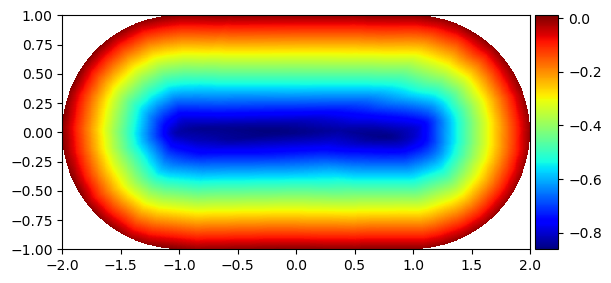

13


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.6827443838119507
load from ckpt!


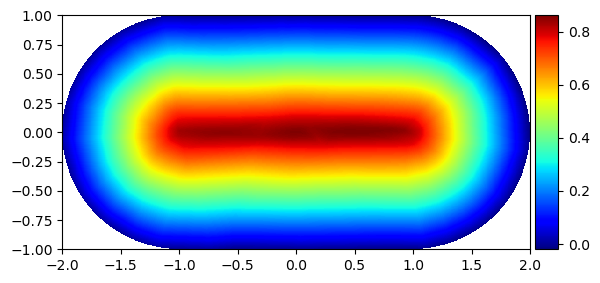

14


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.6753805875778198
load from ckpt!


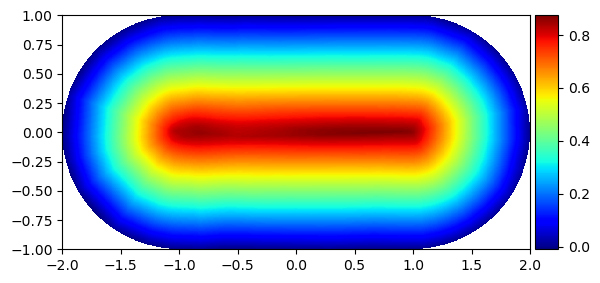

15


IntProgress(value=0, max=40)

best epoch: 3500 best loss: 0.7199271321296692
load from ckpt!


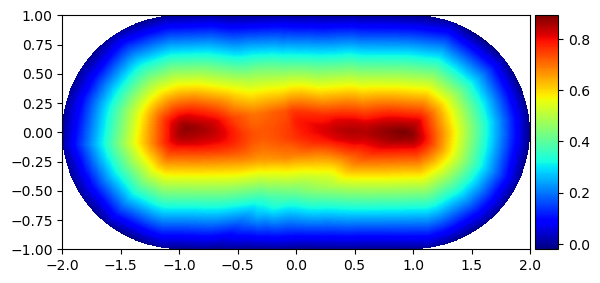

16


IntProgress(value=0, max=40)

best epoch: 3400 best loss: 0.7452990412712097
load from ckpt!


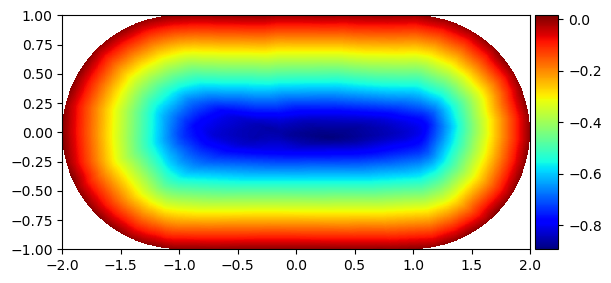

17


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.6948155760765076
load from ckpt!


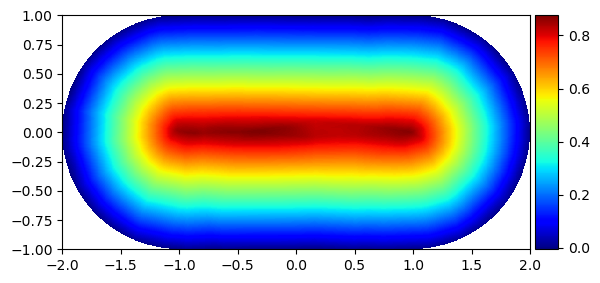

18


IntProgress(value=0, max=40)

best epoch: 3700 best loss: 0.6737605333328247
load from ckpt!


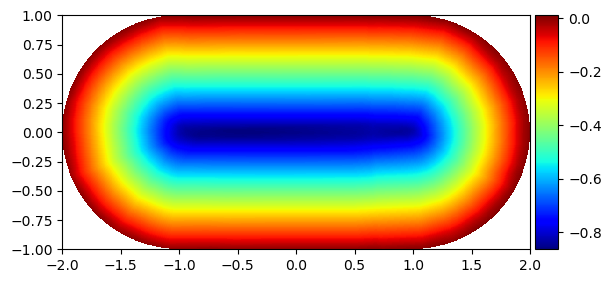

19


IntProgress(value=0, max=40)

best epoch: 3700 best loss: 0.6869120001792908
load from ckpt!


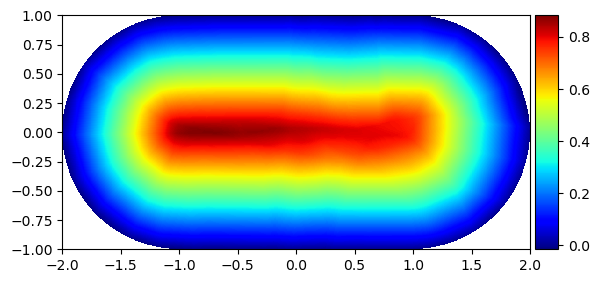

20


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.7261637449264526
load from ckpt!


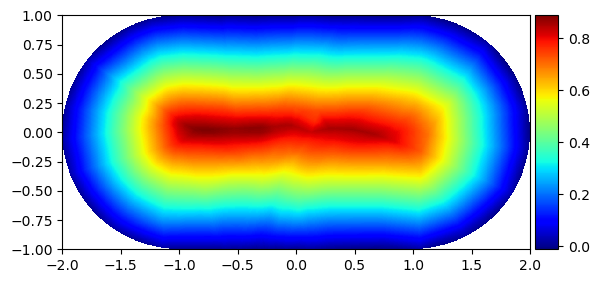

21


IntProgress(value=0, max=40)

best epoch: 3600 best loss: 0.7387228012084961
load from ckpt!


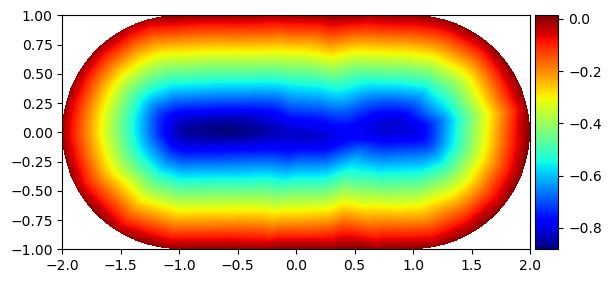

22


IntProgress(value=0, max=40)

best epoch: 3700 best loss: 0.6708447337150574
load from ckpt!


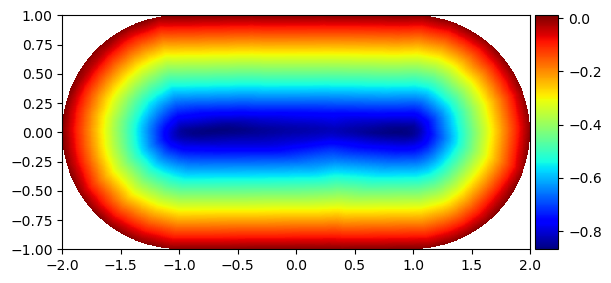

23


IntProgress(value=0, max=40)

best epoch: 3500 best loss: 0.6919054985046387
load from ckpt!


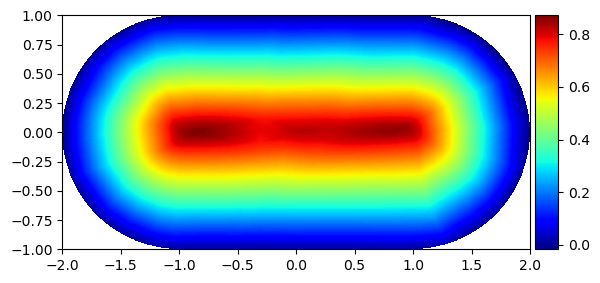

24


IntProgress(value=0, max=40)

best epoch: 4000 best loss: 0.6631568670272827
load from ckpt!


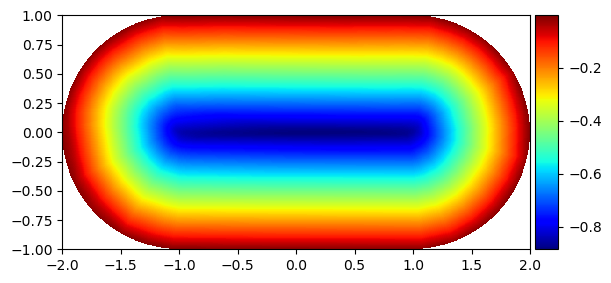

25


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.6792265772819519
load from ckpt!


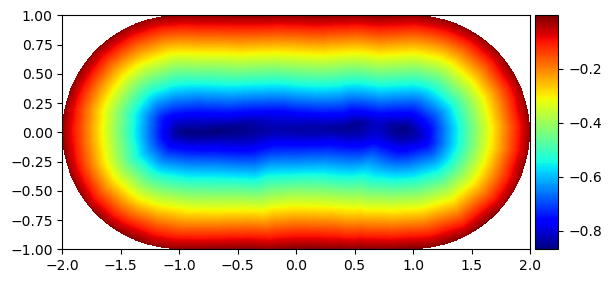

26


IntProgress(value=0, max=40)

best epoch: 3600 best loss: 0.7199162244796753
load from ckpt!


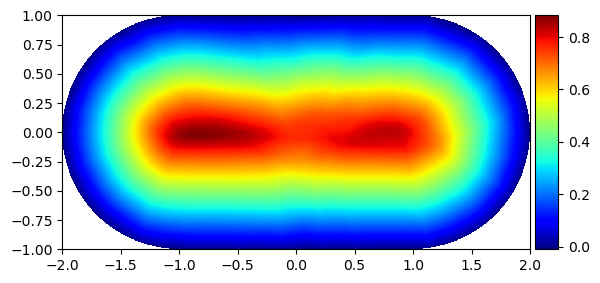

27


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.6928402781486511
load from ckpt!


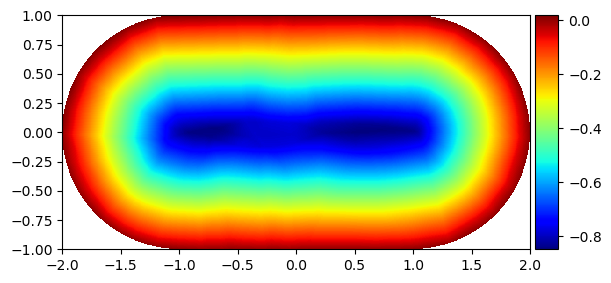

28


IntProgress(value=0, max=40)

best epoch: 4000 best loss: 0.698792576789856
load from ckpt!


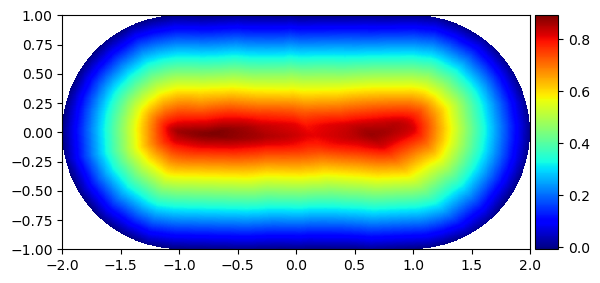

29


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.6850726008415222
load from ckpt!


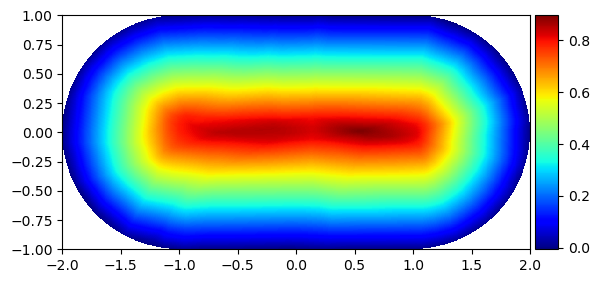

30


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.6863464713096619
load from ckpt!


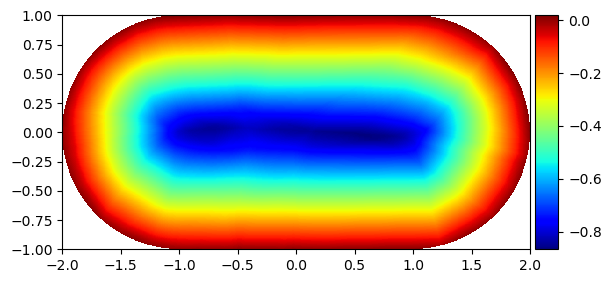

31


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.6953745484352112
load from ckpt!


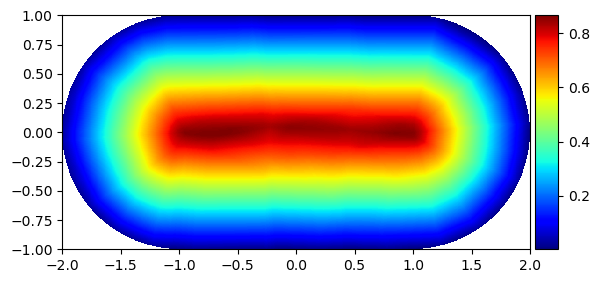

32


IntProgress(value=0, max=40)

best epoch: 3700 best loss: 0.7259956002235413
load from ckpt!


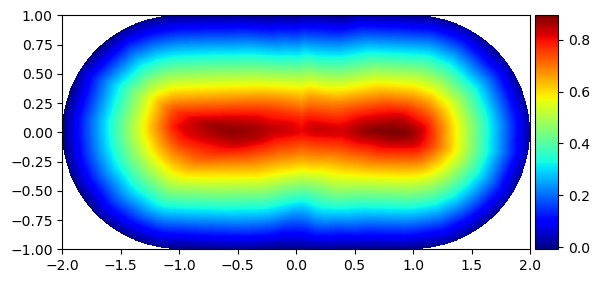

33


IntProgress(value=0, max=40)

best epoch: 3700 best loss: 0.7003069519996643
load from ckpt!


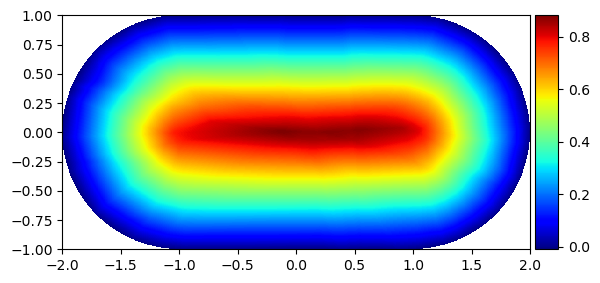

34


IntProgress(value=0, max=40)

best epoch: 3400 best loss: 0.695341169834137
load from ckpt!


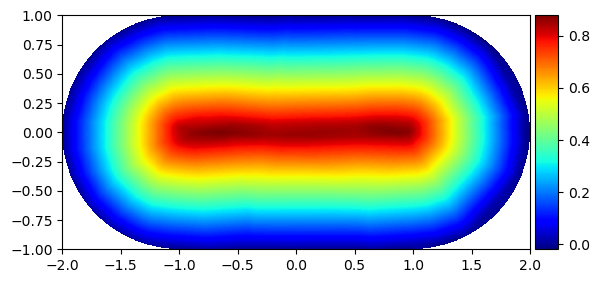

35


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.6694141030311584
load from ckpt!


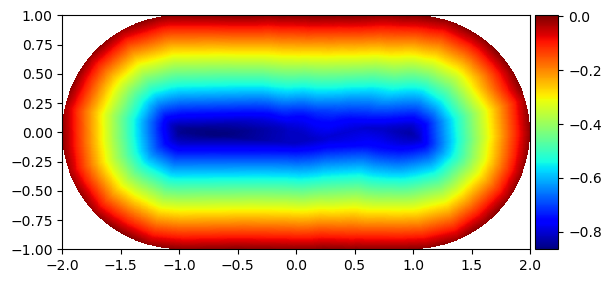

36


IntProgress(value=0, max=40)

best epoch: 3300 best loss: 0.6953758001327515
load from ckpt!


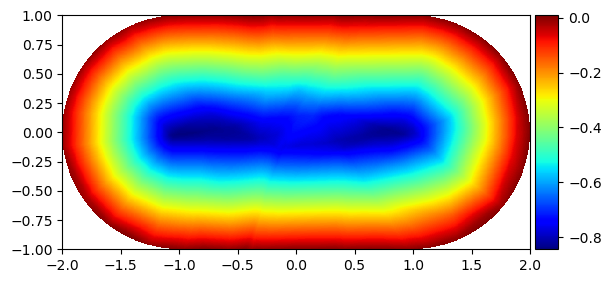

37


IntProgress(value=0, max=40)

best epoch: 3700 best loss: 0.6850528717041016
load from ckpt!


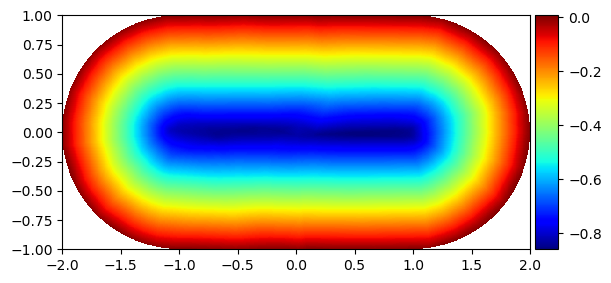

38


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.6995491981506348
load from ckpt!


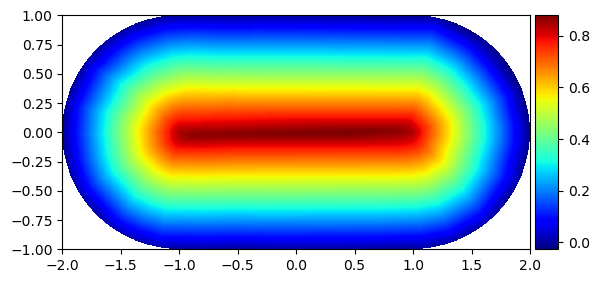

39


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.7093104124069214
load from ckpt!


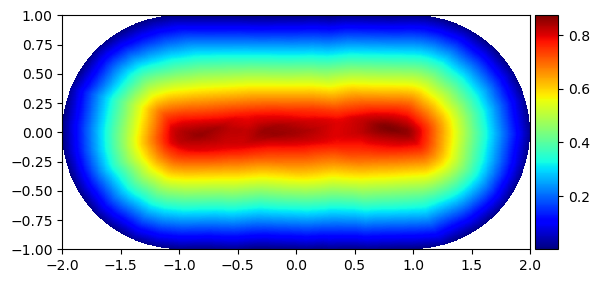

40


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.8096026182174683
load from ckpt!


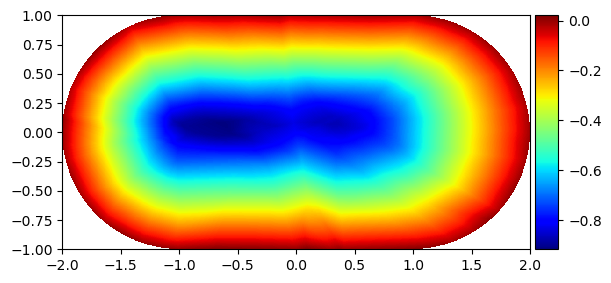

41


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.7002390623092651
load from ckpt!


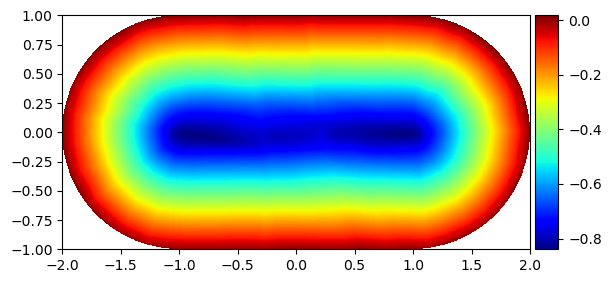

42


IntProgress(value=0, max=40)

best epoch: 4000 best loss: 0.7424381971359253
load from ckpt!


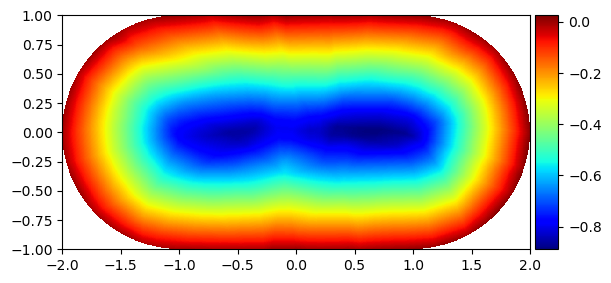

43


IntProgress(value=0, max=40)

best epoch: 3400 best loss: 0.6890680193901062
load from ckpt!


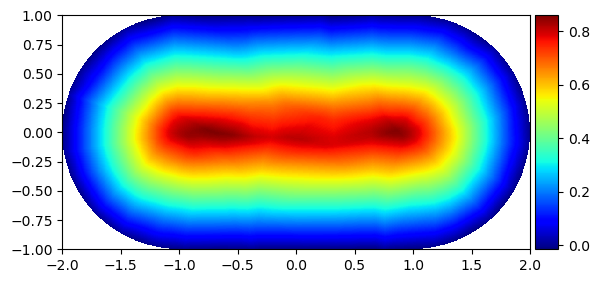

44


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.694458544254303
load from ckpt!


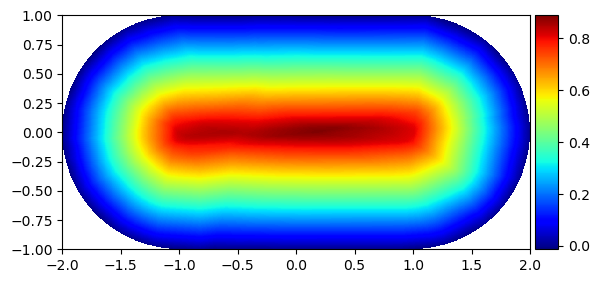

45


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.6794984936714172
load from ckpt!


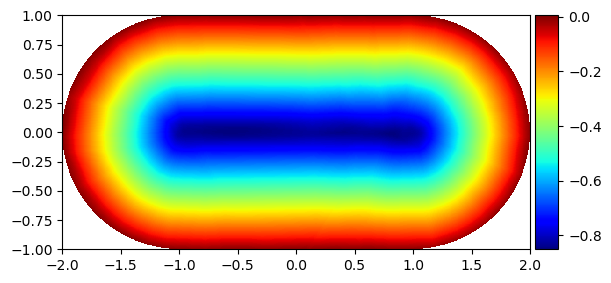

46


IntProgress(value=0, max=40)

best epoch: 3600 best loss: 0.6775399446487427
load from ckpt!


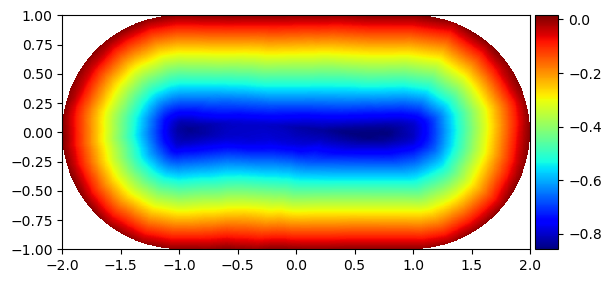

47


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.7213354706764221
load from ckpt!


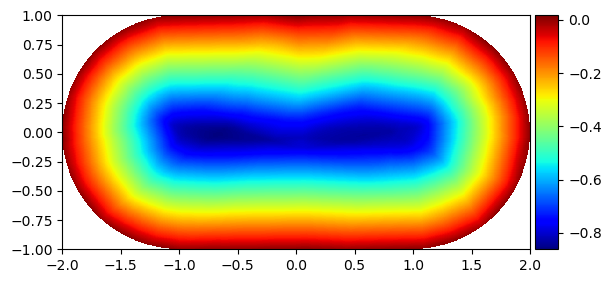

48


IntProgress(value=0, max=40)

best epoch: 3400 best loss: 0.719019889831543
load from ckpt!


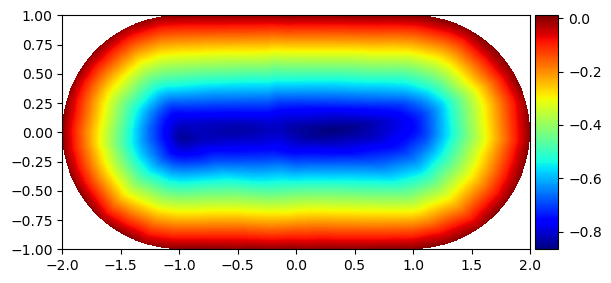

49


IntProgress(value=0, max=40)

best epoch: 3700 best loss: 0.6771378517150879
load from ckpt!


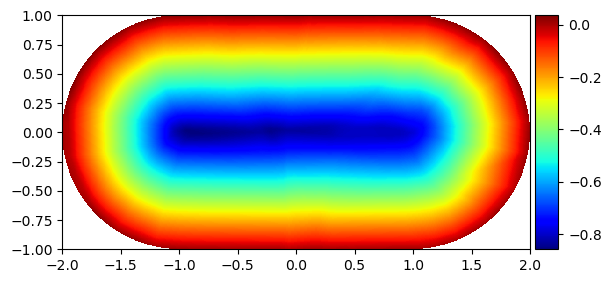

50


IntProgress(value=0, max=40)

best epoch: 3400 best loss: 0.6978071331977844
load from ckpt!


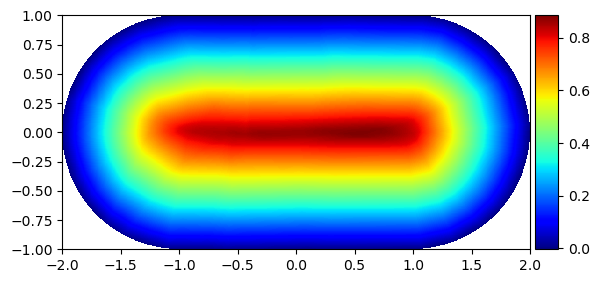

51


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.6947177648544312
load from ckpt!


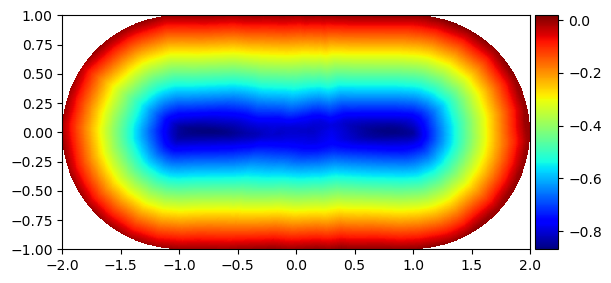

52


IntProgress(value=0, max=40)

best epoch: 3600 best loss: 0.7280347943305969
load from ckpt!


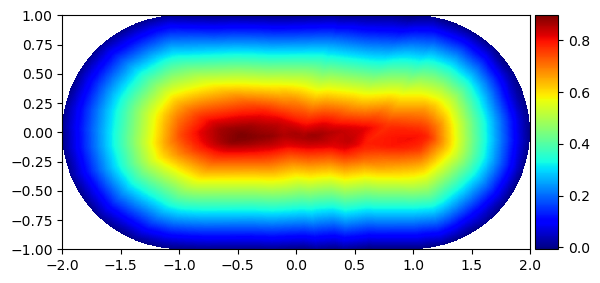

53


IntProgress(value=0, max=40)

best epoch: 3600 best loss: 0.6737067699432373
load from ckpt!


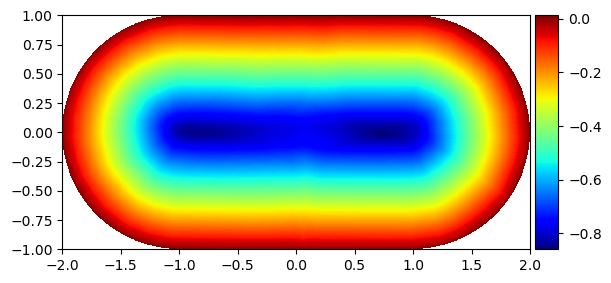

54


IntProgress(value=0, max=40)

best epoch: 3300 best loss: 0.6757562756538391
load from ckpt!


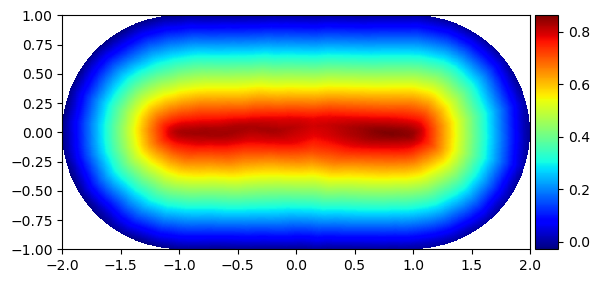

55


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.7275440692901611
load from ckpt!


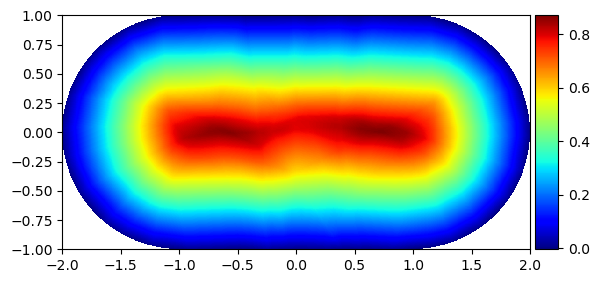

56


IntProgress(value=0, max=40)

best epoch: 3300 best loss: 0.7020240426063538
load from ckpt!


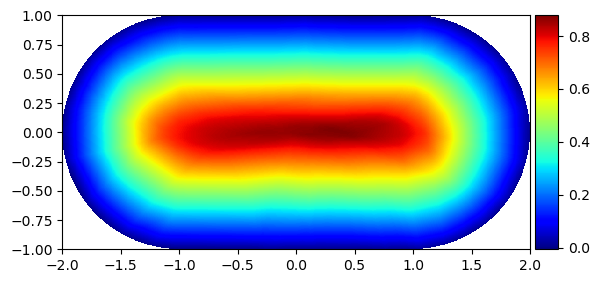

57


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.6848757863044739
load from ckpt!


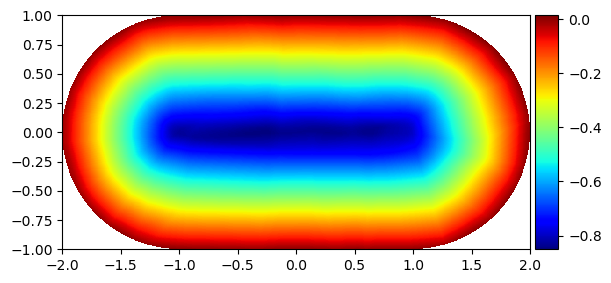

58


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.7365908026695251
load from ckpt!


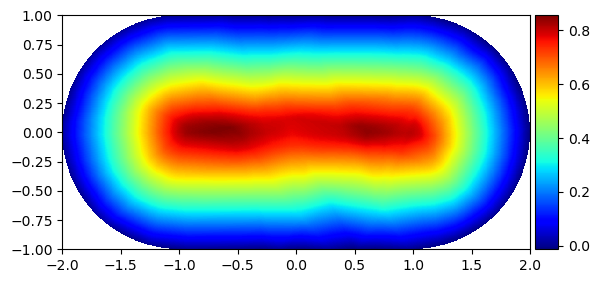

59


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.6766127943992615
load from ckpt!


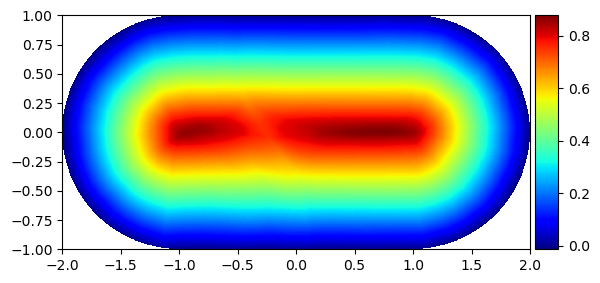

60


IntProgress(value=0, max=40)

best epoch: 3700 best loss: 0.7341171503067017
load from ckpt!


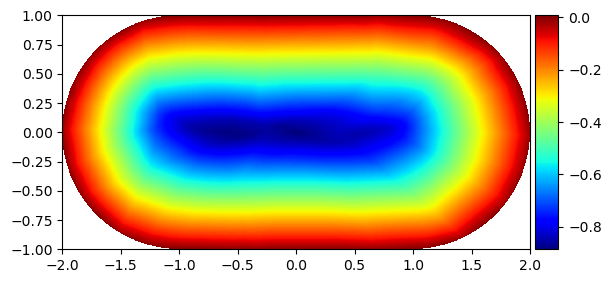

61


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.6889092922210693
load from ckpt!


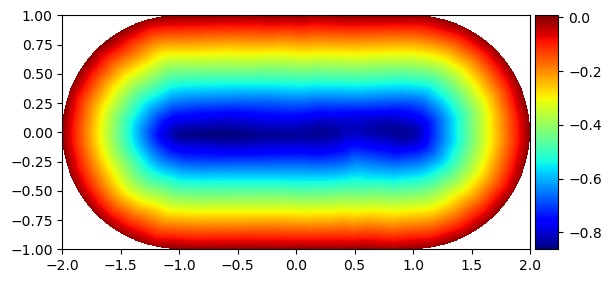

62


IntProgress(value=0, max=40)

best epoch: 3500 best loss: 0.7049034237861633
load from ckpt!


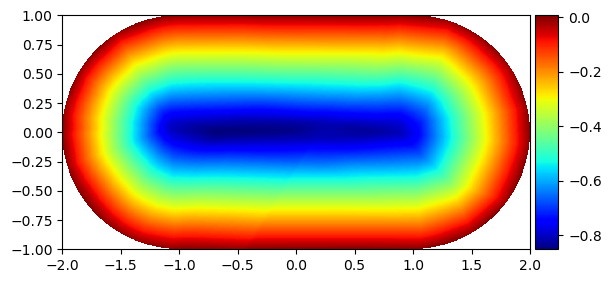

63


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.7035776972770691
load from ckpt!


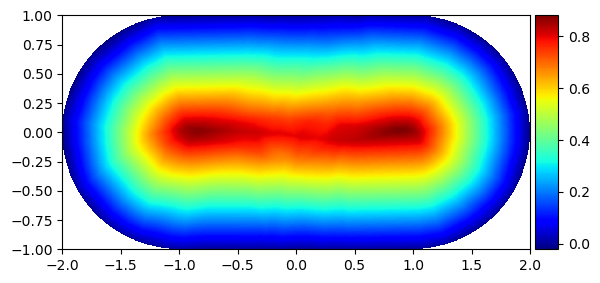

64


IntProgress(value=0, max=40)

best epoch: 3700 best loss: 0.6950966715812683
load from ckpt!


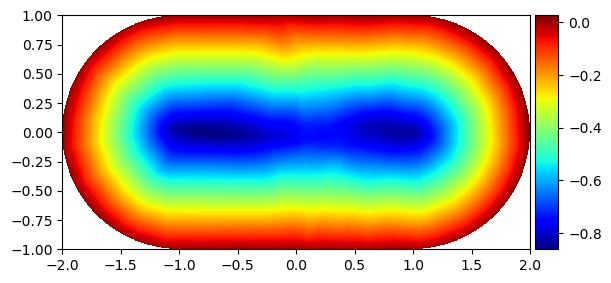

65


IntProgress(value=0, max=40)

best epoch: 4000 best loss: 0.7014506459236145
load from ckpt!


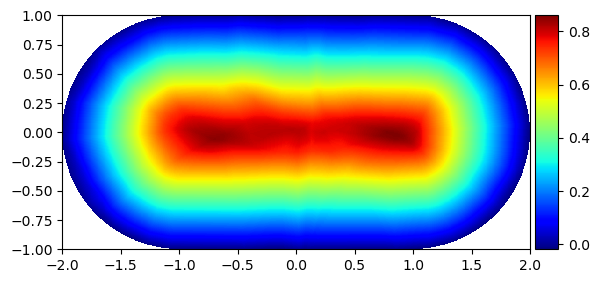

66


IntProgress(value=0, max=40)

best epoch: 3400 best loss: 0.7100833058357239
load from ckpt!


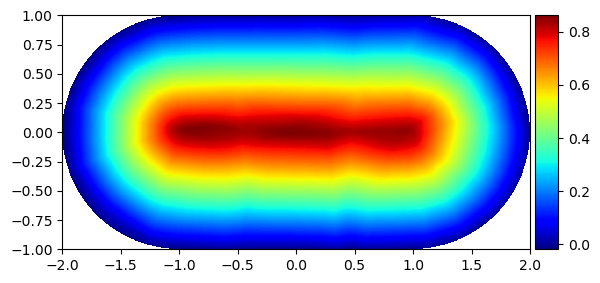

67


IntProgress(value=0, max=40)

best epoch: 4000 best loss: 0.6641111969947815
load from ckpt!


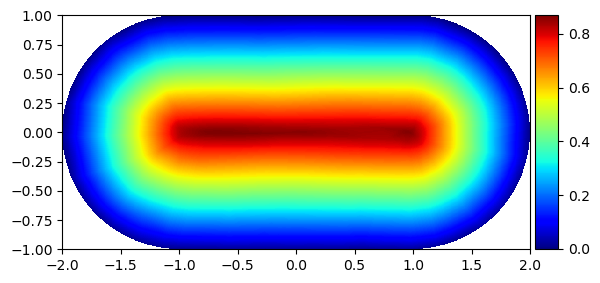

68


IntProgress(value=0, max=40)

best epoch: 3700 best loss: 0.7023776173591614
load from ckpt!


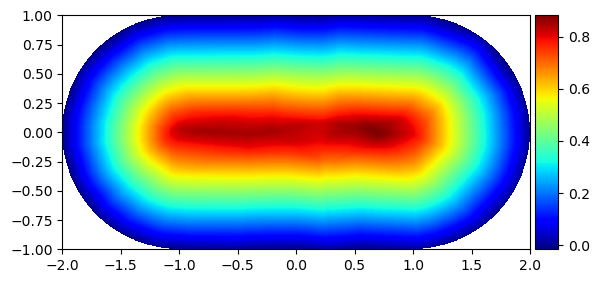

69


IntProgress(value=0, max=40)

best epoch: 3700 best loss: 0.7052822709083557
load from ckpt!


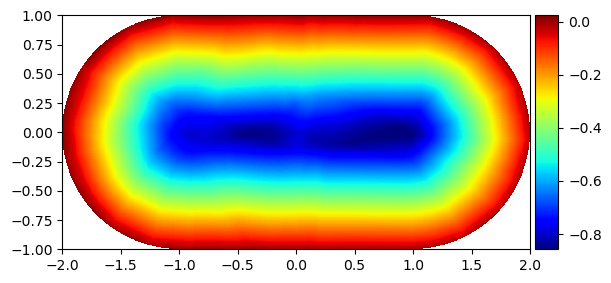

70


IntProgress(value=0, max=40)

best epoch: 3700 best loss: 0.6599850058555603
load from ckpt!


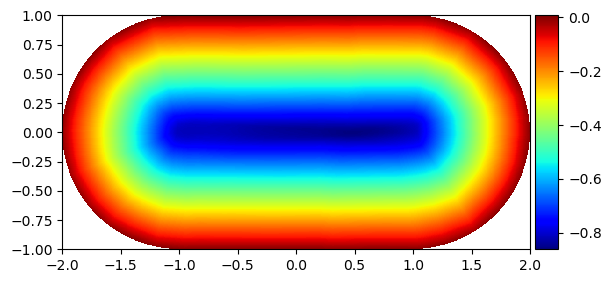

71


IntProgress(value=0, max=40)

best epoch: 3700 best loss: 0.6825120449066162
load from ckpt!


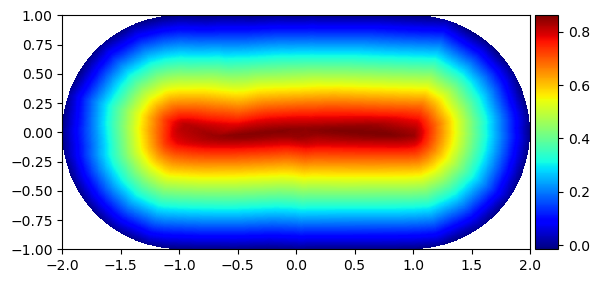

72


IntProgress(value=0, max=40)

best epoch: 3400 best loss: 0.6929617524147034
load from ckpt!


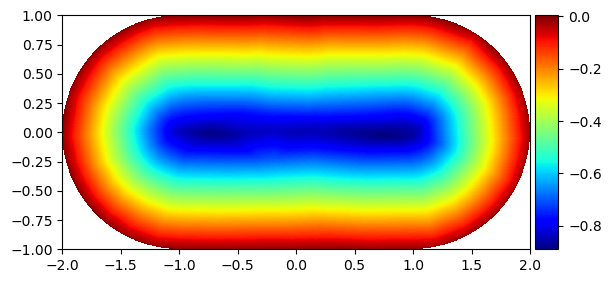

73


IntProgress(value=0, max=40)

best epoch: 3300 best loss: 0.6892536878585815
load from ckpt!


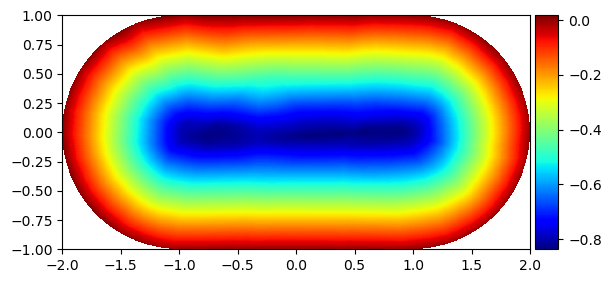

74


IntProgress(value=0, max=40)

best epoch: 3600 best loss: 0.6948114037513733
load from ckpt!


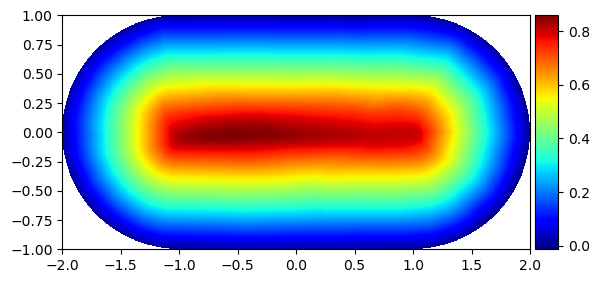

75


IntProgress(value=0, max=40)

best epoch: 4000 best loss: 0.7046541571617126
load from ckpt!


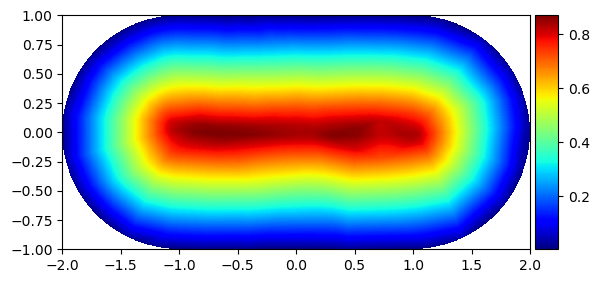

76


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.7365216016769409
load from ckpt!


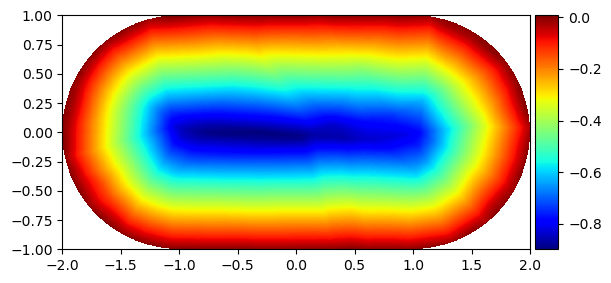

77


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.7358778715133667
load from ckpt!


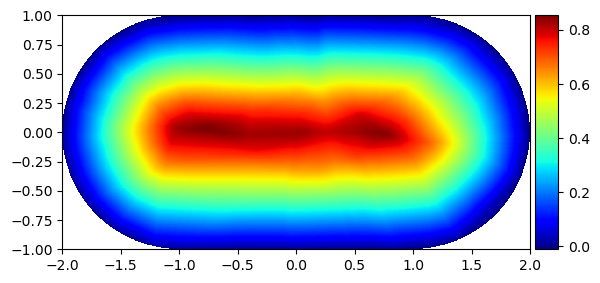

78


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.6839177012443542
load from ckpt!


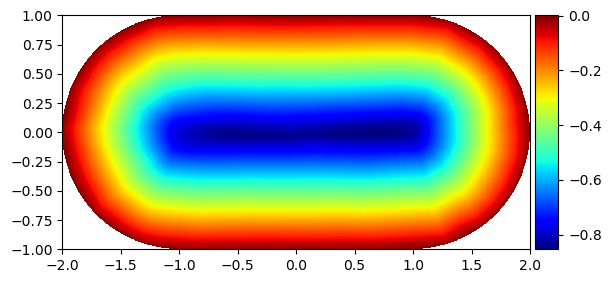

79


IntProgress(value=0, max=40)

best epoch: 3400 best loss: 0.6799619793891907
load from ckpt!


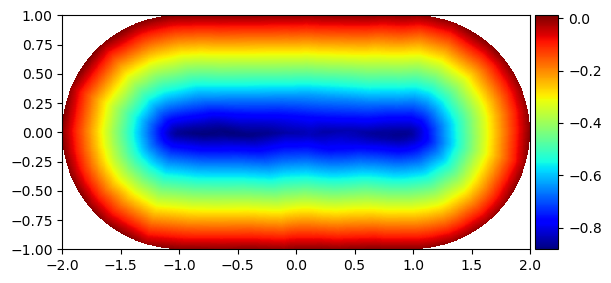

80


IntProgress(value=0, max=40)

best epoch: 4000 best loss: 0.7187460064888
load from ckpt!


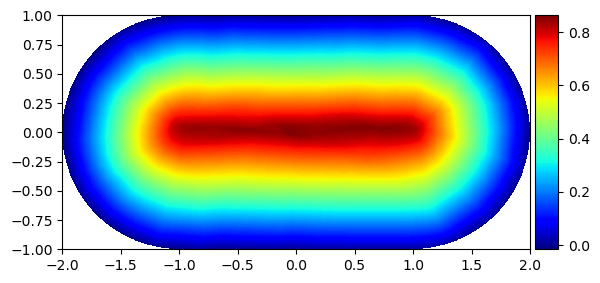

81


IntProgress(value=0, max=40)

best epoch: 3600 best loss: 0.6902904510498047
load from ckpt!


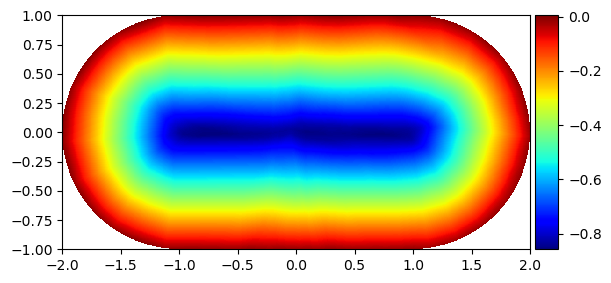

82


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.7639362215995789
load from ckpt!


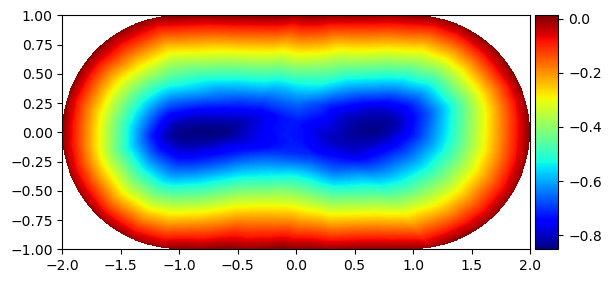

83


IntProgress(value=0, max=40)

best epoch: 3500 best loss: 0.6739141941070557
load from ckpt!


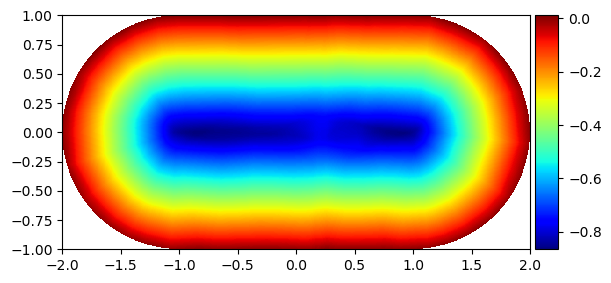

84


IntProgress(value=0, max=40)

best epoch: 4000 best loss: 0.6752154231071472
load from ckpt!


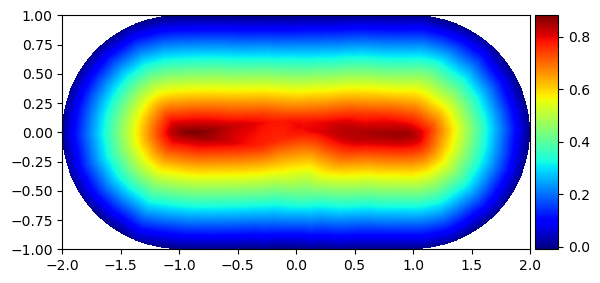

85


IntProgress(value=0, max=40)

best epoch: 4000 best loss: 0.6681603193283081
load from ckpt!


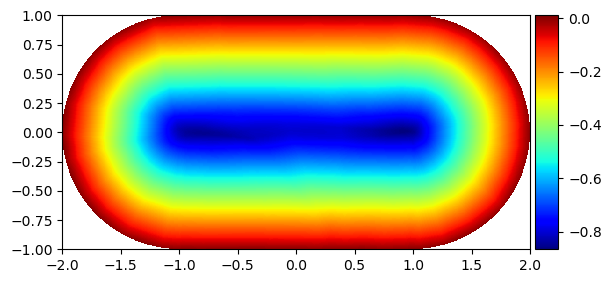

86


IntProgress(value=0, max=40)

best epoch: 3700 best loss: 0.740818977355957
load from ckpt!


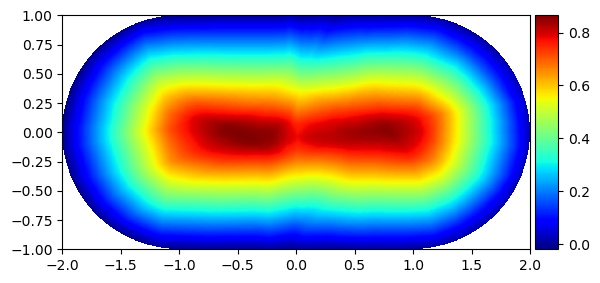

87


IntProgress(value=0, max=40)

best epoch: 3500 best loss: 0.7220469117164612
load from ckpt!


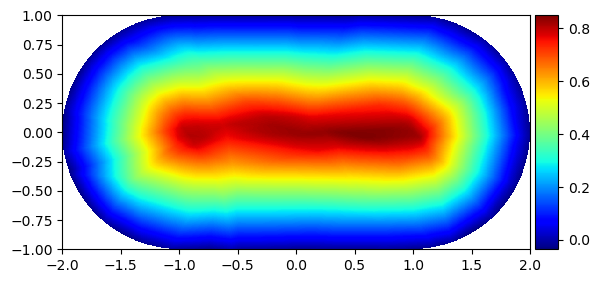

88


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.6823083758354187
load from ckpt!


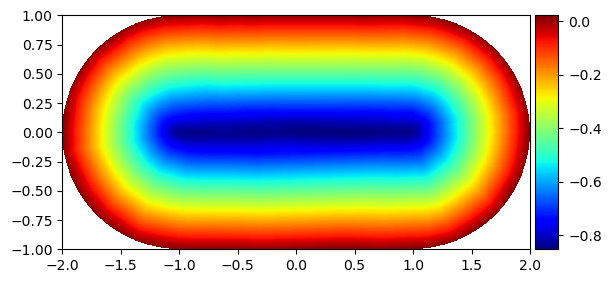

89


IntProgress(value=0, max=40)

best epoch: 4000 best loss: 0.6870003342628479
load from ckpt!


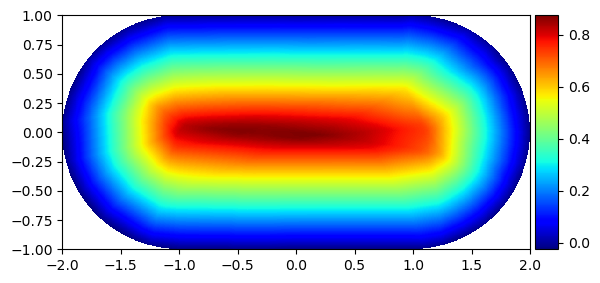

90


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.6778135299682617
load from ckpt!


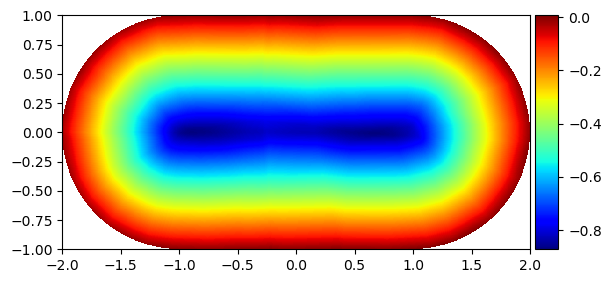

91


IntProgress(value=0, max=40)

best epoch: 3600 best loss: 0.6770539879798889
load from ckpt!


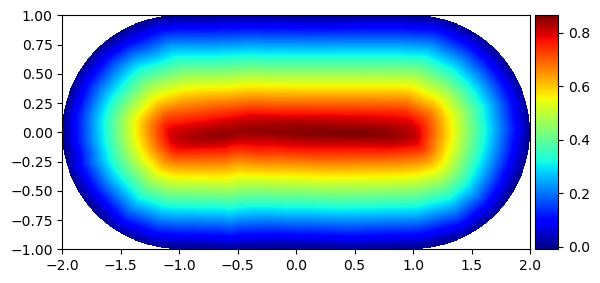

92


IntProgress(value=0, max=40)

best epoch: 3500 best loss: 0.6725118160247803
load from ckpt!


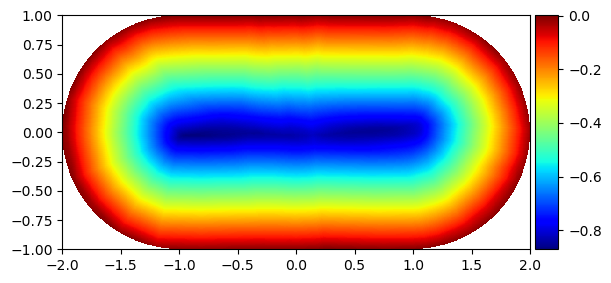

93


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.6940935254096985
load from ckpt!


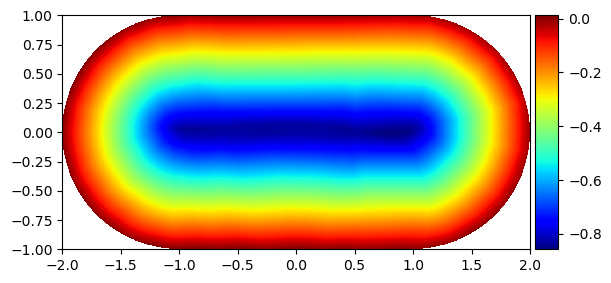

94


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.6829206943511963
load from ckpt!


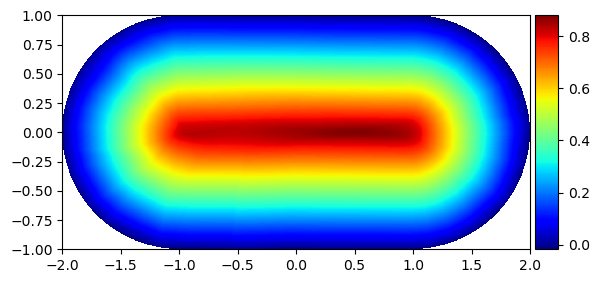

95


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.6912844777107239
load from ckpt!


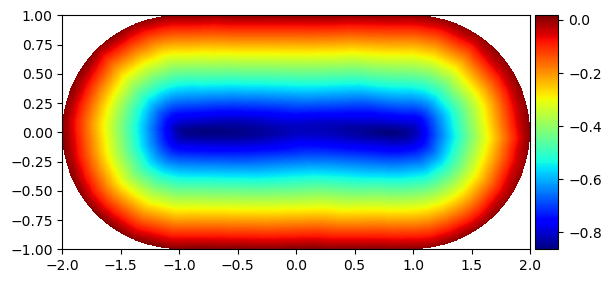

96


IntProgress(value=0, max=40)

best epoch: 3500 best loss: 0.6775427460670471
load from ckpt!


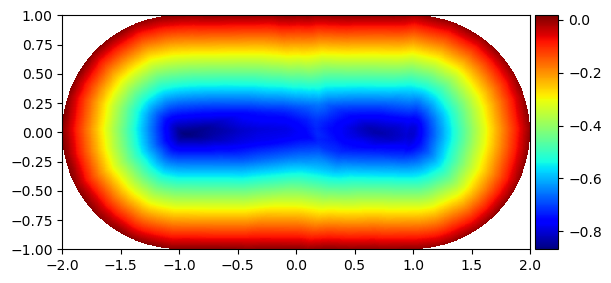

97


IntProgress(value=0, max=40)

best epoch: 3700 best loss: 0.678180456161499
load from ckpt!


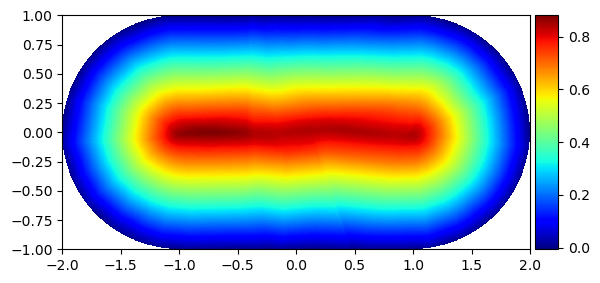

98


IntProgress(value=0, max=40)

best epoch: 3300 best loss: 0.712792158126831
load from ckpt!


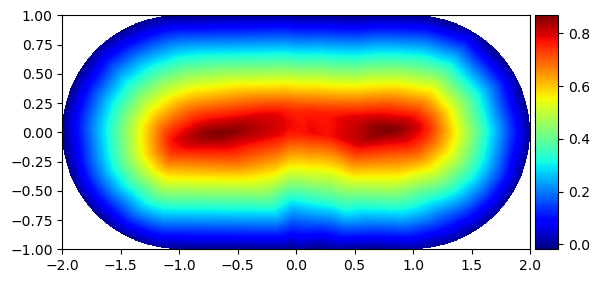

99


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.7119132876396179
load from ckpt!


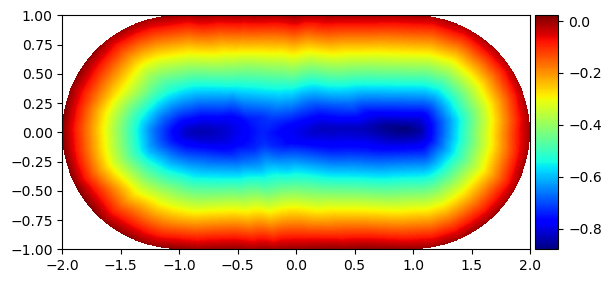

100


IntProgress(value=0, max=40)

best epoch: 3400 best loss: 0.6914654970169067
load from ckpt!


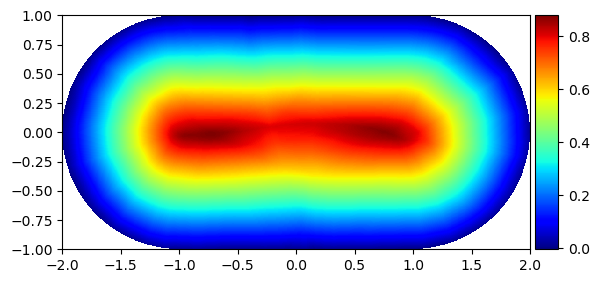

101


IntProgress(value=0, max=40)

best epoch: 4000 best loss: 0.6658251285552979
load from ckpt!


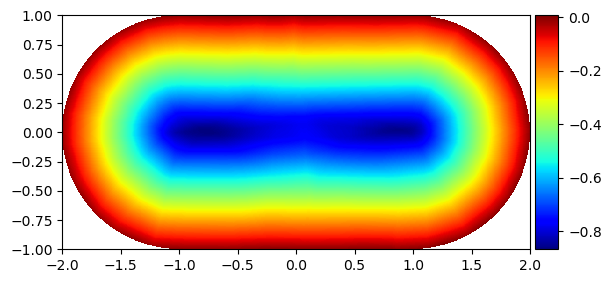

102


IntProgress(value=0, max=40)

best epoch: 3400 best loss: 0.7494935393333435
load from ckpt!


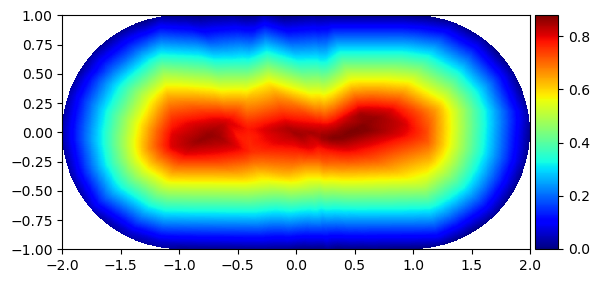

103


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.6948699355125427
load from ckpt!


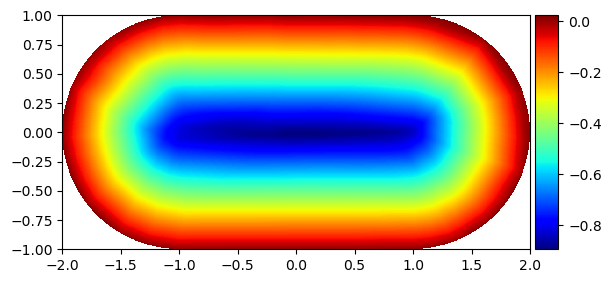

104


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.7282240986824036
load from ckpt!


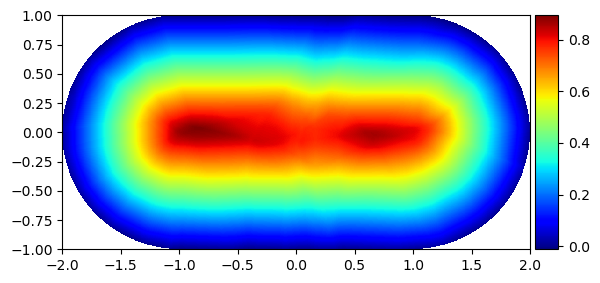

105


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.6962224245071411
load from ckpt!


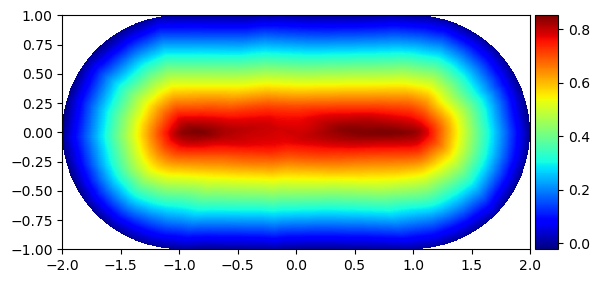

106


IntProgress(value=0, max=40)

best epoch: 3600 best loss: 0.6931357979774475
load from ckpt!


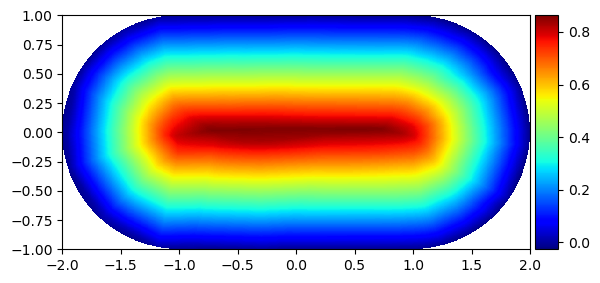

107


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.683815598487854
load from ckpt!


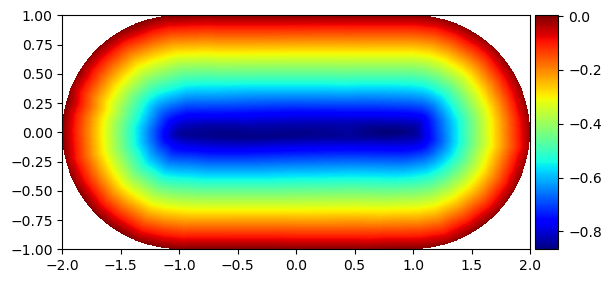

108


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.7206348180770874
load from ckpt!


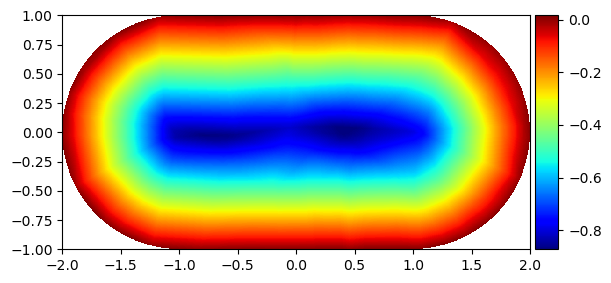

109


IntProgress(value=0, max=40)

best epoch: 4000 best loss: 0.6753631234169006
load from ckpt!


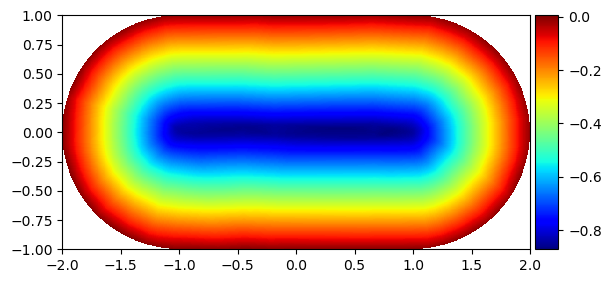

110


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.7053703665733337
load from ckpt!


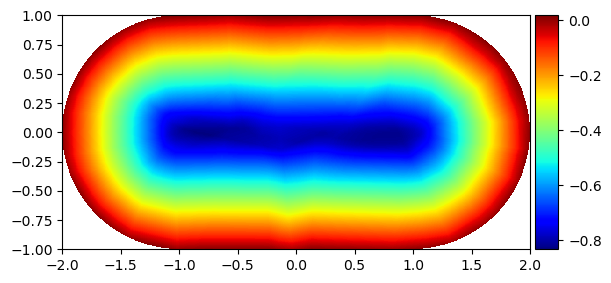

111


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.7392096519470215
load from ckpt!


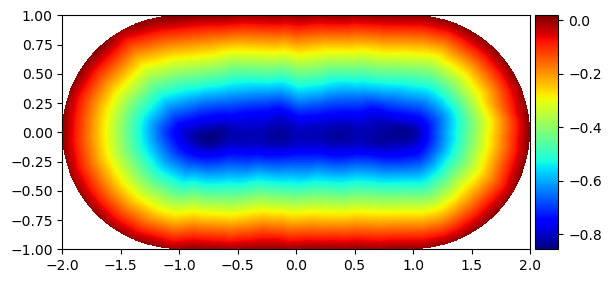

112


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.7871787548065186
load from ckpt!


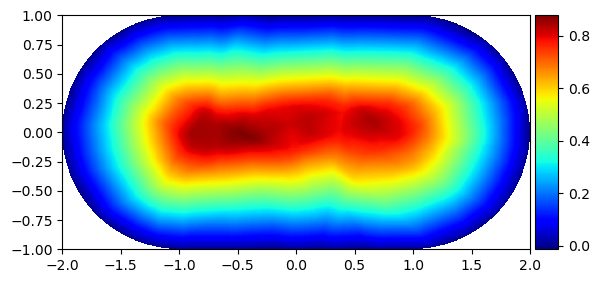

113


IntProgress(value=0, max=40)

best epoch: 3300 best loss: 0.8201368451118469
load from ckpt!


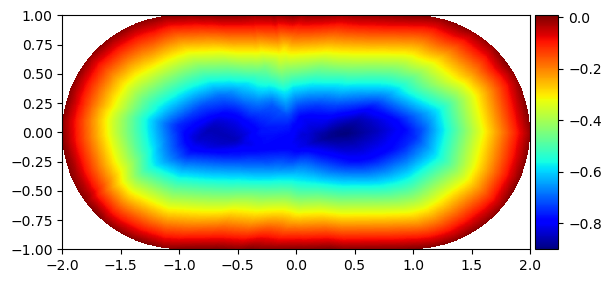

114


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.7047967314720154
load from ckpt!


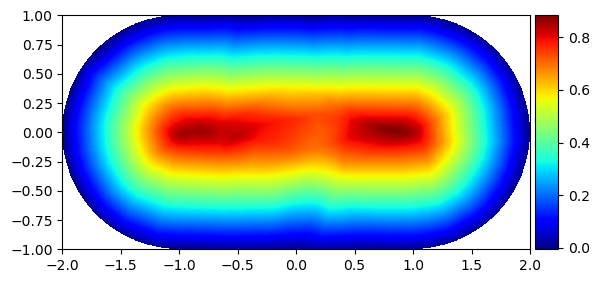

115


IntProgress(value=0, max=40)

best epoch: 3900 best loss: 0.6887430548667908
load from ckpt!


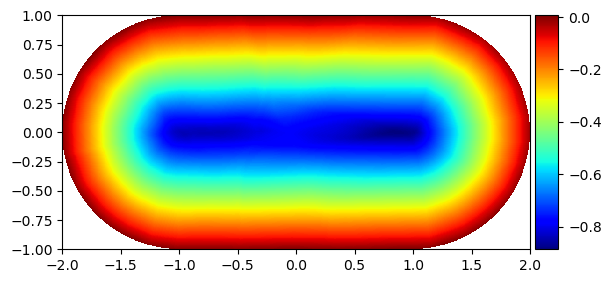

116


IntProgress(value=0, max=40)

best epoch: 3500 best loss: 0.6932250261306763
load from ckpt!


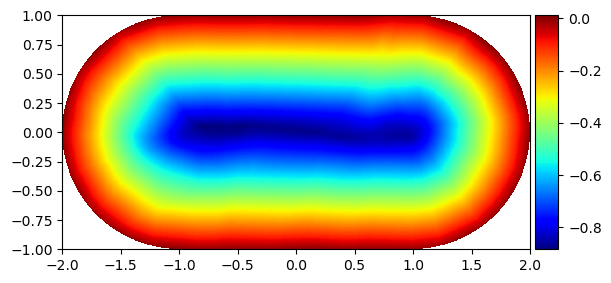

117


IntProgress(value=0, max=40)

best epoch: 3600 best loss: 0.6601830720901489
load from ckpt!


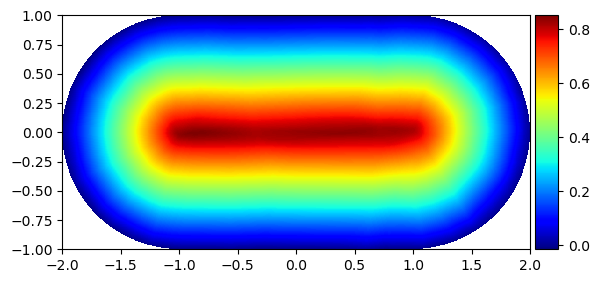

118


IntProgress(value=0, max=40)

best epoch: 3300 best loss: 0.7328580617904663
load from ckpt!


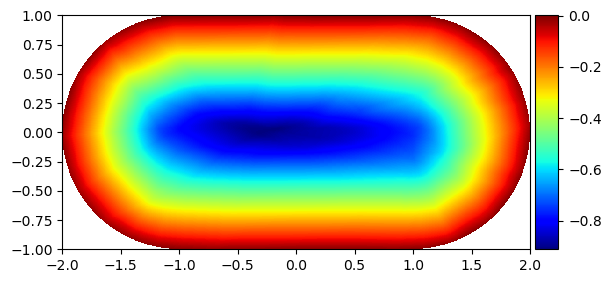

119


IntProgress(value=0, max=40)

best epoch: 3800 best loss: 0.7109599709510803
load from ckpt!


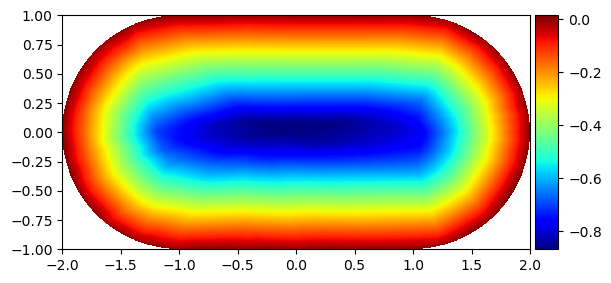

120


IntProgress(value=0, max=40)

best epoch: 3700 best loss: 0.8261265158653259
load from ckpt!


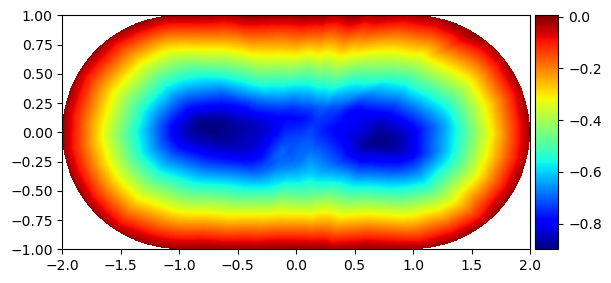

121


IntProgress(value=0, max=40)

KeyboardInterrupt: 

In [22]:
for i in range(200):
    print(i)
    main_inf_fishing(arch='drrnn_ReLU', epochs=4000, iters=i)

## OLD 

sausage 1


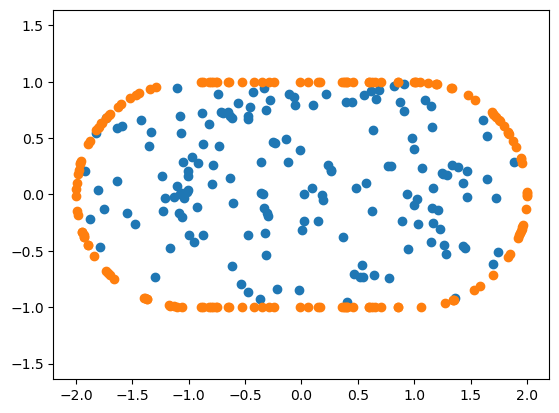

drrnn_Tanh


IntProgress(value=0)

drrnn_Tanh(
  (phi): Tanh()
  (stack): ModuleList(
    (0): Linear(in_features=2, out_features=10, bias=True)
    (1): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (2): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (3): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (4): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (5): Linear(in_features=10, out_features=1, bias=True)
  )
)
epoch: 0 loss: 389.7330322265625 loss_r: 0.45973679423332214 loss_b: 386.82984352111816 reg_term: 2.4434369802474976
epoch: 100 loss: 4.862117290496826 l

epoch: 6100 loss: 0.9882528781890869 loss_r: 0.8924643397331238 loss_b: 0.014285158831626177 reg_term: 0.0815033819526434
epoch: 6200 loss: 0.9229934811592102 loss_r: 0.8289443850517273 loss_b: 0.042284169467166066 reg_term: 0.05176487844437361
epoch: 6300 loss: 0.9502585530281067 loss_r: 0.8837541937828064 loss_b: 0.05933714099228382 reg_term: 0.007167220464907587
epoch: 6400 loss: 0.9530238509178162 loss_r: 0.844255268573761 loss_b: 0.048925759037956595 reg_term: 0.05984279792755842
epoch: 6500 loss: 0.9513627290725708 loss_r: 0.8846791386604309 loss_b: 0.030667640967294574 reg_term: 0.03601595526561141
epoch: 6600 loss: 0.9257776141166687 loss_r: 0.863944947719574 loss_b: 0.050114106852561235 reg_term: 0.011718557216227055
epoch: 6700 loss: 1.3637995719909668 loss_r: 0.9278804659843445 loss_b: 0.06655448349192739 reg_term: 0.3693646565079689
epoch: 6800 loss: 1.021153450012207 loss_r: 0.88823401927948 loss_b: 0.08536792360246181 reg_term: 0.047551458701491356
epoch: 6900 loss: 1.204

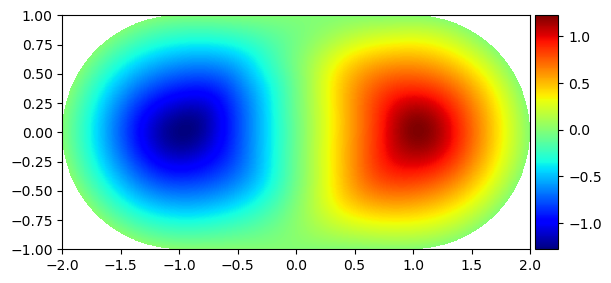

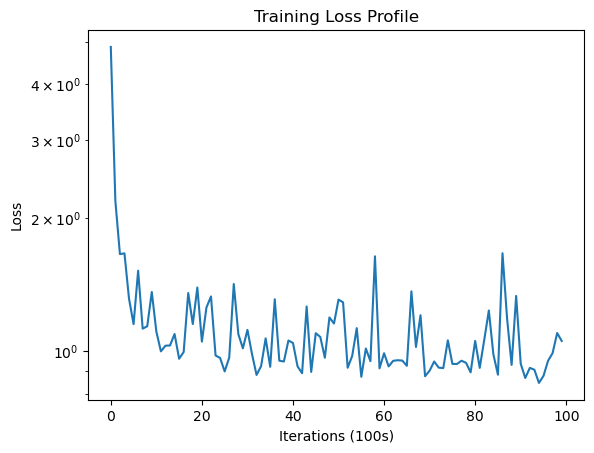

In [37]:
main_inf(epochs=10000)

sausage 1


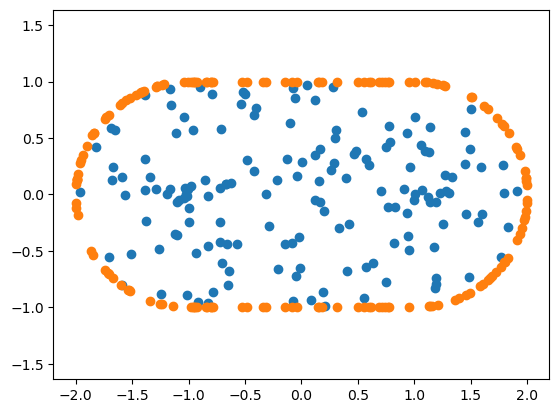

drrnn_Tanh


IntProgress(value=0)

drrnn_Tanh(
  (phi): Tanh()
  (stack): ModuleList(
    (0): Linear(in_features=2, out_features=10, bias=True)
    (1): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (2): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (3): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (4): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (5): Linear(in_features=10, out_features=1, bias=True)
  )
)
epoch: 0 loss: 2.4431471824645996 loss_r: 0.8452012538909912 loss_b: 0.0193743099225685 reg_term: 1.5785714983940125
epoch: 100 loss: 0.8745810389518738 

epoch: 6000 loss: 0.846109926700592 loss_r: 0.8202636241912842 loss_b: 0.018798141391016543 reg_term: 0.0070481677539646626
epoch: 6100 loss: 0.8706369400024414 loss_r: 0.8219243884086609 loss_b: 0.004231166822137311 reg_term: 0.04448140040040016
epoch: 6200 loss: 0.8044816255569458 loss_r: 0.7799205780029297 loss_b: 0.019475514418445528 reg_term: 0.005085556767880917
epoch: 6300 loss: 0.8412521481513977 loss_r: 0.8036783933639526 loss_b: 0.03701311186887324 reg_term: 0.0005606497143162414
epoch: 6400 loss: 0.8347983956336975 loss_r: 0.797309160232544 loss_b: 0.022545437095686793 reg_term: 0.014943782007321715
epoch: 6500 loss: 0.898777186870575 loss_r: 0.8236844539642334 loss_b: 0.05879855481907725 reg_term: 0.016294182278215885
epoch: 6600 loss: 0.8032904267311096 loss_r: 0.765231728553772 loss_b: 0.03055861685425043 reg_term: 0.007500098436139524
epoch: 6700 loss: 0.8553555607795715 loss_r: 0.7979544401168823 loss_b: 0.056505859829485416 reg_term: 0.0008952716598287225
epoch: 6800 l

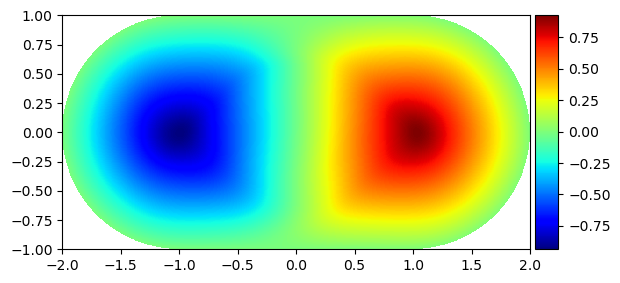

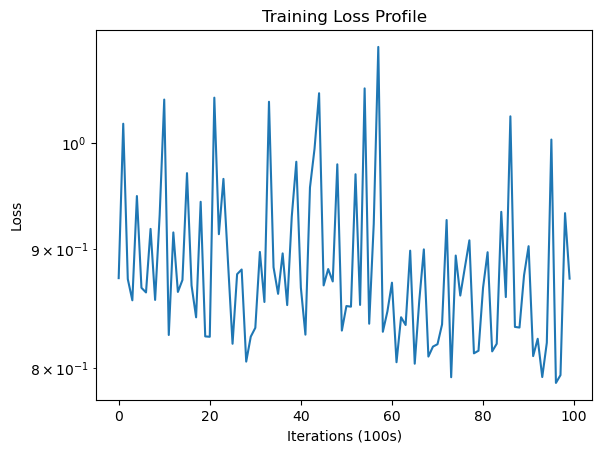

In [30]:
main_inf(epochs=10000, sol2=1)

sausage 1


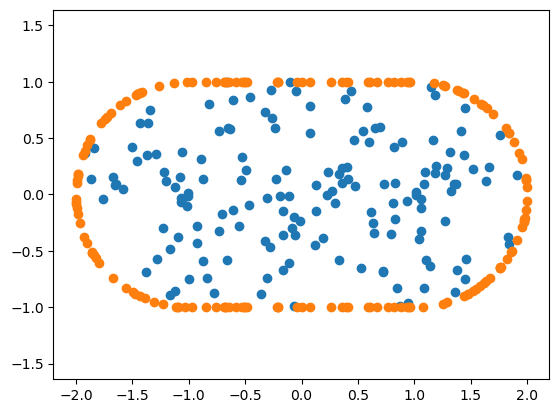

drrnn_Tanh


IntProgress(value=0, max=200)

drrnn_Tanh(
  (phi): Tanh()
  (stack): ModuleList(
    (0): Linear(in_features=2, out_features=10, bias=True)
    (1): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (2): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (3): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (4): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (5): Linear(in_features=10, out_features=1, bias=True)
  )
)
epoch: 0 loss: 2.6229281425476074 loss_r: 0.8342207670211792 loss_b: 0.02266526862513274 reg_term: 1.7660419642925262
epoch: 100 loss: 0.8406347632408142

epoch: 6000 loss: 0.9173871278762817 loss_r: 0.8457531929016113 loss_b: 0.01270202425075695 reg_term: 0.0589318573474884
epoch: 6100 loss: 0.8346253633499146 loss_r: 0.8243004083633423 loss_b: 0.009455996914766729 reg_term: 0.0008689834066899493
epoch: 6200 loss: 0.87311190366745 loss_r: 0.832068145275116 loss_b: 0.020730283576995134 reg_term: 0.020313526038080454
epoch: 6300 loss: 0.9610303640365601 loss_r: 0.7863026261329651 loss_b: 0.04815246909856796 reg_term: 0.126575268805027
epoch: 6400 loss: 0.8834477663040161 loss_r: 0.7752276062965393 loss_b: 0.05481754895299673 reg_term: 0.05340259987860918
epoch: 6500 loss: 0.8516417145729065 loss_r: 0.824753999710083 loss_b: 0.02405667502898723 reg_term: 0.0028310337802395225
epoch: 6600 loss: 0.8837277889251709 loss_r: 0.7695773839950562 loss_b: 0.08813891792669892 reg_term: 0.026011457666754723
epoch: 6700 loss: 0.9164497256278992 loss_r: 0.8499362468719482 loss_b: 0.011547365575097501 reg_term: 0.05496609024703503
epoch: 6800 loss: 0.85

epoch: 12700 loss: 0.8187628984451294 loss_r: 0.8052169680595398 loss_b: 0.013467152311932296 reg_term: 7.878698852437083e-05
epoch: 12800 loss: 0.8336368799209595 loss_r: 0.7993834018707275 loss_b: 0.03356301225721836 reg_term: 0.0006904751353431493
epoch: 12900 loss: 0.8569925427436829 loss_r: 0.7660442590713501 loss_b: 0.055783475982025266 reg_term: 0.03516483586281538
epoch: 13000 loss: 0.8300544023513794 loss_r: 0.8209188580513 loss_b: 0.0042331287113483995 reg_term: 0.0049024412874132395
epoch: 13100 loss: 0.9449992179870605 loss_r: 0.8453699350357056 loss_b: 0.016827138606458902 reg_term: 0.08280212059617043
epoch: 13200 loss: 0.8208553791046143 loss_r: 0.7656289339065552 loss_b: 0.03728553419932723 reg_term: 0.017940925899893045
epoch: 13300 loss: 0.8381862044334412 loss_r: 0.8080617785453796 loss_b: 0.023855098988860846 reg_term: 0.00626931490842253
epoch: 13400 loss: 0.813241720199585 loss_r: 0.7837797403335571 loss_b: 0.009233987366314977 reg_term: 0.02022797241806984
epoch:

epoch: 19300 loss: 0.8104321956634521 loss_r: 0.7766755223274231 loss_b: 0.01722896529827267 reg_term: 0.01652772189117968
epoch: 19400 loss: 0.8125446438789368 loss_r: 0.7906386256217957 loss_b: 0.006759644311387092 reg_term: 0.01514639938250184
epoch: 19500 loss: 0.8008255958557129 loss_r: 0.7837694883346558 loss_b: 0.01144428737461567 reg_term: 0.005611815140582621
epoch: 19600 loss: 0.9589964151382446 loss_r: 0.8306387066841125 loss_b: 0.08470796747133136 reg_term: 0.04364972002804279
epoch: 19700 loss: 0.7928008437156677 loss_r: 0.785546064376831 loss_b: 0.006701949751004577 reg_term: 0.0005528578185476363
epoch: 19800 loss: 0.9188414216041565 loss_r: 0.8244342803955078 loss_b: 0.03704317146912217 reg_term: 0.05736399907618761
epoch: 19900 loss: 0.8098423480987549 loss_r: 0.7933546900749207 loss_b: 0.01576138485688716 reg_term: 0.0007263115548994392
epoch: 20000 loss: 0.914210855960846 loss_r: 0.832217812538147 loss_b: 0.02074722375255078 reg_term: 0.06124581675976515
best epoch: 

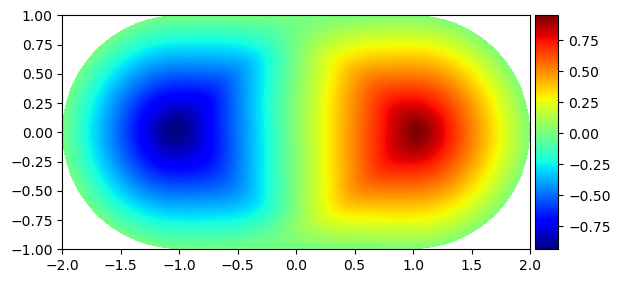

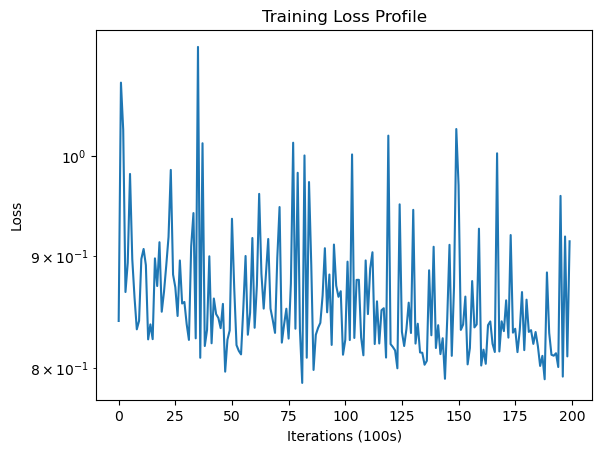

In [105]:
main_inf(epochs=20000, sol2=1)

sausage 1


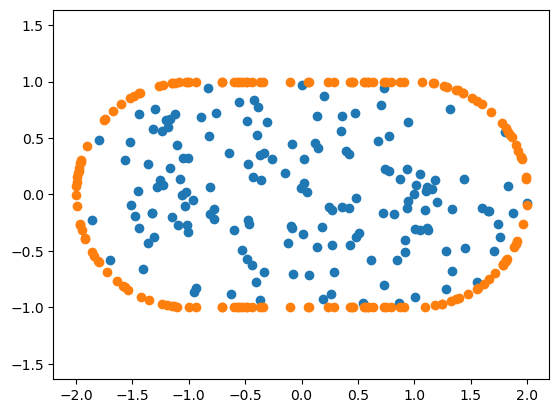

drrnn_Tanh


IntProgress(value=0, max=50)

drrnn_Tanh(
  (phi): Tanh()
  (stack): ModuleList(
    (0): Linear(in_features=2, out_features=10, bias=True)
    (1): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (2): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (3): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (4): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (5): Linear(in_features=10, out_features=1, bias=True)
  )
)
epoch: 0 loss: 1447.859375 loss_r: 0.8601105809211731 loss_b: 1305.6947708129883 reg_term: 141.30437850952148
epoch: 100 loss: 12.369163513183594 loss_r:

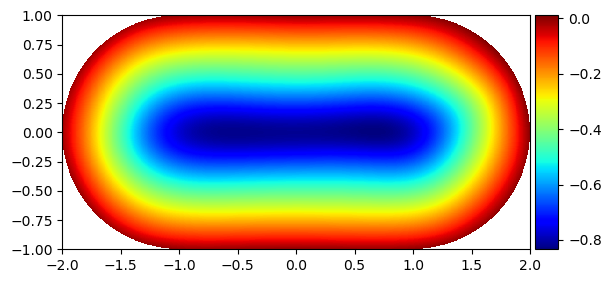

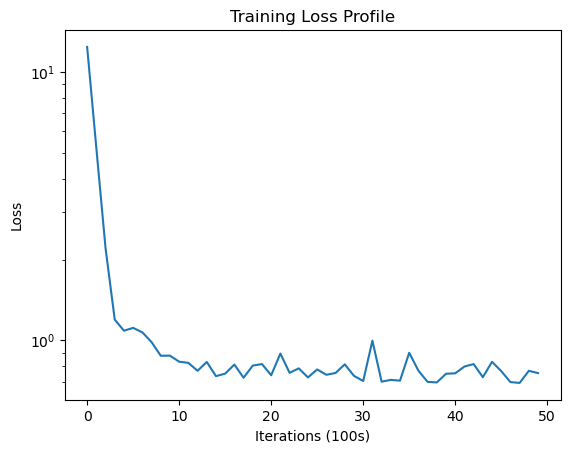

In [41]:
main_inf()

sausage 1


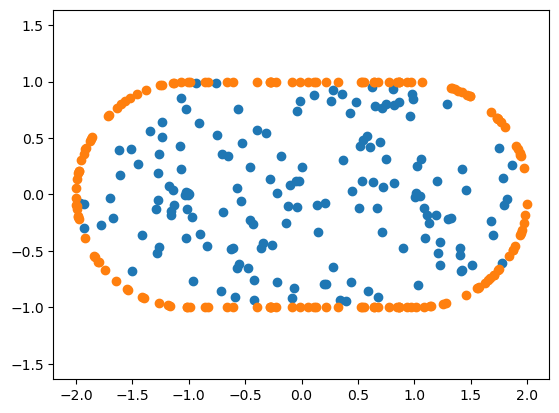

drrnn_Tanh


IntProgress(value=0, max=50)

drrnn_Tanh(
  (phi): Tanh()
  (stack): ModuleList(
    (0): Linear(in_features=2, out_features=10, bias=True)
    (1): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (2): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (3): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (4): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (5): Linear(in_features=10, out_features=1, bias=True)
  )
)
epoch: 0 loss: 1322.885986328125 loss_r: 0.5209477543830872 loss_b: 1244.585952758789 reg_term: 77.77901649475098
epoch: 100 loss: 3.4184365272521973 los

/opt/conda/lib/python3.9/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


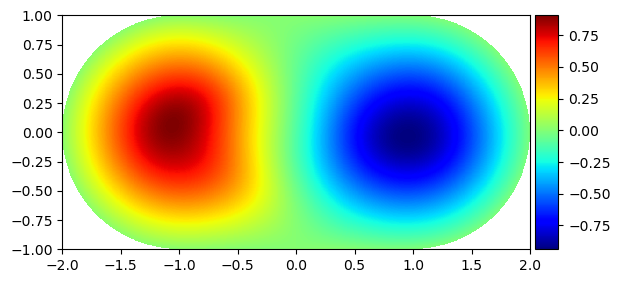

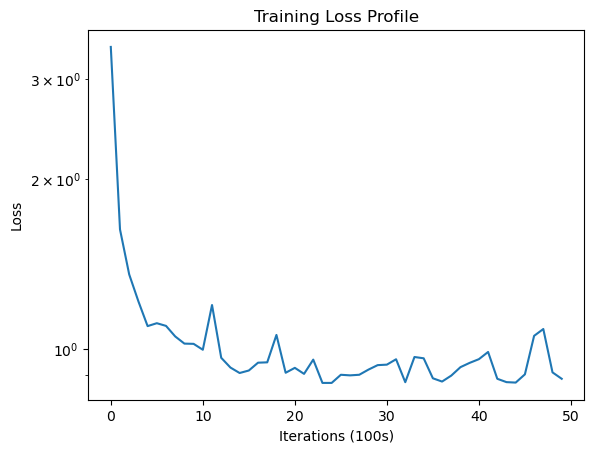

In [27]:
main_inf()

sausage 1


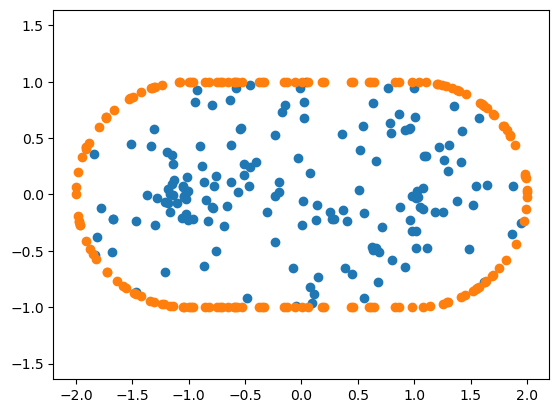

drrnn_Tanh


IntProgress(value=0, max=200)

drrnn_Tanh(
  (phi): Tanh()
  (stack): ModuleList(
    (0): Linear(in_features=2, out_features=10, bias=True)
    (1): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (2): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (3): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (4): Block(
      (L1): Linear(in_features=10, out_features=10, bias=True)
      (L2): Linear(in_features=10, out_features=10, bias=True)
      (phi): Tanh()
    )
    (5): Linear(in_features=10, out_features=1, bias=True)
  )
)
epoch: 0 loss: 390.82379150390625 loss_r: 0.938748300075531 loss_b: 384.18840408325195 reg_term: 5.69662868976593
epoch: 100 loss: 1.9411406517028809 los

epoch: 6000 loss: 0.7350494861602783 loss_r: 0.6787359714508057 loss_b: 0.03188306582160294 reg_term: 0.024430432822555304
epoch: 6100 loss: 0.7271968126296997 loss_r: 0.6886566877365112 loss_b: 0.03819438745267689 reg_term: 0.0003457157436059788
epoch: 6200 loss: 0.8652651309967041 loss_r: 0.7393263578414917 loss_b: 0.030374295311048627 reg_term: 0.09556450881063938
epoch: 6300 loss: 0.7681844234466553 loss_r: 0.7224285006523132 loss_b: 0.012717974314000458 reg_term: 0.03303796984255314
epoch: 6400 loss: 0.7168050408363342 loss_r: 0.6917001605033875 loss_b: 0.024672994622960687 reg_term: 0.00043189724237890914
epoch: 6500 loss: 0.7028906345367432 loss_r: 0.6948968768119812 loss_b: 0.007686094322707504 reg_term: 0.0003076708162552677
epoch: 6600 loss: 0.740580677986145 loss_r: 0.658942699432373 loss_b: 0.04309798241592944 reg_term: 0.038540035020560026
epoch: 6700 loss: 0.7425765991210938 loss_r: 0.7121829986572266 loss_b: 0.00724020108464174 reg_term: 0.023153414949774742
epoch: 6800 

epoch: 12700 loss: 0.7047489881515503 loss_r: 0.6697090864181519 loss_b: 0.032651309156790376 reg_term: 0.0023886094277258962
epoch: 12800 loss: 0.684275209903717 loss_r: 0.6619288921356201 loss_b: 0.013530108262784779 reg_term: 0.008816180634312332
epoch: 12900 loss: 0.7374251484870911 loss_r: 0.6821214556694031 loss_b: 0.05523201311007142 reg_term: 7.171242032200098e-05
epoch: 13000 loss: 0.6793699264526367 loss_r: 0.6442241668701172 loss_b: 0.028444931376725435 reg_term: 0.006700818776153028
epoch: 13100 loss: 0.7583361268043518 loss_r: 0.7063708305358887 loss_b: 0.013799416192341596 reg_term: 0.03816588781774044
epoch: 13200 loss: 0.6728966236114502 loss_r: 0.6675834655761719 loss_b: 0.004201583506073803 reg_term: 0.0011115712550235912
epoch: 13300 loss: 0.7394594550132751 loss_r: 0.7020381093025208 loss_b: 0.014767359243705869 reg_term: 0.022653997875750065
epoch: 13400 loss: 0.7007151246070862 loss_r: 0.6744580268859863 loss_b: 0.02625604800414294 reg_term: 1.063003907120219e-06


epoch: 19400 loss: 0.6953298449516296 loss_r: 0.6764031052589417 loss_b: 0.01882506301626563 reg_term: 0.00010168754670303315
epoch: 19500 loss: 0.7103533744812012 loss_r: 0.6540976166725159 loss_b: 0.030293382005766034 reg_term: 0.025962356012314558
epoch: 19600 loss: 0.699712336063385 loss_r: 0.6839153170585632 loss_b: 0.005409468139987439 reg_term: 0.010387510992586613
epoch: 19700 loss: 0.6993392109870911 loss_r: 0.6640573143959045 loss_b: 0.035158011596649885 reg_term: 0.00012384610272420105
epoch: 19800 loss: 0.7264745235443115 loss_r: 0.6863185167312622 loss_b: 0.008668454247526824 reg_term: 0.031487494707107544
epoch: 19900 loss: 0.7152912616729736 loss_r: 0.6343955993652344 loss_b: 0.00834107369882986 reg_term: 0.0725545734167099
epoch: 20000 loss: 0.8110994100570679 loss_r: 0.716040849685669 loss_b: 0.011365831887815148 reg_term: 0.08369269780814648
best epoch: 17100 best loss: 0.6562992334365845
load from ckpt!


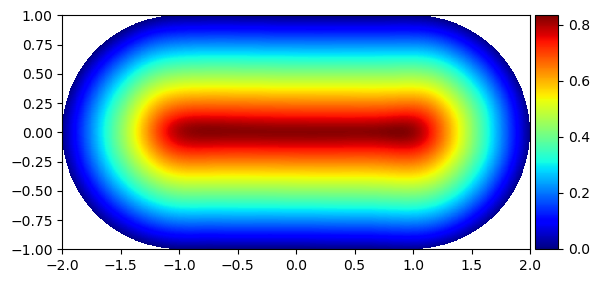

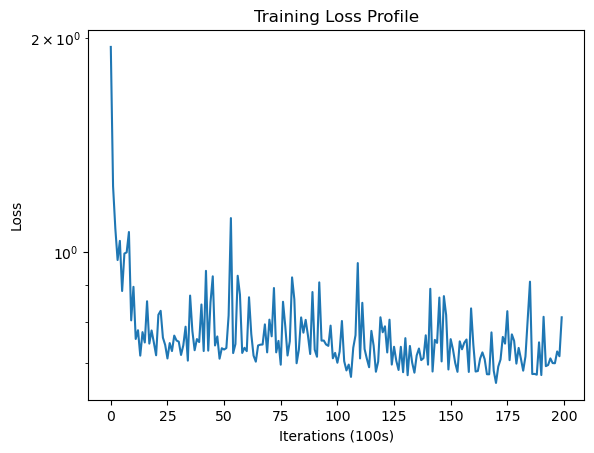

In [42]:
main_inf(epochs=20000)

/tmp/ipykernel_141/2723345759.py:41: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  surf2 = ax.scatter(A[:,0], A[:,1], D.detach().numpy(), cmap=cm.jet, linewidth=0, color = 'b')
/tmp/ipykernel_141/2723345759.py:42: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  surf3 = ax.scatter(A2[:,0], A2[:,1], D2.detach().numpy(), cmap=cm.jet, linewidth=0, color = 'b')


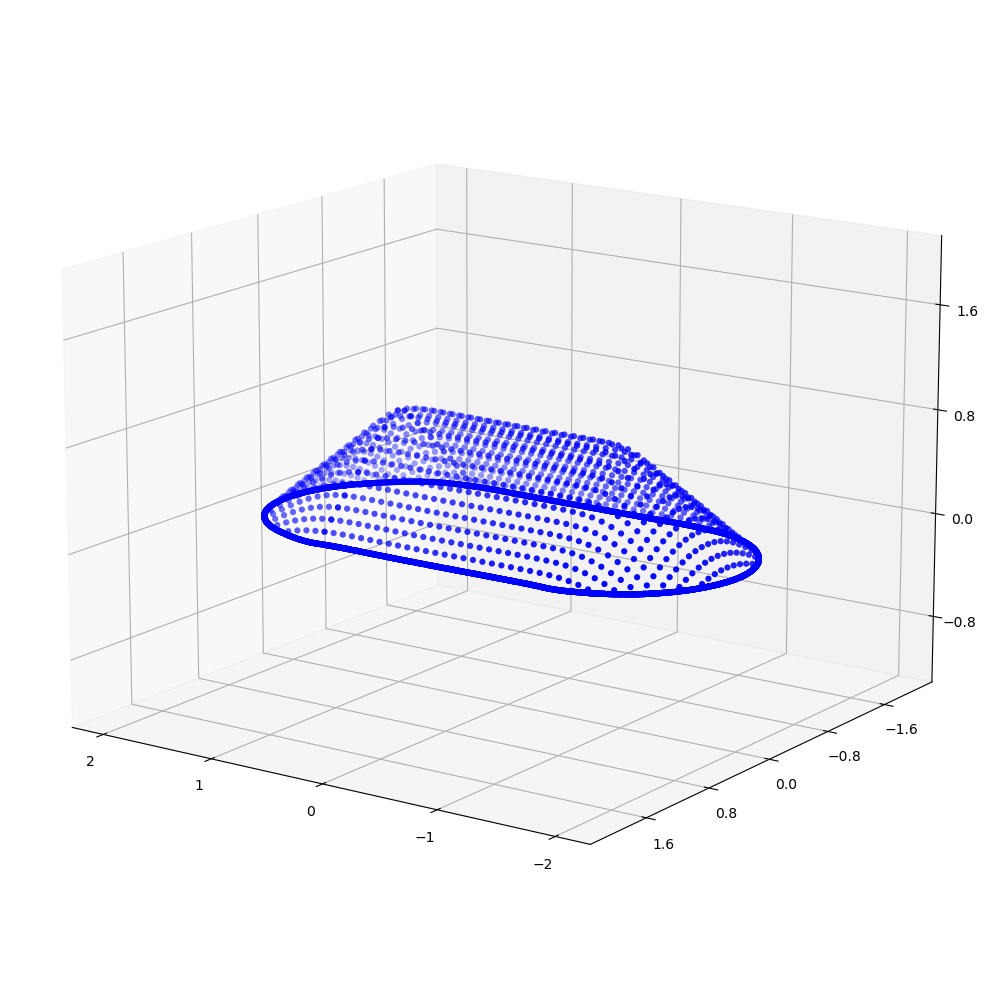

In [37]:
# 3D PLOT 
import numpy as np
import torch

import sys

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
#from mpl_toolkits.mplot3d import axes3d
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.pyplot import figure

from numpy.random import randn
from scipy import array, newaxis

num_points=1001
x = torch.linspace(-1, 1, 1001)
Y, X = torch.meshgrid(x, x)

device = torch.device('cpu')
A = get_boundary_points_sausage(N=5000)
A2 = get_interior_points_sausage_reg(N=25)


model = drfnn_Tanh(2, 10, 1).to(device)
    
# PLOT SETUP
#model.load_state_dict(torch.load('new_best_deep_ritz_eigenproblem_inf__sausage_drrnn_Tanh_20000.mdl'))
model.load_state_dict(torch.load('saved_models/best_sausage_drfnn_Tanh25000.mdl'))
D = model(A)
D2 = model(A2)

fig = plt.figure()
fig.set_size_inches(10, 10)

ax = fig.add_subplot(1, 1, 1, projection='3d')

surf2 = ax.scatter(A[:,0], A[:,1], D.detach().numpy(), cmap=cm.jet, linewidth=0, color = 'b')
surf3 = ax.scatter(A2[:,0], A2[:,1], D2.detach().numpy(), cmap=cm.jet, linewidth=0, color = 'b')

ax.view_init(azim=125, elev=15)
#ax.view_init(azim=0, elev=0)

ax.xaxis.set_major_locator(MaxNLocator(5))
ax.yaxis.set_major_locator(MaxNLocator(6))
ax.zaxis.set_major_locator(MaxNLocator(5))

fig.tight_layout()

plt.axis('equal')
plt.savefig('pointwise_plots/first_eigenvalue.png')
plt.show()